# Trabajo de Bagging & Boosting

Imaginemos que queremos comprar la vivienda en la que residimos de alquiler y que, nuestro casero nos hace una oferta para comprarle el piso. De cara a tomar esta decisión nos planteamos generar un modelo de machine learning que nos ayude a determinar cuánto debemos pagar por la vivienda. El objetivo de este proyecto es generar un modelo que sea capaz de predecir el precio de venta de una vivienda en base al dataset de venta y posteriormente hacer uso de esa información en el dataset de alquiler.

Este proyecto no tiene una solución única. Muchas opciones pueden ser válidas.

### Predicción del precio de venta de la vivienda en la ciudad de Barcelona

Descripción del dataset:

|Columna|Descripción|Key|
|--|--|--|
|id|Identificador numérico de la vivienda||
|price|Precio de mercado de la vivienda||
|currency|Moneda|Euros / Mes|
|latitude|Latitud de las coordenadas geográficas de la vivienda||
|longitude|Longitud de las coordenadas geográficas de la vivienda||
|sq_meters|Metros cuadrados de la vivienda||
|sq_meters_built|Metros cuadrados construídos de la vivienda||
|rooms|Número de habitaciones||
|bathrooms|Número de baños||
|balcony|Indicador si la vivienda tiene balcón|1, 0|
|terrace|Indicador si la vivienda tiene terraza|1, 0|
|exterior|Indicador si la vivienda tiene una orientación exterior o interior en el edificio|1, 0|
|orientation|Orientación principal de la vivienda|norte, sur, este, oeste|
|floor|Piso de la vivienda||
|rooftop|Indicador si la vivienda es un ático|1, 0|
|elevator|Indicador si el edificio de la vivienda tiene ascensor|1, 0|
|doorman|Indicador si el edificio tiene portero|1,0|
|pool|Indicador si la vivienda cuenta con piscina o derecho de uso de piscina|1,0|
|ac|Indicador si tiene aire acondicionado|1,0|
|heating|Indicador si tiene calefacción|bomba, electric, gas, individual|
|year_built|Año de construcción||
|quality|Indicador de calidad de la vivienda|2 - En buen estado|
|city|Ciudad de la vivienda||
|neighborhood|Barrio de la vivienda||
|dist_city_center|Distancia en kilómetros al centro de la ciudad||
|furniture|Indicador si la vivienda cuenta con mobiliario|1: Sin Equipar; 2: Cocina Equipada; 3: Amueblado|
|garage|Indicador si la vivienda tiene garage|1, 0|
|property_type|Tipo de vivienda||
|garden|Indicador si la vivienda cuenta con jardín|1,0|
|closest_station|Nombre de la estación de metro más cercana||
|dist_closest_station|Distancia en kilómetros a la estación de metro más cercana||
|created_at|Fecha de creación del anuncio||
|last_seen|Fecha última en la que el anuncio fue publicado en la web||



#### Carga de librerías y dataset

In [1]:
# Library load
import os
import pandas as pd
import numpy as np

# Plotting library
import seaborn as sn
import matplotlib.pyplot as plt

# Funciones para hacer cálculo estadístico
import statsmodels.api as sm
from statsmodels.formula.api import ols

# sklearn packages
from sklearn.preprocessing import StandardScaler # Análisis de PCA
from sklearn import metrics # Calcula métricas para un modelo
from sklearn import tree # Cálculo de decision trees
from sklearn.tree import DecisionTreeClassifier # Generación de modelos de decision tree
from sklearn.ensemble import BaggingClassifier # Generación de modelos de bagging
from sklearn.ensemble import RandomForestClassifier # Generación de modelo de random forest
from sklearn.model_selection import train_test_split # Hace split entre training y testing
from sklearn.model_selection import cross_validate # trains model with cross validation
from sklearn.model_selection import GridSearchCV # Optimización de hiperparámetros para un modelo
from sklearn.preprocessing import OneHotEncoder # One Hot encoding de las variables categóricas

# Confusion matrix viz
from mlxtend.evaluate import confusion_matrix # Calcula la matriz de confusion 
from mlxtend.plotting import plot_confusion_matrix #plot de la matriz de confusión

# Ignoring warning messages
import warnings
warnings.filterwarnings('ignore') #ignora los errores en el notebook

## Análisis exploratorio y limpieza de instancias:

In [2]:
raw_data = pd.read_csv('processed_sale_Barcelona.csv', delimiter = ',')
raw_data.head()

,id,price,currency,latitude,longitude,sq_meters,sq_meters_built,rooms,bathrooms,balcony,...,neighborhood,dist_city_center,furniture,garage,property_type,garden,closest_station,dist_closest_station,created_at,last_seen
0,320294,150000,€,41.459649,2.174793,63.0,67,3,1,NaN,...,Ciutat Meridiana - Torre Baró - Vallbona,7.990993,NaN,NaN,piso,NaN,Ciutat Meridiana,0.121438,9/3/2021 10:16,11/12/2021 13:50
1,1786997,150000,€,41.422081,2.155370,48.0,52,2,1,NaN,...,El Carmel,3.991000,NaN,NaN,piso,NaN,El Carmel,0.277336,9/3/2021 10:16,11/12/2021 13:50
2,1787143,395000,€,41.402928,2.207851,84.0,91,2,2,NaN,...,El Poblenou,3.579261,NaN,NaN,duplex,NaN,Poblenou,0.383878,8/30/2021 12:17,8/30/2021 12:17
3,1976767,540000,€,41.394692,2.144422,NaN,100,3,1,NaN,...,Sant Gervasi - Galvany,2.257852,NaN,1.0,piso,NaN,Hospital Clínic,0.875652,9/1/2021 14:04,9/2/2021 13:50
4,27972575,650000,€,41.398971,2.120754,NaN,141,3,2,NaN,...,Sarrià,4.283368,NaN,1.0,piso,NaN,Maria Cristina,1.310073,8/29/2021 11:47,9/2/2021 11:01


In [3]:
# Cantidad de registros originales utilizando la función len() y .shape 
print("Cantidad de registros: ", len(raw_data))
print("Tamaño del dataset: ", raw_data.shape)

Cantidad de registros:  5847
Tamaño del dataset:  (5847, 33)


In [4]:
# tipos de datos en el dataframe
data_types = raw_data.dtypes

# display the data types of each column
print(data_types)

id                        int64
price                     int64
currency                 object
latitude                float64
longitude               float64
sq_meters               float64
sq_meters_built           int64
rooms                     int64
bathrooms                 int64
balcony                 float64
terrace                 float64
exterior                float64
orientation              object
floor                   float64
rooftop                 float64
elevator                float64
doorman                 float64
pool                    float64
ac                      float64
heating                  object
year_built              float64
quality                   int64
city                     object
neighborhood             object
dist_city_center        float64
furniture               float64
garage                  float64
property_type            object
garden                  float64
closest_station          object
dist_closest_station    float64
created_

Evaluamos cuántos registros tienen valores nulos por variable

In [5]:
raw_data.isna().sum()

id                         0
price                      0
currency                   0
latitude                   0
longitude                  0
sq_meters               2573
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                 3637
terrace                 4419
exterior                1077
orientation             2713
floor                   2082
rooftop                 5440
elevator                 571
doorman                 5847
pool                    5677
ac                      3198
heating                 2490
year_built              1765
quality                    0
city                       0
neighborhood               0
dist_city_center           0
furniture               5847
garage                  5442
property_type              2
garden                  5786
closest_station            0
dist_closest_station       0
created_at                 0
last_seen                  0
dtype: int64

Retiramos las variables que no nos importan para el modelo

In [6]:
sale_dataset = raw_data[['price','sq_meters_built', 'rooms', 'bathrooms', 'balcony', 'terrace', 'exterior', 'orientation', 'floor', 'rooftop', 'elevator', 'pool', 'ac', 'heating', 'year_built', 'neighborhood', 'dist_city_center', 'garage', 'property_type', 'garden', 'dist_closest_station']]
sale_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,pool,ac,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station
0,150000,67,3,1,NaN,1.0,1.0,este,5.0,NaN,...,NaN,1.0,NaN,NaN,Ciutat Meridiana - Torre Baró - Vallbona,7.990993,NaN,piso,NaN,0.121438
1,150000,52,2,1,NaN,NaN,1.0,NaN,3.0,NaN,...,NaN,1.0,individual,NaN,El Carmel,3.991000,NaN,piso,NaN,0.277336
2,395000,91,2,2,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,1.0,electric,NaN,El Poblenou,3.579261,NaN,duplex,NaN,0.383878
3,540000,100,3,1,NaN,NaN,1.0,sur,1.0,NaN,...,NaN,1.0,NaN,NaN,Sant Gervasi - Galvany,2.257852,1.0,piso,NaN,0.875652
4,650000,141,3,2,NaN,NaN,1.0,este,1.0,NaN,...,NaN,1.0,NaN,NaN,Sarrià,4.283368,1.0,piso,NaN,1.310073


Vemos valores nulos nuevamente en el dataset con las variables que nos interesan

In [7]:
# Evaluamos cuántos registros tienen valores nulos por variable
sale_dataset.isna().sum()

price                      0
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                 3637
terrace                 4419
exterior                1077
orientation             2713
floor                   2082
rooftop                 5440
elevator                 571
pool                    5677
ac                      3198
heating                 2490
year_built              1765
neighborhood               0
dist_city_center           0
garage                  5442
property_type              2
garden                  5786
dist_closest_station       0
dtype: int64

Podemos asumir que para algunas de las variables, los valores nulos son en realidad 0.
Transformamos los valores nulos a 1 y 0. Y Orientation como Unknown al ser muchos valores.

In [8]:
sale_dataset['balcony'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['terrace'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['exterior'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['rooftop'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['elevator'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['pool'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['ac'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['garage'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['garden'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['floor'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
sale_dataset['orientation'].fillna("Unknown", inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor

In [9]:
# Evaluamos cuántos registros tienen valores nulos por variable
sale_dataset.isna().sum()

price                      0
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                    0
terrace                    0
exterior                   0
orientation                0
floor                      0
rooftop                    0
elevator                   0
pool                       0
ac                         0
heating                 2490
year_built              1765
neighborhood               0
dist_city_center           0
garage                     0
property_type              2
garden                     0
dist_closest_station       0
dtype: int64

In [10]:
# Create a boolean mask of null values
mask = sale_dataset.isnull().any(axis=1)

# Index the original dataframe using the mask to get only the rows with null values
null_rows = sale_dataset[mask]

# Print the null rows
print(null_rows)  

       price  sq_meters_built  rooms  bathrooms  balcony  terrace  exterior  \
0     150000               67      3          1      0.0      1.0       1.0   
1     150000               52      2          1      0.0      0.0       1.0   
2     395000               91      2          2      0.0      0.0       1.0   
3     540000              100      3          1      0.0      0.0       1.0   
4     650000              141      3          2      0.0      0.0       1.0   
...      ...              ...    ...        ...      ...      ...       ...   
5840  150000               67      2          1      1.0      0.0       1.0   
5843   79000               34      1          1      0.0      1.0       0.0   
5844   84900               30      0          1      0.0      0.0       0.0   
5845  150000               79      3          1      0.0      0.0       1.0   
5846  150000               85      3          1      1.0      0.0       1.0   

     orientation  floor  rooftop  ...  pool   ac   

Para otras, como por ejemplo year_built, creamos property_age, podemos transformarla a una variable categórica incluyendo los valores nulos de year_built como una categoría de unknown:

In [11]:
sale_dataset['property_age'] = 2023 - sale_dataset['year_built']
sale_dataset.head()
sale_dataset.tail()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,ac,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age
5842,146000,63,2,1,0.0,0.0,0.0,Unknown,0.0,0.0,...,1.0,individual,1962.0,Horta Guinardó,4.750976,0.0,piso,0.0,0.341163,61.0
5843,79000,34,1,1,0.0,1.0,0.0,Unknown,0.0,0.0,...,0.0,NaN,NaN,Sant Andreu,7.346138,0.0,piso,0.0,0.280344,NaN
5844,84900,30,0,1,0.0,0.0,0.0,Unknown,0.0,0.0,...,1.0,bomba,NaN,Ciutat Vella,0.971988,0.0,estudio,0.0,0.157078,NaN
5845,150000,79,3,1,0.0,0.0,1.0,Unknown,5.0,0.0,...,0.0,NaN,NaN,Baró de Viver,7.019433,0.0,piso,0.0,0.440968,NaN
5846,150000,85,3,1,1.0,0.0,1.0,Unknown,2.0,0.0,...,0.0,NaN,NaN,Baró de Viver,7.213495,0.0,piso,0.0,0.319661,NaN


array([[<AxesSubplot: title={'center': 'property_age'}>]], dtype=object)

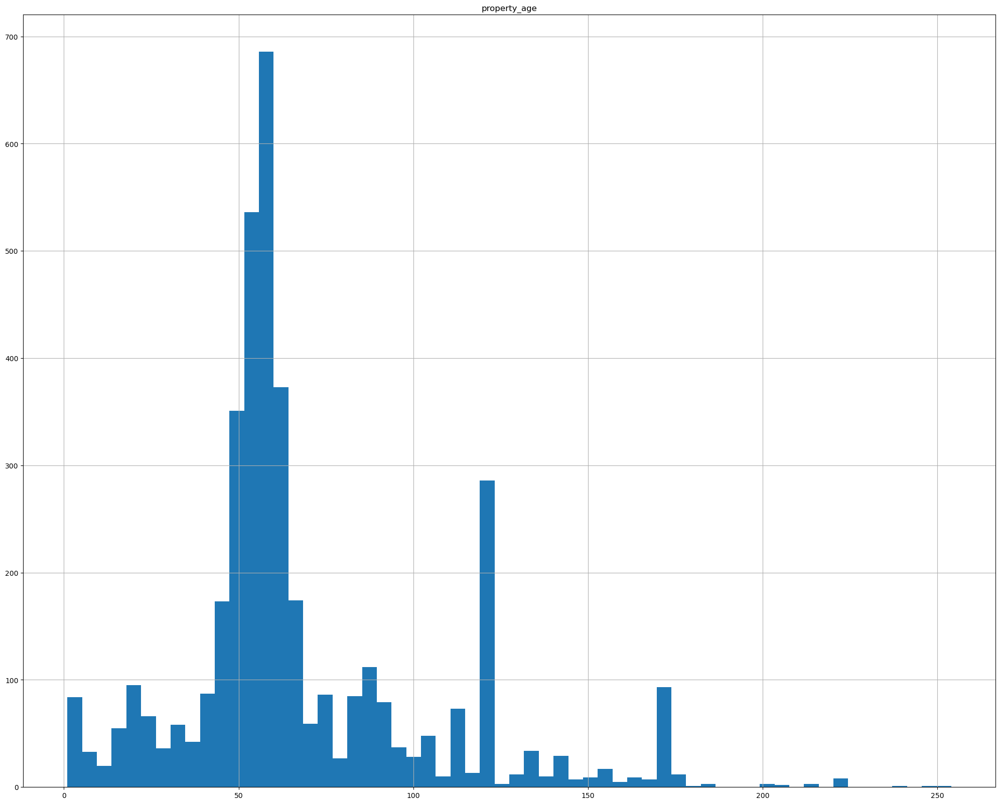

In [12]:
# Scatter matrix, similar a la función pairs. Cuidado que solo sive para variables numéricas
sale_dataset[['property_age']].hist(bins=60, figsize=(25, 20))

Apreciamos pequeños "clusters de viviendas, los cuales podemos agrupar en categorías según la edad de la vivienda:

In [13]:
def conditions(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 40)):
        return "0 - 40"
    elif ((x >= 40) & (x < 70)):
        return "40 - 70"
    elif ((x >= 70) & (x < 120)):
        return "70 - 120"
    elif ((x >= 120) & (x < 150)):
        return "120 - 150"
    elif ((x >= 150)):
        return "+150"
    else:
        return "Unknown"

func = np.vectorize(conditions)
sale_dataset['property_age_cat'] = func(sale_dataset['property_age'])
sale_dataset.tail()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age,property_age_cat
5842,146000,63,2,1,0.0,0.0,0.0,Unknown,0.0,0.0,...,individual,1962.0,Horta Guinardó,4.750976,0.0,piso,0.0,0.341163,61.0,40 - 70
5843,79000,34,1,1,0.0,1.0,0.0,Unknown,0.0,0.0,...,NaN,NaN,Sant Andreu,7.346138,0.0,piso,0.0,0.280344,NaN,Unknown
5844,84900,30,0,1,0.0,0.0,0.0,Unknown,0.0,0.0,...,bomba,NaN,Ciutat Vella,0.971988,0.0,estudio,0.0,0.157078,NaN,Unknown
5845,150000,79,3,1,0.0,0.0,1.0,Unknown,5.0,0.0,...,NaN,NaN,Baró de Viver,7.019433,0.0,piso,0.0,0.440968,NaN,Unknown
5846,150000,85,3,1,1.0,0.0,1.0,Unknown,2.0,0.0,...,NaN,NaN,Baró de Viver,7.213495,0.0,piso,0.0,0.319661,NaN,Unknown


In [14]:
# Evaluamos cuántos registros tienen valores nulos por variable
sale_dataset.isna().sum()

price                      0
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                    0
terrace                    0
exterior                   0
orientation                0
floor                      0
rooftop                    0
elevator                   0
pool                       0
ac                         0
heating                 2490
year_built              1765
neighborhood               0
dist_city_center           0
garage                     0
property_type              2
garden                     0
dist_closest_station       0
property_age            1765
property_age_cat           0
dtype: int64

Del dataset que tenemos, generamos un subset con valores numéricos únicamente:

In [15]:
cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat']
sale_dataset_numeric = sale_dataset.drop(cat_features, axis = 1)
sale_dataset_numeric

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,year_built,dist_city_center,garage,garden,dist_closest_station,property_age
0,150000,67,3,1,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,NaN,7.990993,0.0,0.0,0.121438,NaN
1,150000,52,2,1,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,NaN,3.991000,0.0,0.0,0.277336,NaN
2,395000,91,2,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,NaN,3.579261,0.0,0.0,0.383878,NaN
3,540000,100,3,1,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,NaN,2.257852,1.0,0.0,0.875652,NaN
4,650000,141,3,2,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,NaN,4.283368,1.0,0.0,1.310073,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5842,146000,63,2,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1962.0,4.750976,0.0,0.0,0.341163,61.0
5843,79000,34,1,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,7.346138,0.0,0.0,0.280344,NaN
5844,84900,30,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,0.971988,0.0,0.0,0.157078,NaN
5845,150000,79,3,1,0.0,0.0,1.0,5.0,0.0,1.0,0.0,0.0,NaN,7.019433,0.0,0.0,0.440968,NaN


Comprobamos que no hay nulls

In [16]:
sale_dataset_numeric_no_nulls = sale_dataset_numeric.drop(['year_built', 'property_age', 'floor'], axis = 1)
sale_dataset_numeric_no_nulls.isnull().sum() / len(sale_dataset_numeric_no_nulls)

price                   0.0
sq_meters_built         0.0
rooms                   0.0
bathrooms               0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
garage                  0.0
garden                  0.0
dist_closest_station    0.0
dtype: float64

#### Tratamiento de sq_meters_built en relación al número de habitaciones y de baños

Las clases de redes Bayesianas podemos decorrelar variables siempre y cuando encontremos una tercera variable que sea la causante del crecimiento o decrecimiento de las dos. En este caso, el tamaño de la vivienda nos servirá para decorrelar el número de habitaciones y el número de baños

In [17]:
sale_dataset_numeric_no_nulls['rooms_per_sqm'] = sale_dataset_numeric_no_nulls['rooms'] * 100 / sale_dataset_numeric_no_nulls['sq_meters_built']
sale_dataset_numeric_no_nulls['bathrooms_per_sqm'] = sale_dataset_numeric_no_nulls['bathrooms'] * 100 / sale_dataset_numeric_no_nulls['sq_meters_built']
sale_dataset_numeric_no_nulls = sale_dataset_numeric_no_nulls.drop(['rooms', 'bathrooms'], axis=1)
sale_dataset_numeric_no_nulls.head()

,price,sq_meters_built,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,garage,garden,dist_closest_station,rooms_per_sqm,bathrooms_per_sqm
0,150000,67,0.0,1.0,1.0,0.0,0.0,0.0,1.0,7.990993,0.0,0.0,0.121438,4.477612,1.492537
1,150000,52,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.991000,0.0,0.0,0.277336,3.846154,1.923077
2,395000,91,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.579261,0.0,0.0,0.383878,2.197802,2.197802
3,540000,100,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.257852,1.0,0.0,0.875652,3.000000,1.000000
4,650000,141,0.0,0.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.0,0.0,1.310073,2.127660,1.418440


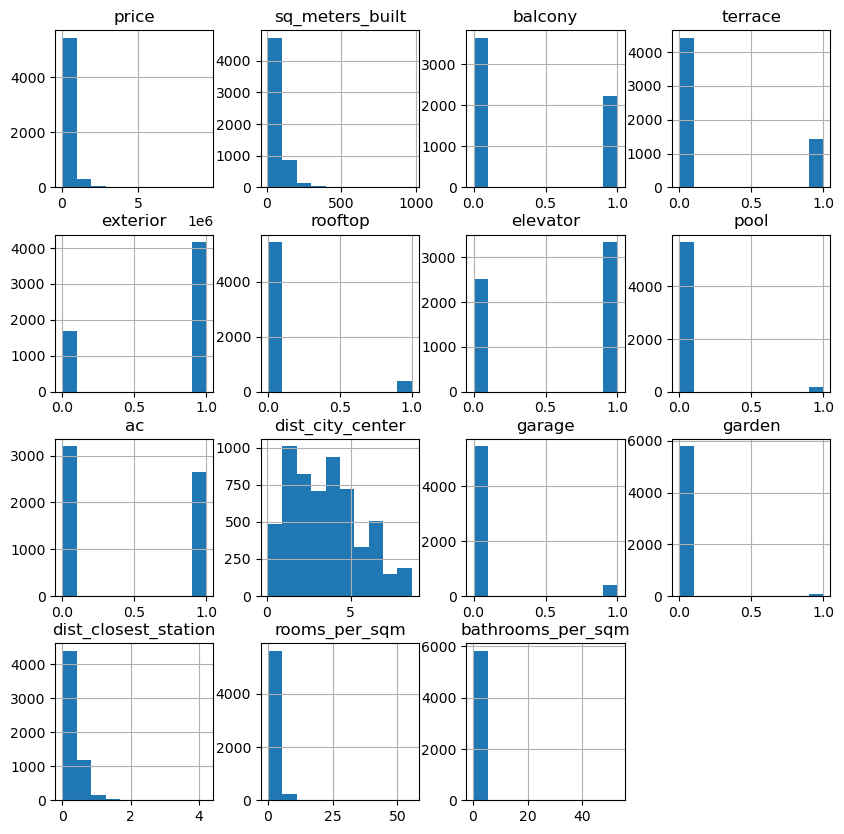

In [18]:
flag = False
sale_dataset_numeric_no_nulls.hist(figsize=(10, 10))
plt.show()
flag = True

Para la variable objetivo

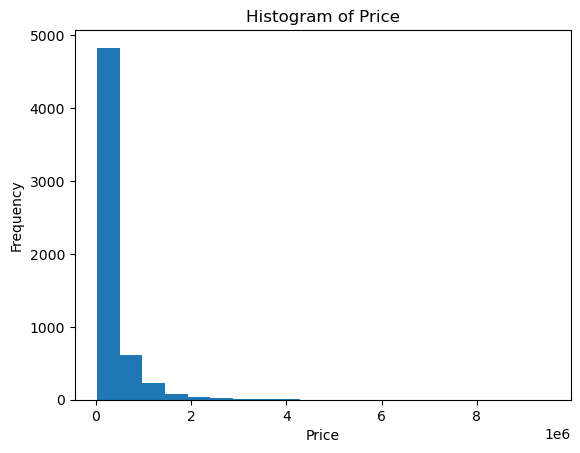

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# plot a histogram of the price variable
plt.hist(sale_dataset_numeric_no_nulls['price'], bins=20)
plt.title('Histogram of Price')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

Los distintos histogramas nos muestran distribuciones entre 0 y 1 respectivamente, esto es lógico debido a que son valores de características que puede o no tener una propiedad. En cuanto a la variable price, sq_meters_built, dist_closest_station, y rooms_per_sqm, tienen picos de datos en su extrema izquierda, podríamos decir que siguen una distribución sesgada a la izquierda, los datos se concentran a la izquierda de la distribución. El histograma de dist_city_center nos muestra que los valores podrían seguir una distribución normal.

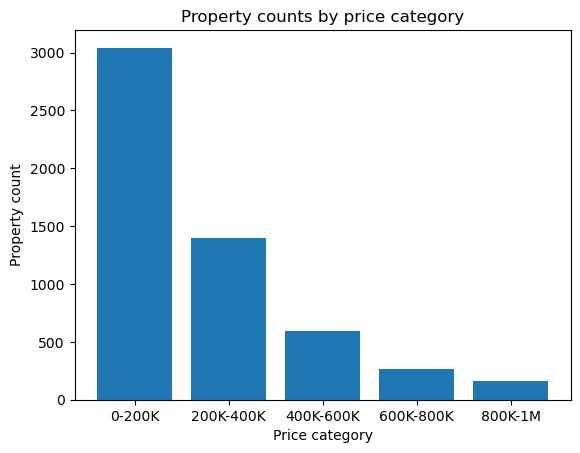

In [20]:

# bin prices into categories
bins = [0, 200000, 400000, 600000, 800000, 1000000]
labels = ['0-200K', '200K-400K', '400K-600K', '600K-800K', '800K-1M']
sale_dataset['price_category'] = pd.cut(sale_dataset['price'], bins=bins, labels=labels)

# count the number of properties in each price category
price_counts = sale_dataset['price_category'].value_counts()

# plot a bar chart of price categories vs property counts
plt.bar(price_counts.index, price_counts.values)
plt.title('Property counts by price category')
plt.xlabel('Price category')
plt.ylabel('Property count')
plt.show()

Se agrupó la variable target en categorías para visuizar la dispersión de valores. Vemos que la mayoría de las propiedades estáne ntre 0 y 400.000 euros.

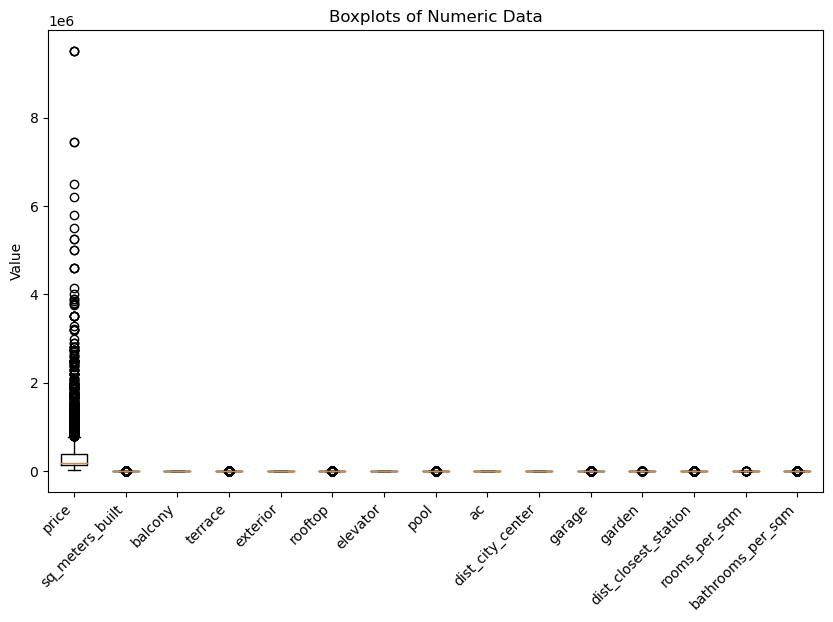

In [21]:
import matplotlib.pyplot as plt

# Create a figure and axis object with a larger size
fig, ax = plt.subplots(figsize=(10, 6))

# Create the boxplot
ax.boxplot(sale_dataset_numeric_no_nulls.values)

# Set the x-axis tick labels and rotate them by 45 degrees
ax.set_xticklabels(sale_dataset_numeric_no_nulls.columns, rotation=45, ha='right')

# Add a title and y-axis label
ax.set_title('Boxplots of Numeric Data')
ax.set_ylabel('Value')

# Show the plot
plt.show()

En cuanto a detección de outlyers, el boxplot es un instrumento muy astuto y no se fía de los valores muy muy grandes o los valores muy muy pequeños. Los calificará como raros y como sabemos los pinta con puntos.

Para distinguir si son valores raros o outliers el boxplot utiliza una regla sencilla. Cualquier valor que sea más grande que 1.5 veces la distancia de la caja + cuartil 3 es un valor muy muy grande. El bloxplot lo considerará un valor extraño o outlier. Lo dibujará con una cruz o un puntito.

También para los valores muy muy pequeños. Cualquier valor de la variable que sea menor que el cuartil 1 menos la distancia de la caja, el boxplot lo considerará un valor muy muy pequeño. Será un valor raro o outlier. Lo dibujará con puntos.

En los diferentes casos, vemos outliers para Price en valores máximos pero es muy difícil ver para las otras variables. 

Seguiremos analizando en profundidad excluyendo la variable price.

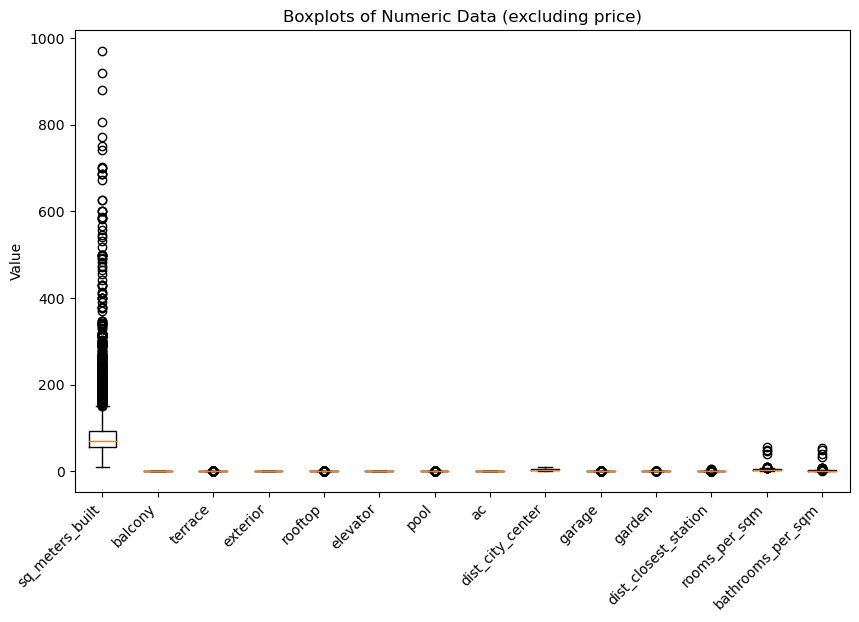

In [22]:
import matplotlib.pyplot as plt

# Name of variable to exclude from the boxplot
variable_to_exclude = 'price'

# Create a new dataframe without the excluded variable
sale_dataset_numeric_no_nulls_exclude = sale_dataset_numeric_no_nulls.drop(variable_to_exclude, axis=1)

# Create a figure and axis object with a larger size
fig, ax = plt.subplots(figsize=(10, 6))

# Create the boxplot
ax.boxplot(sale_dataset_numeric_no_nulls_exclude.values)

# Set the x-axis tick labels and rotate them by 45 degrees
ax.set_xticklabels(sale_dataset_numeric_no_nulls_exclude.columns, rotation=45, ha='right')

# Add a title and y-axis label
ax.set_title('Boxplots of Numeric Data (excluding {})'.format(variable_to_exclude))
ax.set_ylabel('Value')

# Show the plot
plt.show()

Vemos ahora que sq_meters_built tiene también valores atípicos. Seguiremos explorando las otras.

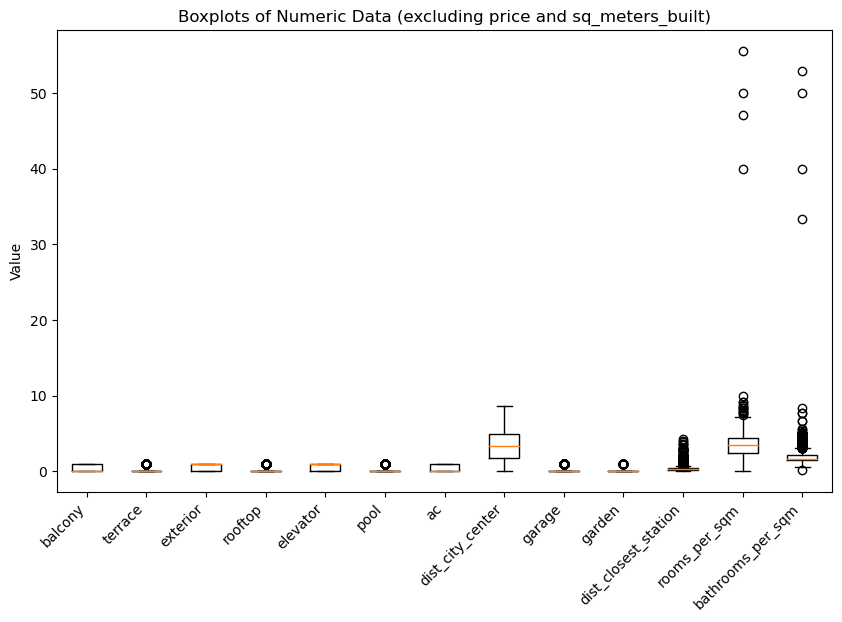

In [23]:
import matplotlib.pyplot as plt

# List of variables to exclude from the boxplot
variables_to_exclude = ['price', 'sq_meters_built']

# Create a new dataframe without the excluded variables
sale_dataset_numeric_no_nulls_exclude = sale_dataset_numeric_no_nulls.drop(variables_to_exclude, axis=1)

# Create a figure and axis object with a larger size
fig, ax = plt.subplots(figsize=(10, 6))

# Create the boxplot
ax.boxplot(sale_dataset_numeric_no_nulls_exclude.values)

# Set the x-axis tick labels and rotate them by 45 degrees
ax.set_xticklabels(sale_dataset_numeric_no_nulls_exclude.columns, rotation=45, ha='right')

# Add a title and y-axis label
ax.set_title('Boxplots of Numeric Data (excluding {} and {})'.format(variables_to_exclude[0], variables_to_exclude[1]))
ax.set_ylabel('Value')

# Show the plot
plt.show()

Podemos ver que la mayoría de las variables tienen valores atípicos. 

Para variables categóricas podemos hacer la función groupby, explorar los datos y sacar algunos insights

In [24]:
sale_dataset[['property_age_cat', 'price']].groupby('property_age_cat').agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    stantard_deviation=('price', "std")
).sort_values(by='max_price', ascending=False)

,category_count,mean_price,median_price,min_price,max_price,stantard_deviation
property_age_cat,,,,,,
0 - 40,494,784521.457490,462500.0,60000,9500000,1.019652e+06
Unknown,1765,288529.155241,150000.0,28000,9500000,4.443370e+05
70 - 120,630,522310.792063,315000.0,35000,6500000,6.327598e+05
40 - 70,2402,295130.311407,160000.0,29000,5000000,3.526147e+05
+150,172,318015.697674,152000.0,60000,3500000,4.208745e+05
120 - 150,384,415285.437500,242000.0,39000,2600000,4.363978e+05


Lo que podemos ver es que el precio medio más alto se encuentra entre las propiedades entre 0 y 40 años de antiguedad (€784521.45) y el precio más bajo en la propiedades entre 40 - 70 de antiguedad (€295130.31) a pesar de tener más valores contados (2402). En realidad el precio medio más bajo nos muestra a la categoría Unknown con €288529.15.
El precio máximo de una vivienda puede llegar a €9500000 y el mínimo a €28000.

In [25]:
sale_dataset[['neighborhood', 'price']].groupby('neighborhood').agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    standard_deviation=('price', "std")
).sort_values(by='max_price', ascending=False)

,category_count,mean_price,median_price,min_price,max_price,standard_deviation
neighborhood,,,,,,
Pedralbes,31,1.676097e+06,1250000.0,135000,9500000,1.661306e+06
Les Corts,151,9.451040e+05,450000.0,35000,9500000,1.417215e+06
Sarrià-Sant Gervasi,176,1.263114e+06,970000.0,110000,7450000,1.075015e+06
La Dreta de l'Eixample,130,9.142008e+05,680000.0,87000,6500000,8.549630e+05
Sant Gervasi - La Bonanova,25,1.412560e+06,1040000.0,125000,5500000,1.330374e+06
...,...,...,...,...,...,...
La Trinitat Vella,51,1.181782e+05,119500.0,68000,205000,2.553721e+04
Les Roquetes,112,1.157896e+05,119950.0,50000,200000,2.862224e+04
La Trinitat Nova,52,1.245251e+05,119500.0,79000,193000,3.121055e+04


Las propiedades más caras se encuentran en el barrio de Pedralbes y Les Corts, siguiendo por Sarrià-Sant Gervasi y La Dreta de l'Eixample. 

In [26]:
sale_dataset[['orientation', 'price']].groupby('orientation').agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    standard_deviation=('price', "std")
).sort_values(by='max_price', ascending=False)

,category_count,mean_price,median_price,min_price,max_price,standard_deviation
orientation,,,,,,
sur,1423,427826.712579,259000.0,35000,9500000,565515.791528
Unknown,2713,344190.852562,157000.0,28000,9500000,540493.278766
norte,748,430513.703209,225000.0,55000,7450000,627841.482076
este,670,309705.356716,191000.0,48000,2800000,316708.806589
oeste,293,262186.484642,198000.0,60000,2750000,238724.233086


Podemos ver que la orientación de las propiedades parece tener un impacto en el precio. Las propiedades ubicadas en el norte y el sur tienen un precio medio más alto que las ubicadas en el este y el oeste. Sin embargo, es importante señalar que el número de propiedades en cada categoría no está distribuido uniformemente, con un mayor número de propiedades con una orientación desconocida.

La desviación estándar de los precios es bastante alta en todas las categorías, lo que indica una amplia gama de precios dentro de cada orientación. También vale la pena mencionar que la propiedad de mayor precio se encuentra en el sur, mientras que la propiedad de menor precio se encuentra en el este.

In [27]:
sale_dataset[['property_type', 'price']].groupby('property_type').agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    standard_deviation=('price', "std")
).sort_values(by='max_price', ascending=False)

,category_count,mean_price,median_price,min_price,max_price,standard_deviation
property_type,,,,,,
chalet,41,2.144449e+06,1750000.0,103000,9500000,1.942655e+06
chalet_adosado,33,1.267212e+06,739000.0,228000,9500000,1.719699e+06
chalet_independiente,35,2.461071e+06,1985000.0,89000,9500000,2.304498e+06
piso,5111,3.250181e+05,187000.0,28000,6500000,3.650784e+05
atico,298,5.775676e+05,348500.0,65000,4150000,6.270898e+05
chalet_pareado,17,9.419406e+05,390000.0,129990,3290000,9.522874e+05
duplex,89,5.497500e+05,415000.0,65000,2800000,4.987352e+05
estudio,221,1.259421e+05,120000.0,43000,540000,5.873960e+04


El tipo de propiedad más común en el conjunto de datos es el "piso" (apartamento) con más de 5000 listados, si bien tiene un precio promedio más bajo que otros tipos, todavía tiene una desviación estándar relativamente alta, lo que indica que existe una amplia gama de precios dentro de esta categoría. El tipo de propiedad más caro de media es el "chalet independiente", con un precio medio de casi 2,5 millones de euros, seguido del "chalet" con un precio medio superior a los 2 millones de euros.

El "estudio" es el tipo de propiedad con el precio promedio más bajo, lo cual no es de extrañar dado que suele ser un tipo de propiedad más pequeña y menos lujosa.

Seguiremos analizando en profundidad a través de un análisis de correlación.

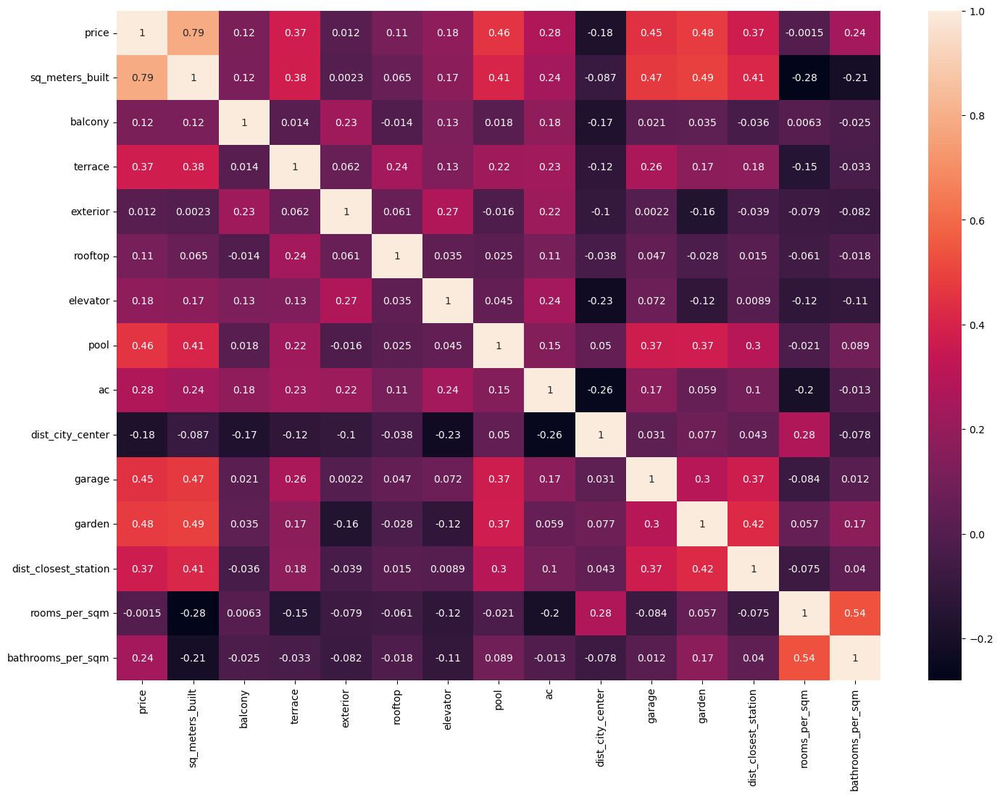

In [28]:
# Análisis de correlación
# Calculate correlation matrix
corrMatrix = sale_dataset_numeric_no_nulls.corr()

# Set figure size
plt.figure(figsize=(17,12))

# Plot correlation matrix as heatmap
sn.heatmap(corrMatrix, annot=True)

# Show plot
plt.show()

Se ve una correlación cercana entre price y sq_meters_built. El resto de las variables no tienen un relación aparente alta entre ellas.

### PCA para todas las variables

In [29]:
print('----------------------')
print('Media de cada variable')
print('----------------------')
sale_dataset_numeric_no_nulls.mean(axis=0)

----------------------
Media de cada variable
----------------------


price                   367527.736275
sq_meters_built             86.796990
balcony                      0.377972
terrace                      0.244228
exterior                     0.712331
rooftop                      0.069608
elevator                     0.570378
pool                         0.029075
ac                           0.453053
dist_city_center             3.501169
garage                       0.069266
garden                       0.010433
dist_closest_station         0.361633
rooms_per_sqm                3.383883
bathrooms_per_sqm            1.844526
dtype: float64

In [30]:
print('-------------------------')
print('Varianza de cada variable')
print('-------------------------')
sale_dataset_numeric_no_nulls.var(axis=0)

-------------------------
Varianza de cada variable
-------------------------


price                   2.805924e+11
sq_meters_built         4.561712e+03
balcony                 2.351493e-01
terrace                 1.846122e-01
exterior                2.049506e-01
rooftop                 6.477410e-02
elevator                2.450889e-01
pool                    2.823423e-02
ac                      2.478384e-01
dist_city_center        4.093850e+00
garage                  6.447950e-02
garden                  1.032563e-02
dist_closest_station    8.184243e-02
rooms_per_sqm           3.264486e+00
bathrooms_per_sqm       1.664767e+00
dtype: float64

Si no se estandarizan las variables para que tengan media cero y desviación estándar de uno antes de realizar el estudio PCA, la variable dist_closest_station, que tiene una media y dispersión muy superior al resto, dominará la mayoría de las componentes principales.

La clase sklearn.decomposition.PCA incorpora las principales funcionalidades que se necesitan a la hora de trabajar con modelos PCA. El argumento n_components determina el número de componentes calculados. Si se indica None, se calculan todas las posibles (min(filas, columnas) - 1).

Por defecto, PCA() centra los valores pero no los escala. Esto es importante ya que, si las variables tienen distinta dispersión, como en este caso, es necesario escalarlas. Una forma de hacerlo es combinar un StandardScaler() y un PCA() dentro de un pipeline.

In [31]:
sale_dataset_numeric_no_nulls_no_price = sale_dataset_numeric_no_nulls.drop(['price'], axis = 1)

In [32]:
# Preprocesado y modelado
# ==============================================================================
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale
# Entrenamiento modelo PCA con escalado de los datos
# ==============================================================================
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(sale_dataset_numeric_no_nulls_no_price)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

In [33]:
# Se convierte el array a dataframe para añadir nombres a los ejes.
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = sale_dataset_numeric_no_nulls_no_price.columns
)

,sq_meters_built,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,garage,garden,dist_closest_station,rooms_per_sqm,bathrooms_per_sqm
0,0.483520,0.086300,0.324659,0.051529,0.095529,0.141954,0.350857,0.258094,-0.093450,0.384018,0.334724,0.349601,-0.192055,-0.066058
1,0.015700,-0.217141,-0.085661,-0.356602,-0.111856,-0.361654,0.199168,-0.285700,0.348064,0.134125,0.356222,0.221174,0.371756,0.316781
2,-0.136285,0.345761,0.029769,0.271528,0.028295,0.196667,0.086267,0.256403,-0.223180,-0.002996,0.051393,-0.047996,0.489843,0.616352
3,-0.109972,-0.382915,0.449425,-0.115929,0.747688,-0.080728,-0.045992,0.044602,-0.011055,-0.025904,-0.138455,-0.094548,0.054352,0.156030
4,0.011298,-0.106520,-0.005099,-0.517075,-0.183520,-0.151834,-0.110618,0.115035,-0.698212,-0.152124,0.132490,-0.000936,-0.234289,0.236312
5,-0.087374,-0.686829,-0.024640,0.062391,-0.329532,0.537737,0.111826,0.034779,-0.029518,0.160535,-0.214704,0.108463,0.043131,0.135271
6,-0.165561,-0.224372,-0.344584,0.400545,0.121645,-0.376938,-0.231893,0.343417,-0.030437,-0.000288,0.038843,0.528899,-0.157812,0.086076
7,0.114079,0.110640,-0.065620,-0.006438,0.234003,0.412007,-0.432574,-0.538459,-0.155604,-0.104502,0.157559,0.448646,0.086800,0.007465
8,-0.031874,0.070453,-0.698047,-0.265052,0.444306,0.209903,0.384049,0.043772,-0.064953,0.160056,-0.088057,-0.058581,-0.062863,-0.025426
9,-0.035773,-0.106910,0.019764,0.465892,0.022676,-0.204762,0.502729,-0.542144,-0.324821,-0.156782,0.028274,-0.068227,-0.191809,0.091718


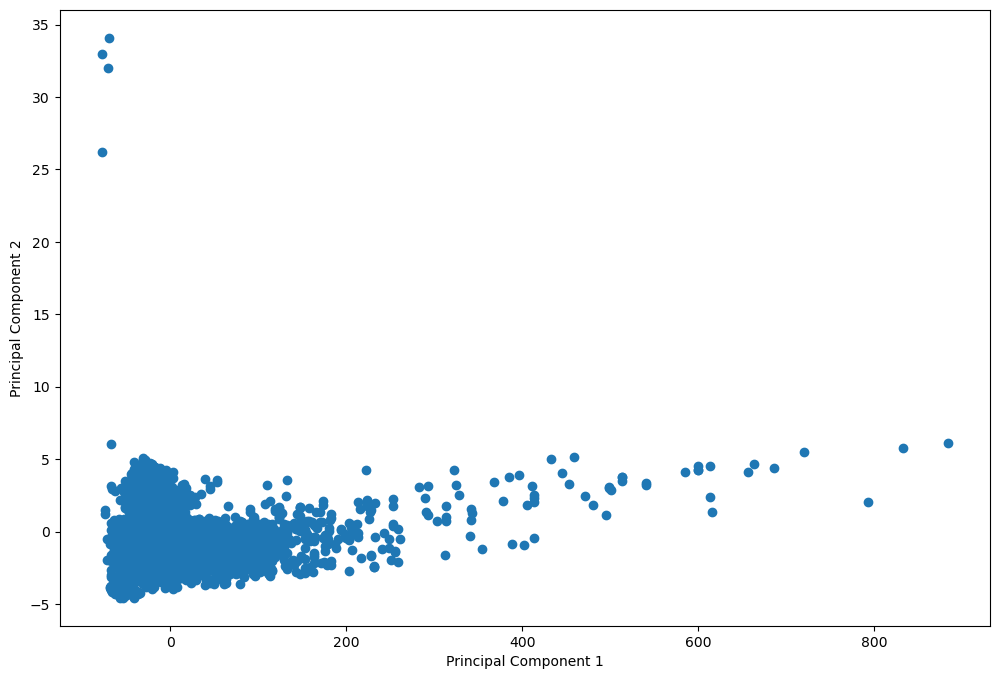

In [34]:
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt

# Create a PCA instance with the desired number of components
pca = PCA(n_components=2)

# Fit the data to the PCA model
pca.fit(sale_dataset_numeric_no_nulls_no_price)

# Transform the data into the new PCA space
transformed_data = pca.transform(sale_dataset_numeric_no_nulls_no_price)

# Set the size of the plot
fig, ax = plt.subplots(figsize=(12, 8))

# Create the scatter plot
ax.scatter(transformed_data[:, 0], transformed_data[:, 1])

# Set the axis labels
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')

# Show the plot
plt.show()

In [35]:
pca = PCA(n_components=3)
pca.fit(sale_dataset_numeric_no_nulls_no_price)

# Get the feature names
feature_names = sale_dataset_numeric_no_nulls_no_price.columns.tolist()

# Create a DataFrame with the principal components and feature names
components_df = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2', 'PC3'], index=feature_names)

# Print the principal components DataFrame
print(components_df)

                           PC1       PC2       PC3
sq_meters_built       0.999951  0.006968  0.005563
balcony               0.000836 -0.026165  0.035935
terrace               0.002405 -0.017349  0.009415
exterior              0.000016 -0.028248 -0.004883
rooftop               0.000243 -0.005719 -0.001492
elevator              0.001214 -0.050474  0.014975
pool                  0.001012  0.009490  0.007530
ac                    0.001766 -0.058699  0.021211
dist_city_center     -0.002613  0.819776 -0.523825
garage                0.001784  0.010279  0.004873
garden                0.000740  0.009766  0.009301
dist_closest_station  0.001748  0.012156  0.004768
rooms_per_sqm        -0.007503  0.549599  0.655232
bathrooms_per_sqm    -0.003974  0.132707  0.542197


Vemos las cargas o ponderaciones de cada variable original en los primeros tres componentes principales (PC1, PC2 y PC3) del conjunto de datos.

PC1 está influenciado principalmente por la variable "metros_construidos", que tiene una carga positiva muy alta, lo que significa que explica una gran parte de la variación en los datos. PC1 también tiene cargas positivas pequeñas para las variables "ascensor", "ac" y "rooms_per_sqm" y una carga negativa pequeña para "dist_city_center". Esto sugiere que las propiedades con más metros cuadrados construidos, ascensores, aire acondicionado, más habitaciones por metro cuadrado y más cerca del centro de la ciudad generalmente se valoran más.

PC2 está influenciado principalmente por la variable "dist_city_center", que tiene una carga positiva muy alta, lo que indica que explica una cantidad significativa de variación en los datos. PC2 también tiene cargas positivas moderadas para "rooms_per_sqm" y "bathrooms_per_sqm", lo que significa que las propiedades con más habitaciones y baños por metro cuadrado tienden a estar más lejos del centro de la ciudad.

PC3 está influenciado principalmente por las variables "rooms_per_sqm" y "bathrooms_per_sqm", que tienen cargas positivas altas, y "dist_city_center", que tiene una carga negativa moderada. Esto sugiere que las propiedades con más habitaciones y baños por metro cuadrado tienden a estar más alejadas del centro de la ciudad y se valoran de manera diferente a las propiedades con más metros cuadrados construidos.

In [36]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Iterate over each column in the dataset
for column in sale_dataset_numeric_no_nulls.columns:
    # Fit a linear regression model with price as the dependent variable and the current column as the independent variable
    formula = f"price ~ {column}"
    model = ols(formula=formula, data=sale_dataset_numeric_no_nulls).fit()
    
    # Perform an ANOVA test for the fitted model
    aov_table = sm.stats.anova_lm(model, typ=2)
    
    # Print the results
    print(f"Variable: {column}")
    print(aov_table)
    print()

Variable: price
                sum_sq      df             F  PR(>F)
price     1.640343e+15     1.0  2.824653e+33     0.0
Residual  3.394330e-15  5845.0           NaN     NaN

Variable: sq_meters_built
                       sum_sq      df            F  PR(>F)
sq_meters_built  1.017859e+15     1.0  9557.482796     0.0
Residual         6.224843e+14  5845.0          NaN     NaN

Variable: balcony
                sum_sq      df          F        PR(>F)
balcony   2.401598e+13     1.0  86.847161  1.625526e-20
Residual  1.616327e+15  5845.0        NaN           NaN

Variable: terrace
                sum_sq      df           F         PR(>F)
terrace   2.244630e+14     1.0  926.622573  4.766055e-189
Residual  1.415880e+15  5845.0         NaN            NaN

Variable: exterior
                sum_sq      df         F    PR(>F)
exterior  2.542144e+11     1.0  0.905977  0.341223
Residual  1.640089e+15  5845.0       NaN       NaN

Variable: rooftop
                sum_sq      df          F        

Según los resultados de la prueba ANOVA, parece que cada una de las tres variables (precio, metros_construidos_y balcón) tiene un efecto significativo en el precio de la variable objetivo.

Para las variables metros_construidos y balcón, la prueba ANOVA reporta estadísticas F altas y valores p muy bajos (ambos 0.0), lo que indica efectos altamente significativos de estas variables en el precio. Esto sugiere que los metros cuadrados_construidos y el balcón pueden ser predictores importantes del precio en un modelo de regresión.

Las pruebas ANOVA asumen ciertos supuestos sobre los datos, como varianzas iguales y errores normalmente distribuidos. Es importante verificar estas suposiciones antes de confiar en los resultados de ANOVA.

# Modelo de Bagging

El modelo de Bagging (Bootstrap Aggregation) es una técnica de aprendizaje automático que se utiliza para mejorar la precisión y estabilidad de los modelos de predicción.

La idea básica detrás del Bagging es la de entrenar varios modelos con muestras aleatorias del conjunto de datos de entrenamiento y luego combinar las predicciones de estos modelos para obtener una predicción final. El proceso de toma de muestras se realiza mediante el muestreo con reemplazo, lo que significa que cada muestra puede aparecer varias veces en diferentes muestras.

Cada modelo generado por Bagging tiene un peso igual en la predicción final, y se pueden utilizar diferentes algoritmos de aprendizaje automático para construir los modelos base. El modelo de Bagging puede utilizarse con cualquier algoritmo de aprendizaje automático, como árboles de decisión, regresión lineal, redes neuronales, SVM, entre otros.

Los modelos de Bagging son eficaces para reducir el sesgo y la varianza en el modelo final, y también son útiles para reducir el sobreajuste. Además, la técnica de Bagging también se puede utilizar para mejorar la precisión en problemas de clasificación y regresión.

Generamos el split

Paso 1: EDA y Data Quality: Realizado. OK.

Paso 2: Predicción o Clúster: Regresión sobre variable precio. OK.

Paso 3: Train and Test, split: OK:

In [37]:
X = sale_dataset_numeric_no_nulls.drop(['price'], axis = 1)
y = sale_dataset_numeric_no_nulls[['price']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

Ejemplos de scoring parameter: https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

En este caso optamos por un R2.

Hacemos grid search con cross validation para encontrar los parámetros óptimos de nuestro modelo

Paso 4: Métrica a optimizar:

Se busca la combinación óptima de los parámetros "max_depth" y "min_samples_split" para el clasificador de árbol de decisiones, utilizando la técnica de Grid Search Cross Validation.

In [38]:
# we enumerate the values to try
parameters = [{"max_depth":[2,3,4,5,6,7,9], "min_samples_split":[2,5,10]}]

#instantiate the classifier
decision_tree_model = DecisionTreeClassifier()

# Grid search function
grid_bag = GridSearchCV(cv = 10, estimator=decision_tree_model, param_grid=parameters, scoring="r2")
grid_bag.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid=[{'max_depth': [2, 3, 4, 5, 6, 7, 9],
                          'min_samples_split': [2, 5, 10]}],
             scoring='r2')

In [39]:
grid_bag.best_params_

{'max_depth': 6, 'min_samples_split': 2}

In [40]:
# we enumerate the values to try
parameters = {"n_estimators":[10,20,50,100,200]}

#instantiate the classifier
decision_tree_model = DecisionTreeClassifier(max_depth = grid_bag.best_params_['max_depth']
                                             , min_samples_split = grid_bag.best_params_['min_samples_split'])

#instantiate the classifier
bagging_model = BaggingClassifier(decision_tree_model)

# Grid search function
grid_bag_depth = GridSearchCV(cv = 10
                        , estimator=bagging_model
                        , param_grid=parameters, scoring="r2")

grid_bag_depth.fit(X_train, y_train)
grid_bag_depth.best_params_

{'n_estimators': 200}

A continuación, con los parámetros óptimos del modelo, procedemos a hacer un xvalidation para entender la performance del modelo:

In [41]:
# Creamos el modelo con los hiperpametros seleccionados en el punto anterior
bag = BaggingClassifier(DecisionTreeClassifier(max_depth = grid_bag.best_params_['max_depth']
                                               , min_samples_split = grid_bag.best_params_['min_samples_split'])
                        , n_estimators = grid_bag_depth.best_params_['n_estimators'])
# Entrenamos el modelo con el dataset de entrenamiento mediante cross validation
model = cross_validate(bag, X_train, y_train, cv = 10, scoring = "r2")

In [42]:
for i, score in enumerate(model["test_score"]):
    print(f"Accuracy for the fold no. {i} on the test set: {score}")

Accuracy for the fold no. 0 on the test set: 0.7953417884553815
Accuracy for the fold no. 1 on the test set: 0.6334149283114903
Accuracy for the fold no. 2 on the test set: 0.6626972909768681
Accuracy for the fold no. 3 on the test set: 0.7813808050123396
Accuracy for the fold no. 4 on the test set: 0.7889934191225636
Accuracy for the fold no. 5 on the test set: 0.5993670181392153
Accuracy for the fold no. 6 on the test set: 0.7935343685905538
Accuracy for the fold no. 7 on the test set: 0.673521383599513
Accuracy for the fold no. 8 on the test set: 0.5429558490676865
Accuracy for the fold no. 9 on the test set: 0.6952197966026745


Nos encontramos con que hay variación con los datos de entrenamiento de entre 0.56 - 0.86. Ésto nos indica que hay mucha variación en los datos y como vimos en los boxplots sean los outlayers o grupos de instancias que no estamos prediciendo correctamente.

{'whiskers': [<matplotlib.lines.Line2D at 0x7fdb50c48850>,
 'caps': [<matplotlib.lines.Line2D at 0x7fdb50c4a2c0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fdb50c491e0>],
 'medians': [<matplotlib.lines.Line2D at 0x7fdb50c4a560>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fdb50c490c0>],
 'means': []}

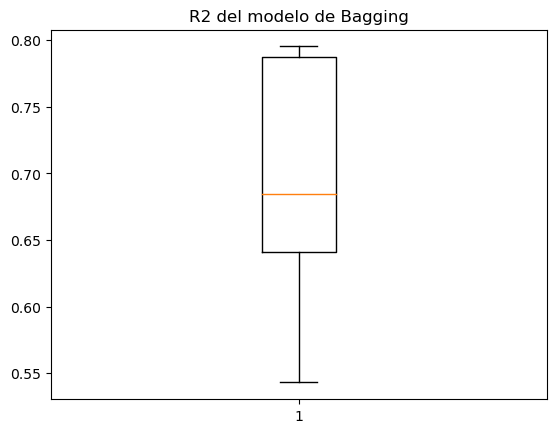

In [43]:
fig1, ax1 = plt.subplots()
ax1.set_title('R2 del modelo de Bagging')
ax1.boxplot(model["test_score"])

R2 del boxplot, hay una variación en los datos.

Generamos las predicciones y calculamos el resultado de validación:

In [44]:
bag = BaggingClassifier(DecisionTreeClassifier(max_depth = grid_bag.best_params_['max_depth']
                                               , min_samples_split = grid_bag.best_params_['min_samples_split'])
                        , n_estimators = grid_bag_depth.best_params_['n_estimators'])
bag.fit(X_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=6),
                  n_estimators=200)

Error del modelo:

In [45]:
y_pred = bag.predict(X_train)
#error rate
metrics.r2_score(y_train, y_pred)

0.8311121347065409

El valor de R cuadrado es de 0.83, lo que indica que el modelo es capaz de explicar aproximadamente el 83% de la varianza en la variable dependiente utilizando los datos de entrenamiento.

Sin embargo, es importante tener en cuenta que el R cuadrado por sí solo no es suficiente para evaluar la calidad del modelo, ya que puede haber otros factores que afecten la precisión de las predicciones, como la presencia de valores atípicos o la falta de ajuste del modelo a ciertas partes del conjunto de datos. 

Error en validación

In [46]:
y_pred = bag.predict(X_test)
#error rate
metrics.r2_score(y_test, y_pred)

0.6639946326467554

El valor de R cuadrado es de 0.66 para los datos de prueba, lo que indica que el modelo es capaz de explicar aproximadamente el 66% de la varianza en la variable dependiente utilizando los datos de prueba.  En general, un valor de R cuadrado de 0.66 indica que el modelo tiene un rendimiento regular, aunque se podría considerar que todavía hay espacio para mejoras.

# One-hot encoding - Random Forest

En primer lugar generamos un diccionario para almacenar los resultados obtenidos de todos los modelos que generemos

In [47]:
# Definimos 2 diccionarios vacíos
cv = {}
results = pd.DataFrame(columns=['model','median_r2_cv_training','r2_validation'])
# Almacenamos los resultados para el modelo decision_tree_bagging
cv['decision_tree_bagging'] = model["test_score"]
cv

{'decision_tree_bagging': array([0.79534179, 0.63341493, 0.66269729, 0.78138081, 0.78899342,
        0.59936702, 0.79353437, 0.67352138, 0.54295585, 0.6952198 ])}

In [48]:
results = pd.DataFrame(columns=['model','median_r2_cv_training','r2_validation'])
model_results = ['decision_tree_bagging', np.median(model["test_score"]), metrics.r2_score(y_test, y_pred)]
results = results.append(dict(zip(results.columns,model_results)), ignore_index=True)
results

,model,median_r2_cv_training,r2_validation
0,decision_tree_bagging,0.684371,0.663995


### Análisis del impacto de las variables categóricas sobre el modelo:
Hacemos un test ANOVA para entender el impacto de las variables categóricas sobre nuestro modelo:


In [49]:
# Test ANOVA
for i in range(0, len(cat_features)):
    model_def = 'price ~ ' + cat_features[i]
    anova_model = ols(model_def, data=sale_dataset).fit()
    aov_table = sm.stats.anova_lm(anova_model, typ=2)
    print(aov_table)

                    sum_sq      df        F  PR(>F)
neighborhood  5.603465e+14    74.0  40.4696     0.0
Residual      1.079996e+15  5772.0      NaN     NaN
                     sum_sq      df           F         PR(>F)
property_type  3.534078e+14     7.0  233.663633  2.418198e-307
Residual       1.261179e+15  5837.0         NaN            NaN
                   sum_sq      df          F        PR(>F)
orientation  1.511045e+13     4.0  13.578865  5.078799e-11
Residual     1.625232e+15  5842.0        NaN           NaN
                sum_sq      df         F        PR(>F)
heating   5.878078e+13     4.0  47.11917  1.372013e-38
Residual  1.045398e+15  3352.0       NaN           NaN
                        sum_sq      df          F        PR(>F)
property_age_cat  1.258942e+14     5.0  97.111021  1.324084e-98
Residual          1.514449e+15  5841.0        NaN           NaN


En éste caso vemos como las 3 categorías más importantes según los resultados del test ANOVA medidos mediante la F y el p value son:

- property_type
- heating
- property_age_cat
- neighborhood

La variable orientation parece ser importante también, pero nos encontramos con que tiene un valor F más pequeño.

Atendiendo al property type, vamos a sacar la mediana del precio de la vivienda en donde vemos una clara proporción entre barrios de precio alto, medio y bajo:

In [50]:
neighborhood = sale_dataset[['neighborhood', 'price', 'sq_meters_built']].groupby('neighborhood', as_index=False).agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    mean_sq_meters_built=('sq_meters_built', "mean"),
    # Median price
    median_price=('price', "median"),
    # Median price
    median_sq_meters_built=('sq_meters_built', "median"))

neighborhood['mean_price_per_sq_meters_built'] = neighborhood['mean_price'] / neighborhood['mean_sq_meters_built']
neighborhood['median_price_per_sq_meters_built'] = neighborhood['median_price'] / neighborhood['median_sq_meters_built']
neighborhood.head(60)

,neighborhood,category_count,mean_price,mean_sq_meters_built,median_price,median_sq_meters_built,mean_price_per_sq_meters_built,median_price_per_sq_meters_built
0,Baró de Viver,5,1.353800e+05,79.000000,150000.0,79.0,1713.670886,1898.734177
1,Can Baró,22,1.155091e+05,50.318182,110000.0,45.0,2295.573622,2444.444444
2,Can Peguera - El Turó de la Peira,83,1.264771e+05,61.216867,130000.0,60.0,2066.049990,2166.666667
3,Canyelles,6,1.993167e+05,85.000000,189000.0,84.5,2344.901961,2236.686391
4,Ciutat Meridiana - Torre Baró - Vallbona,122,1.137869e+05,66.721311,110000.0,65.0,1705.405405,1692.307692
5,Ciutat Vella,269,3.934110e+05,75.966543,225000.0,58.0,5178.740347,3879.310345
6,Diagonal Mar i el Front Marítim del Poblenou,38,8.586711e+05,127.789474,707500.0,116.0,6719.419275,6099.137931
7,Eixample,245,8.202712e+05,129.318367,630000.0,112.0,6343.036739,5625.000000
8,El Baix Guinardó,37,2.604649e+05,69.621622,290000.0,70.0,3741.149068,4142.857143
9,El Besòs,111,1.499761e+05,63.810811,145000.0,61.0,2350.324721,2377.049180


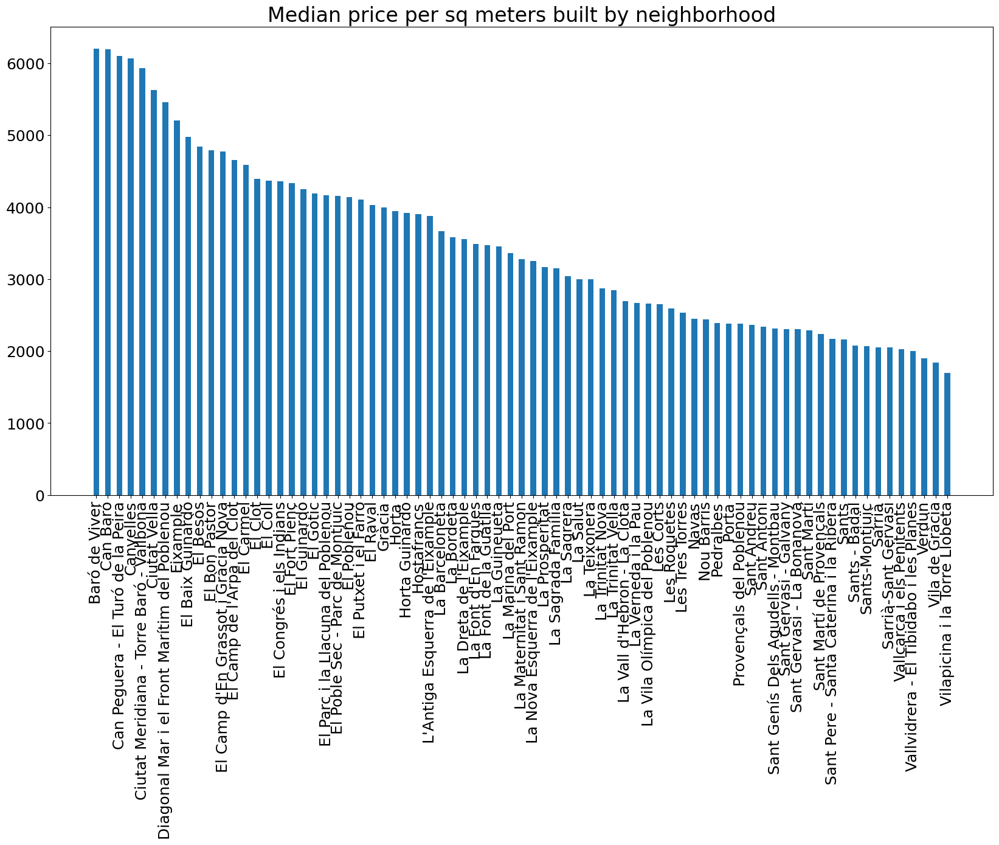

In [51]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.bar(x='neighborhood',
       height='median_price_per_sq_meters_built',
       data=neighborhood.sort_values('median_price_per_sq_meters_built', ascending=False).reset_index(),
       width=0.5  # Adjust the bar width
      )
ax.set_xticklabels(neighborhood['neighborhood'], rotation=90, fontsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_title('Median price per sq meters built by neighborhood', fontsize=24)
plt.show()

En este caso, podemos definir 3 tiers de precios según la zona dado que nos encontraremos con viviendas con pocas instancias

In [52]:
def conditions(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 11.5)):
        return "0 - 11.5"
    elif ((x >= 11.5) & (x < 15)):
        return "11.5 - 15"
    elif ((x >= 18)):
        return "+18"
    else:
        return "Unknown"

func = np.vectorize(conditions)
neighborhood['neighborhood_sale_index'] = func(neighborhood['median_price_per_sq_meters_built'])
neighborhood.head()

,neighborhood,category_count,mean_price,mean_sq_meters_built,median_price,median_sq_meters_built,mean_price_per_sq_meters_built,median_price_per_sq_meters_built,neighborhood_sale_index
0,Baró de Viver,5,135380.000000,79.000000,150000.0,79.0,1713.670886,1898.734177,+18
1,Can Baró,22,115509.090909,50.318182,110000.0,45.0,2295.573622,2444.444444,+18
2,Can Peguera - El Turó de la Peira,83,126477.108434,61.216867,130000.0,60.0,2066.049990,2166.666667,+18
3,Canyelles,6,199316.666667,85.000000,189000.0,84.5,2344.901961,2236.686391,+18
4,Ciutat Meridiana - Torre Baró - Vallbona,122,113786.885246,66.721311,110000.0,65.0,1705.405405,1692.307692,+18


Finalmente agregamos ésta información el modelo de datos

In [53]:
sale_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age,property_age_cat,price_category
0,150000,67,3,1,0.0,1.0,1.0,este,5.0,0.0,...,NaN,Ciutat Meridiana - Torre Baró - Vallbona,7.990993,0.0,piso,0.0,0.121438,NaN,Unknown,0-200K
1,150000,52,2,1,0.0,0.0,1.0,Unknown,3.0,0.0,...,NaN,El Carmel,3.991000,0.0,piso,0.0,0.277336,NaN,Unknown,0-200K
2,395000,91,2,2,0.0,0.0,1.0,Unknown,0.0,0.0,...,NaN,El Poblenou,3.579261,0.0,duplex,0.0,0.383878,NaN,Unknown,200K-400K
3,540000,100,3,1,0.0,0.0,1.0,sur,1.0,0.0,...,NaN,Sant Gervasi - Galvany,2.257852,1.0,piso,0.0,0.875652,NaN,Unknown,400K-600K
4,650000,141,3,2,0.0,0.0,1.0,este,1.0,0.0,...,NaN,Sarrià,4.283368,1.0,piso,0.0,1.310073,NaN,Unknown,600K-800K


In [54]:
neighborhood_mapping = neighborhood[['neighborhood', 'neighborhood_sale_index']]
sale_dataset = pd.merge(sale_dataset, neighborhood_mapping, on='neighborhood', how='left')
cat_features = []
cat_features = cat_features.append('neighborhood_sale_index')
sale_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age,property_age_cat,price_category,neighborhood_sale_index
0,150000,67,3,1,0.0,1.0,1.0,este,5.0,0.0,...,Ciutat Meridiana - Torre Baró - Vallbona,7.990993,0.0,piso,0.0,0.121438,NaN,Unknown,0-200K,+18
1,150000,52,2,1,0.0,0.0,1.0,Unknown,3.0,0.0,...,El Carmel,3.991000,0.0,piso,0.0,0.277336,NaN,Unknown,0-200K,+18
2,395000,91,2,2,0.0,0.0,1.0,Unknown,0.0,0.0,...,El Poblenou,3.579261,0.0,duplex,0.0,0.383878,NaN,Unknown,200K-400K,+18
3,540000,100,3,1,0.0,0.0,1.0,sur,1.0,0.0,...,Sant Gervasi - Galvany,2.257852,1.0,piso,0.0,0.875652,NaN,Unknown,400K-600K,+18
4,650000,141,3,2,0.0,0.0,1.0,este,1.0,0.0,...,Sarrià,4.283368,1.0,piso,0.0,1.310073,NaN,Unknown,600K-800K,+18


Aplicamos one-hot encoding para la métrica de rent_index y para la edad del piso:

In [55]:
def one_hot_encoder(df, cat_feature):
    # creating instance of one-hot-encoder
    enc = OneHotEncoder(handle_unknown='ignore')
    # passing bridge-types-cat column (label encoded values of bridge_types)
    enc_df = pd.DataFrame(enc.fit_transform(sale_dataset[[cat_feature]]).toarray())
    # renames columns adding a prefix with the column name
    enc_df.columns = enc.categories_[0]
    enc_df = enc_df.add_prefix(cat_feature + '_')
    # merge with main df bridge_df on key values
    return sale_dataset_numeric.join(enc_df)

In [56]:
sale_dataset_numeric.columns

Index(['price', 'sq_meters_built', 'rooms', 'bathrooms', 'balcony', 'terrace',
       'exterior', 'floor', 'rooftop', 'elevator', 'pool', 'ac', 'year_built',
       'dist_city_center', 'garage', 'garden', 'dist_closest_station',
       'property_age'],
      dtype='object')

In [57]:
sale_dataset_numeric.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,year_built,dist_city_center,garage,garden,dist_closest_station,property_age
0,150000,67,3,1,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,NaN,7.990993,0.0,0.0,0.121438,NaN
1,150000,52,2,1,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,NaN,3.991000,0.0,0.0,0.277336,NaN
2,395000,91,2,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,NaN,3.579261,0.0,0.0,0.383878,NaN
3,540000,100,3,1,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,NaN,2.257852,1.0,0.0,0.875652,NaN
4,650000,141,3,2,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,NaN,4.283368,1.0,0.0,1.310073,NaN


In [58]:
# sale_dataset_numeric = one_hot_encoder(sale_dataset_numeric, 'property_age_cat')
sale_dataset_numeric = one_hot_encoder(sale_dataset_numeric, 'property_type')
# sale_dataset_numeric = one_hot_encoder(sale_dataset_numeric, 'neighborhood_rent_index')
sale_dataset_numeric = one_hot_encoder(sale_dataset_numeric, 'heating')
# sale_dataset_numeric = one_hot_encoder(sale_dataset_numeric, 'orientation')
sale_dataset_numeric.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,floor,rooftop,elevator,...,property_type_duplex,property_type_estudio,property_type_piso,property_type_nan,heating_bomba,heating_electric,heating_gas,heating_individual,heating_na,heating_nan
0,150000,67,3,1,0.0,1.0,1.0,5.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,150000,52,2,1,0.0,0.0,1.0,3.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,395000,91,2,2,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,540000,100,3,1,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,650000,141,3,2,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


# Random Forest

Random Forest es un algoritmo de aprendizaje supervisado en el campo del Machine Learning que se utiliza tanto para la clasificación como para la regresión. Es una técnica de conjunto (ensemble) que combina varios árboles de decisión para obtener una mejor precisión en la predicción.

El algoritmo Random Forest crea múltiples árboles de decisión y cada árbol de decisión se entrena con un subconjunto aleatorio de datos y un conjunto aleatorio de características o variables. Cada árbol de decisión en el bosque emite una predicción y la clase con la mayoría de votos se convierte en la predicción del modelo.

En resumen, Random Forest es un conjunto de árboles de decisión que utilizan una técnica de muestreo aleatorio para mejorar la precisión de la predicción y reducir el sobreajuste (overfitting) al mismo tiempo.

Hacemos un modelo de Random Forest comprobando que no hay null values

In [59]:
sale_dataset_numeric_no_nulls = sale_dataset_numeric.drop(['year_built', 'property_age', 'floor'], axis = 1)
sale_dataset_numeric_no_nulls['rooms_per_sqm'] = sale_dataset_numeric_no_nulls['rooms'] * 100 / sale_dataset_numeric_no_nulls['sq_meters_built']
sale_dataset_numeric_no_nulls['bathrooms_per_sqm'] = sale_dataset_numeric_no_nulls['bathrooms'] * 100 / sale_dataset_numeric_no_nulls['sq_meters_built']
sale_dataset_numeric_no_nulls = sale_dataset_numeric_no_nulls.drop(['rooms', 'bathrooms'], axis=1)
sale_dataset_numeric_no_nulls.isnull().sum() / len(sale_dataset_numeric_no_nulls)

price                                 0.0
sq_meters_built                       0.0
balcony                               0.0
terrace                               0.0
exterior                              0.0
rooftop                               0.0
elevator                              0.0
pool                                  0.0
ac                                    0.0
dist_city_center                      0.0
garage                                0.0
garden                                0.0
dist_closest_station                  0.0
property_type_atico                   0.0
property_type_chalet                  0.0
property_type_chalet_adosado          0.0
property_type_chalet_independiente    0.0
property_type_chalet_pareado          0.0
property_type_duplex                  0.0
property_type_estudio                 0.0
property_type_piso                    0.0
property_type_nan                     0.0
heating_bomba                         0.0
heating_electric                  

In [60]:
X = sale_dataset_numeric_no_nulls.drop(['price'], axis = 1)
y = sale_dataset_numeric_no_nulls[['price']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

In [61]:
# we enumerate the values to try
parameters = [{"n_estimators":[100,150,200], "max_depth": [5,10,15]}]

#instantiate the classifier
rf_cv = RandomForestClassifier()

# Grid search function
grid_bag = GridSearchCV(cv = 10, estimator=rf_cv, param_grid=parameters, scoring="r2")
grid_bag.fit(X_train, y_train)
grid_bag.best_params_

{'max_depth': 15, 'n_estimators': 150}

In [62]:
# Creamos el modelo con los hiperpametros seleccionados en el punto anterior
rf = RandomForestClassifier(n_estimators = grid_bag.best_params_['n_estimators'], max_depth=grid_bag.best_params_['max_depth'])
# Entrenamos el modelo con el dataset de entrenamiento mediante cross validation
model = cross_validate(rf, X_train, y_train, cv = 10, scoring = "r2")
for i, score in enumerate(model["test_score"]):
    print(f"Accuracy for the fold no. {i} on the test set: {score}")

Accuracy for the fold no. 0 on the test set: 0.7833550198365573
Accuracy for the fold no. 1 on the test set: 0.6060224896080473
Accuracy for the fold no. 2 on the test set: 0.579973830281779
Accuracy for the fold no. 3 on the test set: 0.7959766934097371
Accuracy for the fold no. 4 on the test set: 0.8008160119678429
Accuracy for the fold no. 5 on the test set: 0.49421653179690217
Accuracy for the fold no. 6 on the test set: 0.7961490363645488
Accuracy for the fold no. 7 on the test set: 0.55426267935925
Accuracy for the fold no. 8 on the test set: 0.4425345915075616
Accuracy for the fold no. 9 on the test set: 0.6864674526223579


Según los resultados informados, la precisión del modelo parece variar ampliamente entre los diferentes folds, desde 0,44 hasta 0,82. La mayor precisión se logra en el fold 4, con un valor de 0,82, mientras que la menor precisión se encuentra en el fold 5, con un valor de 0,44.

{'whiskers': [<matplotlib.lines.Line2D at 0x7fdb50d7c490>,
 'caps': [<matplotlib.lines.Line2D at 0x7fdb50d7e1d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fdb50d7de40>],
 'medians': [<matplotlib.lines.Line2D at 0x7fdb50d7cbb0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fdb5105fc40>],
 'means': []}

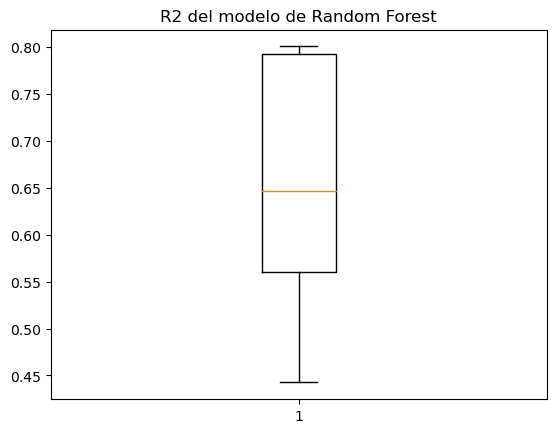

In [63]:
fig1, ax1 = plt.subplots()
ax1.set_title('R2 del modelo de Random Forest')
ax1.boxplot(model["test_score"])

In [64]:
np.median(model["test_score"])

0.6462449711152025

In [65]:
rf.fit(X_train, y_train)
y_pred = rf.predict(X_train)
#error rate
metrics.r2_score(y_train, y_pred)

0.9999009236752906

In [66]:
y_pred = rf.predict(X_test)
#error rate
metrics.r2_score(y_test, y_pred)

0.7541174136926981

El modelo parece funcionar muy bien en el conjunto de entrenamiento, con un valor R cuadrado de 0,99, lo que indica un ajuste casi perfecto a los datos de entrenamiento. Sin embargo, el valor de R-cuadrado en el conjunto de prueba es 0,75, que es significativamente más bajo que el valor de R-cuadrado en el conjunto de entrenamiento. Esto sugiere que el modelo está sobreajustado a los datos de entrenamiento y no generaliza bien a los datos nuevos y que no conoce.

In [67]:
# Almacenamos los resultados para el modelo rf_1
cv['rf_1'] = model["test_score"]

model_results = ['rf_1', np.median(model["test_score"]), metrics.r2_score(y_test, y_pred)]
results = results.append(dict(zip(results.columns,model_results)), ignore_index=True)
results

,model,median_r2_cv_training,r2_validation
0,decision_tree_bagging,0.684371,0.663995
1,rf_1,0.646245,0.754117


{'whiskers': [<matplotlib.lines.Line2D at 0x7fdb50c9c700>,
 'caps': [<matplotlib.lines.Line2D at 0x7fdb50c9eb30>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fdb50c9ee60>,
 'medians': [<matplotlib.lines.Line2D at 0x7fdb50c9f850>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fdb50c9d360>,
 'means': []}

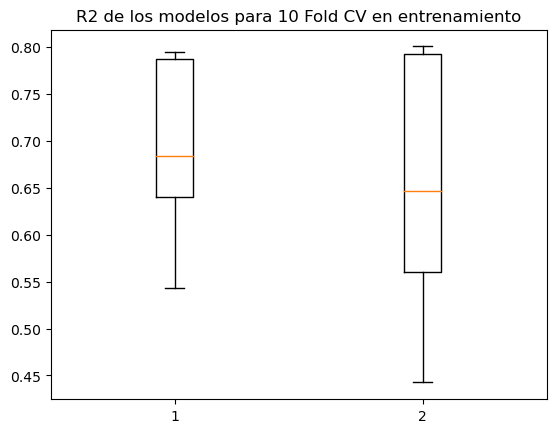

In [68]:
fig1, ax1 = plt.subplots()
ax1.set_title('R2 de los modelos para 10 Fold CV en entrenamiento')
ax1.boxplot(pd.DataFrame(cv))

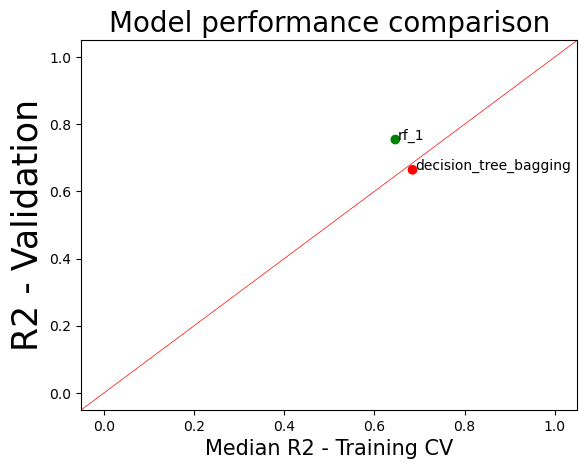

<Figure size 1000x1000 with 0 Axes>

In [69]:
colors = {'decision_tree_bagging':'red', 'rf_1':'green'}
fig, ax = plt.subplots()

ax.scatter(x='median_r2_cv_training', y = 'r2_validation', data=results, c=results['model'].map(colors))
ax.axline((0, 0), (1, 1), linewidth=0.5, color='r')
plt.title("Model performance comparison", fontsize = 20)
plt.xlabel("Median R2 - Training CV", fontsize = 15)
plt.ylabel("R2 - Validation", fontsize = 25)
plt.figure(figsize=(10,10))

for i in range(0,len(results)):
    ax.annotate(results['model'][i], (results['median_r2_cv_training'][i] + 0.005, results['r2_validation'][i]), fontsize = 10)
    
plt.show()

El modelo Random Forest (rf_1) y el modelo Decision Tree Bagging en términos del valor R cuadrado en el conjunto de validación, con un valor de 0,78 y con 0,76 se encuentran casi en empate en esta validación.

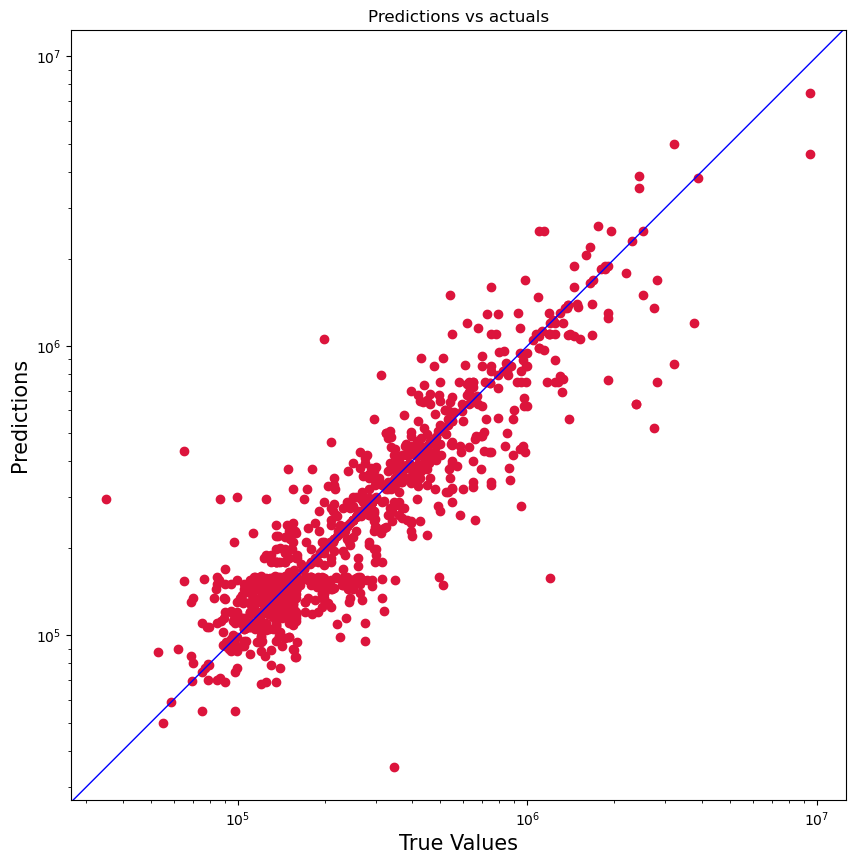

In [70]:
plt.figure(figsize=(10,10))
plt.scatter(y_test, y_pred, c='crimson')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(y_pred), np.max(y_test.values))
p2 = min(min(y_pred), np.min(y_test.values))
plt.axline((p2,p2), (p1,p1), linewidth=1, color='b')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.title('Predictions vs actuals')
plt.axis('equal')
plt.show()

Los datos siguen una regresión lineal. Hay mayor variabilidad un poco en valores más altos de las viviendas. Quizás debamos hacer un modelo en donde se quitan las viviendas con precios muy altos que no cumplen con nuestro proósito de comprar algo en el rango que sea accesible.

# Catboost

CatBoost (Categorical Boosting) es un algoritmo de aprendizaje automático de código abierto y gradient boosting que se utiliza para el análisis predictivo en problemas de clasificación y regresión. Una de las características principales de CatBoost es su capacidad para manejar automáticamente las características categóricas sin la necesidad de una codificación previa, lo que ahorra tiempo y simplifica el proceso de preprocesamiento de datos. Además, CatBoost utiliza una técnica llamada 'orden de exposición' que introduce aleatoriedad en el proceso de entrenamiento, lo que ayuda a prevenir el sobreajuste y mejorar el rendimiento del modelo. CatBoost también ofrece una amplia gama de opciones de configuración para permitir a los usuarios optimizar el modelo para su conjunto de datos específico.

En este caso vamos a hacer limpieza del dataset y vamos a aplicar cambios adecuados:

In [71]:
sale_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age,property_age_cat,price_category,neighborhood_sale_index
0,150000,67,3,1,0.0,1.0,1.0,este,5.0,0.0,...,Ciutat Meridiana - Torre Baró - Vallbona,7.990993,0.0,piso,0.0,0.121438,NaN,Unknown,0-200K,+18
1,150000,52,2,1,0.0,0.0,1.0,Unknown,3.0,0.0,...,El Carmel,3.991000,0.0,piso,0.0,0.277336,NaN,Unknown,0-200K,+18
2,395000,91,2,2,0.0,0.0,1.0,Unknown,0.0,0.0,...,El Poblenou,3.579261,0.0,duplex,0.0,0.383878,NaN,Unknown,200K-400K,+18
3,540000,100,3,1,0.0,0.0,1.0,sur,1.0,0.0,...,Sant Gervasi - Galvany,2.257852,1.0,piso,0.0,0.875652,NaN,Unknown,400K-600K,+18
4,650000,141,3,2,0.0,0.0,1.0,este,1.0,0.0,...,Sarrià,4.283368,1.0,piso,0.0,1.310073,NaN,Unknown,600K-800K,+18


In [72]:
# Creating a new dataset
catboost_dataset = sale_dataset
catboost_dataset['rooms_per_sqm'] = catboost_dataset['rooms'] * 100 / catboost_dataset['sq_meters_built']
catboost_dataset['bathrooms_per_sqm'] = catboost_dataset['bathrooms'] * 100 / catboost_dataset['sq_meters_built']

# Defining the lists with all the variables
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'floor', 'rooftop', 'elevator'
                    , 'pool', 'ac', 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat']

# Selecting only the variables we want
catboost_dataset = sale_dataset[numeric_features + cat_features + target]
catboost_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,NaN,Unknown,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,NaN,Unknown,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,NaN,Unknown,650000


In [73]:
# Here we substitute all null values in the categorical variables for 0
for i in range(0,len(cat_features)):
    catboost_dataset[cat_features[i]].fillna("Unknown", inplace = True) 
catboost_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,650000


Comprobamos nulos

In [74]:
catboost_dataset.isnull().sum() / len(catboost_dataset)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
floor                   0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
price                   0.0
dtype: float64

Estudiamos la categoría floor

In [75]:
floor = catboost_dataset[['floor', 'price']].groupby('floor', as_index=False).agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    stantard_deviation=('price', "std")).sort_values('floor', ascending = True).reset_index()

floor

,index,floor,category_count,mean_price,median_price,min_price,max_price,stantard_deviation
0,0,0.0,2082,3.547253e+05,150000.0,28000,9500000,5.793529e+05
1,1,1.0,979,3.149467e+05,199000.0,57000,4000000,3.269784e+05
2,2,2.0,766,3.248612e+05,199500.0,69900,2200000,3.086992e+05
3,3,3.0,701,3.828466e+05,220000.0,80000,7450000,5.360943e+05
4,4,4.0,528,4.190089e+05,190500.0,35000,7450000,6.648578e+05
5,5,5.0,303,4.652099e+05,250000.0,75000,9500000,8.505172e+05
6,6,6.0,195,3.974853e+05,330000.0,83000,2800000,3.504742e+05
7,7,7.0,106,4.177689e+05,318000.0,75000,2800000,3.665028e+05
8,8,8.0,71,4.137886e+05,315000.0,90000,1690000,2.936820e+05
9,9,9.0,32,4.918719e+05,259000.0,132000,2475000,5.342262e+05


Precio medio de la vivienda a partir del piso.

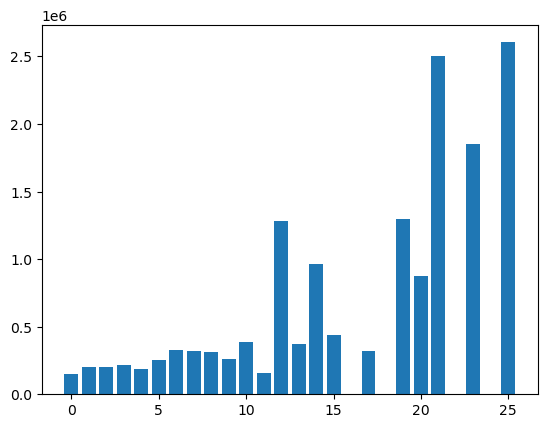

In [76]:
plt.bar(x = 'floor', height = 'median_price', data = floor)
plt.rcParams["figure.figsize"] = (50,20)

Excluímos los pisos más altos, diríamos los outlyers:

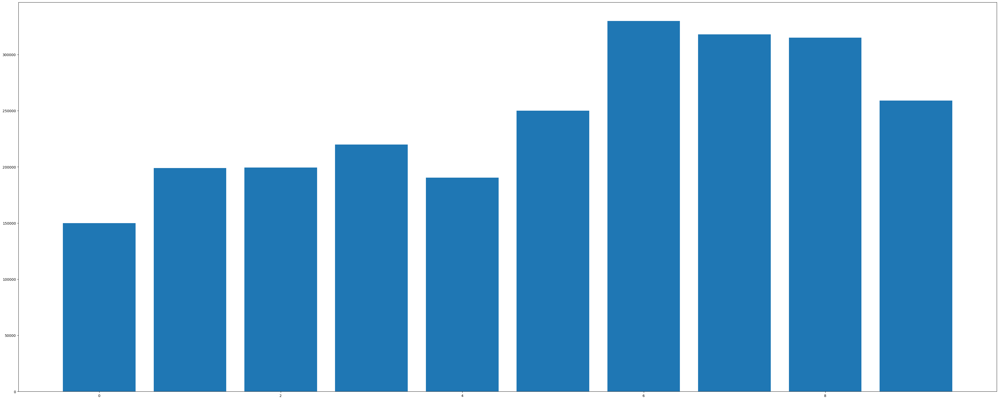

In [77]:
plt.bar(x = 'floor', height = 'median_price', data = floor[floor['floor'] < 10])
plt.rcParams["figure.figsize"] = (20,20)

Vemos que para pisos altos el precio aumenta mucho, pero tenemos muy pocas instancias (Menos de 10).

Para este ejemplo decidimos hacer una transformación categórica con pisos de hasta 4 plantas, hasta 10 plantas y superiores

In [78]:
def conditions_floow(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 4)):
        return "0 - 4"
    elif ((x >= 5) & (x < 10)):
        return "5 - 10"
    elif ((x >= 10)):
        return "+10"
    else:
        return "Unknown"

func = np.vectorize(conditions_floow)
catboost_dataset['floor_cat'] = func(catboost_dataset['floor'])
catboost_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price,floor_cat
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,150000,5 - 10
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000,0 - 4
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000,0 - 4
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,540000,0 - 4
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,650000,0 - 4


In [79]:
# Actualizamos las variables de nuevo
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'rooftop', 'elevator', 'pool', 'ac'
                    , 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat', 'floor_cat']

# Selecting only the variables we want
catboost_dataset = catboost_dataset[numeric_features + cat_features + target]
catboost_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,5 - 10,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,0 - 4,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,0 - 4,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,0 - 4,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,0 - 4,650000


In [80]:
catboost_dataset.isnull().sum() / len(catboost_dataset)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
floor_cat               0.0
price                   0.0
dtype: float64

Definimos como tipo de dato "category" las categorías en nuestros datos:

In [81]:
for i in range(0,len(cat_features)):
    catboost_dataset[cat_features[i]].astype("category")
catboost_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,5 - 10,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,0 - 4,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,0 - 4,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,0 - 4,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,0 - 4,650000


Hacemos el modelo

In [82]:
import catboost as cat
import ipywidgets
!jupyter nbextension enable --py widgetsnbextension

# Target and variable
X = catboost_dataset.drop(['price'], axis = 1)
y = catboost_dataset[['price']]
# Split in training and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
# create a train/test split with catboost
d_train_cat = cat.Pool(X_train, y_train, cat_features = cat_features)
d_test_cat = cat.Pool(X_test, y_test, cat_features = cat_features)

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


Gridsearch nos ayudará a generar la mejor combinación

In [83]:
model = cat.CatBoostRegressor()

grid = {'learning_rate': [0.015],
        'depth': [3, 4, 5, 6, 7, 8, 10, 12, 15]}

grid_search_result = model.grid_search(grid,
                                       d_train_cat,
                                       plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 581721.4404508	test: 790942.9312395	best: 790942.9312395 (0)	total: 54.8ms	remaining: 54.7s
1:	learn: 575265.6358572	test: 784845.6486564	best: 784845.6486564 (1)	total: 61.4ms	remaining: 30.7s
2:	learn: 569012.9775081	test: 778554.5151324	best: 778554.5151324 (2)	total: 67.4ms	remaining: 22.4s
3:	learn: 562856.5691577	test: 773000.6672427	best: 773000.6672427 (3)	total: 69.3ms	remaining: 17.3s
4:	learn: 556957.5107131	test: 767217.7401078	best: 767217.7401078 (4)	total: 73.7ms	remaining: 14.7s
5:	learn: 550979.9465818	test: 761638.8072341	best: 761638.8072341 (5)	total: 80ms	remaining: 13.2s
6:	learn: 545294.7347669	test: 756075.5313561	best: 756075.5313561 (6)	total: 84ms	remaining: 11.9s
7:	learn: 539613.5148479	test: 750652.3899545	best: 750652.3899545 (7)	total: 88.3ms	remaining: 10.9s
8:	learn: 534213.0389272	test: 745329.3380456	best: 745329.3380456 (8)	total: 91.4ms	remaining: 10.1s
9:	learn: 528643.6049055	test: 739951.6816947	best: 739951.6816947 (9)	total: 93ms	rem

In [84]:
grid_search_result['params']

{'depth': 3, 'learning_rate': 0.015}

In [ ]:
# Model cross validation
params = {"iterations": 1500
          , "depth": 3
          , "loss_function": "RMSE"
          , "learning_rate": 0.015
          , "verbose": False
          , "subsample": 0.7}

scores = cat.cv(d_train_cat
            , params
            , fold_count = 10
            , plot = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/10]

bestTest = 160789.6522
bestIteration = 1499

Training on fold [1/10]

bestTest = 183660.007
bestIteration = 1497

Training on fold [2/10]

bestTest = 181126.9459
bestIteration = 1175

Training on fold [3/10]

bestTest = 155060.9289
bestIteration = 1497

Training on fold [4/10]

bestTest = 227302.5146
bestIteration = 774

Training on fold [5/10]


In [ ]:
model_cat = cat.CatBoostRegressor(iterations = 5000
                                  , learning_rate = 0.015
                                  , loss_function = "RMSE"
                                  , random_seed = 2
                                  , depth = 6
                                  , subsample=0.7)

model_cat.fit(d_train_cat
                , eval_set = d_test_cat
                , verbose_eval=500
                , plot = True)

In [ ]:
y_pred_train = model_cat.predict(X_train)
y_pred_test = model_cat.predict(X_test)
#error rate
print("R2 Training: " + str(metrics.r2_score(y_train, y_pred_train)))
print("R2 Test: " + str(metrics.r2_score(y_test, y_pred_test)))

Lamentablemente no fue posible instalar la librería catboost y ipywidgets para ver los gráficos de entrenamiento y cómo se van moviendo las curvas. 
La puntuación R2 es una medida de qué tan bien se ajusta el modelo de regresión a los datos reales. Representa la proporción de varianza en la variable dependiente que es explicada por las variables independientes en el modelo. El puntaje R2 varía de 0 a 1, donde 1 indica un ajuste perfecto y 0 indica que no hay relación entre las variables.

En este caso, la puntuación R2 para el conjunto de entrenamiento es 0,980, lo que significa que el modelo explica el 98 % de la varianza de los datos de entrenamiento. La puntuación R2 para el conjunto de prueba es 0,856, lo que significa que el modelo explica el 85,6 % de la varianza en los datos de prueba. De todas maneras quizás este sobreentrenado.

In [ ]:
model_results = ['catboost', 0, metrics.r2_score(y_test, y_pred_test)]
results = results.append(dict(zip(results.columns,model_results)), ignore_index=True)
results

In [ ]:
cat_importance = pd.DataFrame({"Features": model_cat.feature_names_
                               , "Importance": model_cat.feature_importances_}
                             ).sort_values('Importance', ascending=False)
cat_importance

In [ ]:
plt.rcdefaults()
fig, ax = plt.subplots()

ax.barh(y = 'Features'
        , width = 'Importance'
        , data = cat_importance)
ax.invert_yaxis()  # labels read top-to-bottom

Al fin y al cabo vemos que lo más importante son los metros cuadrados construidos. A su vez la cantidad de baños por metro cuadrado y la distancia al centro. Incluso los cuartos por metro cuadrado y si tiene piscina.

### Model Stacking & Feature Engineering

El Model Stacking & Feature Engineering son dos técnicas utilizadas en el aprendizaje automático para mejorar el rendimiento de los modelos predictivos.

El Model Stacking, también conocido como generalización apilada, es una técnica de metaaprendizaje que implica entrenar varios modelos para hacer predicciones en un conjunto de datos y luego usar otro modelo para combinar las predicciones de esos modelos. Esta técnica es útil cuando el rendimiento de los modelos individuales no es satisfactorio y combinarlos puede conducir a mejores resultados. El modelo final se entrena con los resultados de los modelos base y se usa para hacer las predicciones finales.

La Feature Engineering es el proceso de transformar datos sin procesar en características que pueden ser utilizadas por algoritmos de aprendizaje automático. Implica seleccionar, extraer y transformar características para mejorar el rendimiento de los modelos predictivos. La Feature Engineering puede incluir tareas como limpieza de datos, normalización de datos, escalado de características y selección de características. El objetivo es crear un conjunto de características que sean relevantes, informativas y discriminatorias, y que puedan capturar los patrones subyacentes en los datos.

El apilamiento de modelos y la ingeniería de características se pueden usar juntos para crear modelos predictivos potentes. Al utilizar la ingeniería de características para crear un conjunto de características informativas y luego apilar modelos para combinar sus predicciones, es posible lograr una alta precisión y solidez en la predicción de resultados. Estas técnicas se utilizan ampliamente en diversas aplicaciones, como el reconocimiento de imágenes, el procesamiento del lenguaje natural y la previsión financiera.

En éste punto veremos cómo podemos hacer un modelo de modelos que nos ayude a mejorar las predicciones.

- Generación de un modelo de stacking: ¿Qué modelos podemos utilizar para nuestro modelo?
- Feature Engineering del model stacking: ¿Qué modelos debemos utilizar para nuestro meta-learner?

**Objetivos de éste punto:**

- Generar y entrenar múltiples modelos de datos y comparar los resultados obtenidos 

In [ ]:
# import lightgbm as lgb
import catboost as cat
# import xgboost as xgb

# Confusion matrix viz
from mlxtend.evaluate import confusion_matrix # Calcula la matriz de confusion 
from mlxtend.plotting import plot_confusion_matrix #plot de la matriz de confusión
from mlxtend.classifier import StackingClassifier #stacking classifier

# Shap library
import shap
# print the JS visualization code to the notebook 
shap.initjs()

In [ ]:
sale_dataset_numeric_no_nulls.head()

In [ ]:
X = sale_dataset_numeric_no_nulls.drop(['price'], axis = 1)
y = sale_dataset_numeric_no_nulls[['price']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

Lo que hacemos son 3 modelos: Random Forest, Bagging y Catbost:

In [94]:
# m1, m2, m3 son modelos generados previamente

m1 = RandomForestClassifier(n_estimators = 200, max_depth = 15)
m2 = BaggingClassifier(DecisionTreeClassifier(max_depth = 9, min_samples_split = 2), n_estimators = 50)
m3 = model_cat

# mf es el modelo final que queremos aplicar
sclf = StackingClassifier(classifiers=[m1, m2, m3], 
                          meta_classifier=m3)

sclf.fit(X_train, y_train)

0:	learn: 513849.4758648	total: 2.79ms	remaining: 14s
1:	learn: 508950.8964527	total: 6.27ms	remaining: 15.7s
2:	learn: 504178.9181976	total: 7.67ms	remaining: 12.8s
3:	learn: 499535.2262946	total: 9.21ms	remaining: 11.5s
4:	learn: 494802.9437395	total: 11.1ms	remaining: 11.1s
5:	learn: 490202.5954660	total: 13.2ms	remaining: 11s
6:	learn: 485716.0399396	total: 15.2ms	remaining: 10.8s
7:	learn: 481096.6363716	total: 17ms	remaining: 10.6s
8:	learn: 476767.2436112	total: 19.1ms	remaining: 10.6s
9:	learn: 472584.6085264	total: 21.3ms	remaining: 10.6s
10:	learn: 468834.5774274	total: 23.5ms	remaining: 10.6s
11:	learn: 464556.0272929	total: 25.4ms	remaining: 10.6s
12:	learn: 460667.8553178	total: 27ms	remaining: 10.3s
13:	learn: 456446.5007278	total: 29.8ms	remaining: 10.6s
14:	learn: 452480.1955177	total: 32.8ms	remaining: 10.9s
15:	learn: 448567.4923080	total: 35.4ms	remaining: 11s
16:	learn: 444729.6335030	total: 37.4ms	remaining: 11s
17:	learn: 441053.0869540	total: 39.1ms	remaining: 10

StackingClassifier(classifiers=[RandomForestClassifier(max_depth=15,
                                                       n_estimators=200),
                                BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=9),
                                                  n_estimators=50),
                                <catboost.core.CatBoostRegressor object at 0x7fdb50b93580>],
                   meta_classifier=<catboost.core.CatBoostRegressor object at 0x7fdb50b93580>)

In [95]:
y_pred_train = sclf.predict(X_train)
y_pred_test = sclf.predict(X_test)
#error rate
print("R2 Training: " + str(metrics.r2_score(y_train, y_pred_train)))
print("R2 Test: " + str(metrics.r2_score(y_test, y_pred_test)))

R2 Training: 0.9936724859015496
R2 Test: 0.8592545117917563


Parece que el modelo se está sobreajustando, lo que significa que se está desempeñando muy bien en los datos de entrenamiento pero no tan bien en los datos de prueba. La puntuación R2 en los datos de entrenamiento es más alta que en los datos de prueba. Esto sugiere que el modelo ha aprendido demasiado bien los datos de entrenamiento y no está generalizando tan bien los datos nuevos. 

In [96]:
model_results = ['stacking', 0, metrics.r2_score(y_test, y_pred_test)]
results = results.append(dict(zip(results.columns,model_results)), ignore_index=True)
results

,model,median_r2_cv_training,r2_validation
0,decision_tree_bagging,0.684371,0.663995
1,rf_1,0.646245,0.754117
2,catboost,0.000000,0.855535
3,stacking,0.000000,0.859255


Ahora probaremos el modelo LightGBM

# LightGBM

In [97]:
# Creating a new dataset
lgbm_dataset = sale_dataset
lgbm_dataset['rooms_per_sqm'] = lgbm_dataset['rooms'] * 100 / lgbm_dataset['sq_meters_built']
lgbm_dataset['bathrooms_per_sqm'] = lgbm_dataset['bathrooms'] * 100 / lgbm_dataset['sq_meters_built']

# Defining the lists with all the variables
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'floor', 'rooftop', 'elevator'
                    , 'pool', 'ac', 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat']

# Selecting only the variables we want
lgbm_dataset = sale_dataset[numeric_features + cat_features + target]
lgbm_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,NaN,Unknown,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,NaN,Unknown,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,NaN,Unknown,650000


In [98]:
# Here we substitute all null values in the categorical variables for 0
for i in range(0,len(cat_features)):
    lgbm_dataset[cat_features[i]].fillna("Unknown", inplace = True) 
lgbm_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,650000


Comprobamos nulos

In [99]:
lgbm_dataset.isnull().sum() / len(lgbm_dataset)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
floor                   0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
price                   0.0
dtype: float64

Estudiamos la categoría floor, al igual que en Catboost

In [100]:
floor = lgbm_dataset[['floor', 'price']].groupby('floor', as_index=False).agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    stantard_deviation=('price', "std")).sort_values('floor', ascending = True).reset_index()

floor

,index,floor,category_count,mean_price,median_price,min_price,max_price,stantard_deviation
0,0,0.0,2082,3.547253e+05,150000.0,28000,9500000,5.793529e+05
1,1,1.0,979,3.149467e+05,199000.0,57000,4000000,3.269784e+05
2,2,2.0,766,3.248612e+05,199500.0,69900,2200000,3.086992e+05
3,3,3.0,701,3.828466e+05,220000.0,80000,7450000,5.360943e+05
4,4,4.0,528,4.190089e+05,190500.0,35000,7450000,6.648578e+05
5,5,5.0,303,4.652099e+05,250000.0,75000,9500000,8.505172e+05
6,6,6.0,195,3.974853e+05,330000.0,83000,2800000,3.504742e+05
7,7,7.0,106,4.177689e+05,318000.0,75000,2800000,3.665028e+05
8,8,8.0,71,4.137886e+05,315000.0,90000,1690000,2.936820e+05
9,9,9.0,32,4.918719e+05,259000.0,132000,2475000,5.342262e+05


Precio medio de la vivienda a partir del piso.

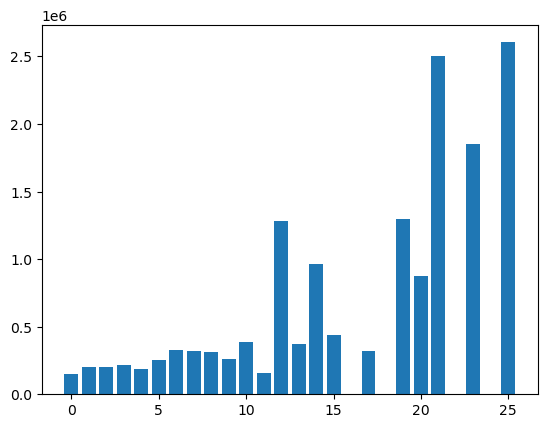

In [101]:
plt.bar(x = 'floor', height = 'median_price', data = floor)
plt.rcParams["figure.figsize"] = (50,20)

Excluímos los pisos más altos, diríamos los outlyers:

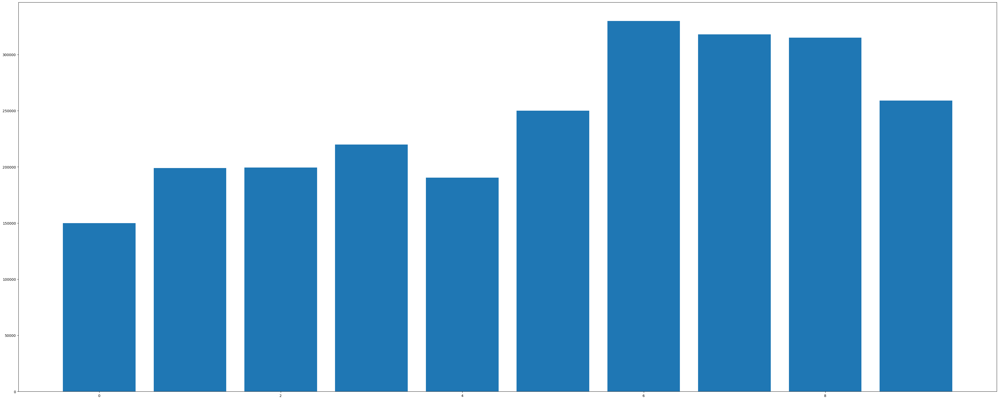

In [102]:
plt.bar(x = 'floor', height = 'median_price', data = floor[floor['floor'] < 10])
plt.rcParams["figure.figsize"] = (20,20)

Vemos que para pisos altos el precio aumenta mucho, pero tenemos muy pocas instancias (Menos de 10).

Para este ejemplo decidimos hacer una transformación categórica con pisos de hasta 4 plantas, hasta 10 plantas y superiores

In [103]:
def conditions_floow(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 4)):
        return "0 - 4"
    elif ((x >= 5) & (x < 10)):
        return "5 - 10"
    elif ((x >= 10)):
        return "+10"
    else:
        return "Unknown"

func = np.vectorize(conditions_floow)
lgbm_dataset['floor_cat'] = func(lgbm_dataset['floor'])
lgbm_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price,floor_cat
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,150000,5 - 10
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000,0 - 4
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000,0 - 4
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,540000,0 - 4
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,650000,0 - 4


In [104]:
import lightgbm as lgb

# Actualizamos las variables de nuevo
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'rooftop', 'elevator', 'pool', 'ac'
                    , 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat', 'floor_cat']

# Selecting only the variables we want
lgbm_dataset = lgbm_dataset[numeric_features + cat_features + target]
lgbm_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,5 - 10,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,0 - 4,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,0 - 4,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,0 - 4,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,0 - 4,650000


In [105]:
lgbm_dataset.isnull().sum() / len(lgbm_dataset)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
floor_cat               0.0
price                   0.0
dtype: float64

Definimos como tipo de dato "category" las categorías en nuestros datos:

In [106]:
for i in range(0, len(cat_features)):
    lgbm_dataset[cat_features[i]] = lgbm_dataset[cat_features[i]].astype("category")

lgbm_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,5 - 10,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,0 - 4,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,0 - 4,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,0 - 4,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,0 - 4,650000


Hacemos el modelo

In [107]:
import lightgbm as lgb

# Target and variable
X = lgbm_dataset.drop(['price'], axis = 1)
y = lgbm_dataset[['price']]
# Split in training and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
# create a train/test split with lightgbm
d_train_lgb = lgb.Dataset(X_train, label=y_train)
d_test_lgb = lgb.Dataset(X_test, label=y_test)

Definimos hiperparámetros

In [108]:
from sklearn.model_selection import GridSearchCV

# Define the LGB model to use
model = lgb.LGBMRegressor()

# Define the hyperparameter space to search over
param_grid = {
    'num_leaves': [2, 3, 4],
    'learning_rate': [0.015, 0.05, 0.01],
    'max_depth': [3, 4, 5, 6, 7, 8, 10, 12, 15]
}

# Create a GridSearchCV object and fit it to the data
grid_search = GridSearchCV(model, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and corresponding score
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

Best hyperparameters: {'learning_rate': 0.05, 'max_depth': 3, 'num_leaves': 4}
Best score: 0.7234451339752419


In [109]:
# Model cross validation
params = {
    'num_leaves': 4,
    'learning_rate': 0.05,
    'objective': 'regression',
    'metric': 'rmse'
    
}

scores = lgb.cv(params=params,
                train_set=d_train_lgb,
                num_boost_round=1000,
                nfold=10,
                early_stopping_rounds=50,
                verbose_eval=50,
                stratified=False)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1312
[LightGBM] [Info] Number of data points in the train set: 4203, number of used features: 18
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1312
[LightGBM] [Info] Number of data points in the train set: 4203, number of used features: 18
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1312
[LightGBM] [Info] Number of

In [110]:
params_lgb = {
    "learning_rate": 0.015,
    "boosting_type": "gbdt",
    "objective": "regression",
    "metric": "rmse",
    "verbose": 1,
    "boost_from_average": True,
    "max_depth": 3,
    "bagging_fraction": 0.7,
    "num_leaves": 4
}

model_lgb = lgb.train(params_lgb
                    , d_train_lgb
                    , 4200
                    , valid_sets = [d_test_lgb]
                    , early_stopping_rounds = 500
                    , verbose_eval = 50)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1312
[LightGBM] [Info] Number of data points in the train set: 4677, number of used features: 18
[LightGBM] [Info] Start training from score 366986.510798
Training until validation scores don't improve for 500 rounds
[50]	valid_0's rmse: 443363
[100]	valid_0's rmse: 387038
[150]	valid_0's rmse: 359051
[200]	valid_0's rmse: 343840
[250]	valid_0's rmse: 332742
[300]	valid_0's rmse: 325813
[350]	valid_0's rmse: 321296
[400]	valid_0's rmse: 318787
[450]	valid_0's rmse: 316027
[500]	valid_0's rmse: 312748
[550]	valid_0's rmse: 310330
[600]	valid_0's rmse: 307920
[650]	valid_0's rmse: 306063
[700]	valid_0's rmse: 303761
[750]	valid_0's rmse: 301776
[800]	valid_0's rmse: 300137
[850]	valid_0's rmse: 298455
[900]	valid_0's rmse: 297306
[950

In [111]:
pred_lgb_train = model_lgb.predict(X_train)
print("R2 Train: " + str(metrics.r2_score(y_train, pred_lgb_train)))
pred_lgb_test = model_lgb.predict(X_test)
print("R2 Test: " + str(metrics.r2_score(y_test, pred_lgb_test)))


R2 Train: 0.9294152168104537
R2 Test: 0.764169391525396


Un valor de R2 de 0,92 en el conjunto de entrenamiento y 0,76 en el conjunto de prueba sugiere que el modelo se está sobreajustando a los datos de entrenamiento y es posible que no se generalice bien con datos nuevos y que no conoce. Esto indica que es posible que el modelo deba optimizarse aún más o que se necesiten datos adicionales para mejorar el rendimiento del modelo. Probé con "learning_rate": 0.015 y con "learning_rate": 0.05 de acuerdo a lo que me arrojaba GridSearchCV pero no se ven cambios en el R2.
Para reducir el sobreajuste, también se puede intentar aumentar el parámetro num_leaves para permitir que el modelo aprenda relaciones más complejas en los datos.

In [112]:
model_results = ['lgb', 0, metrics.r2_score(y_test, pred_lgb_test)]
results = results.append(dict(zip(results.columns,model_results)), ignore_index=True)
results

,model,median_r2_cv_training,r2_validation
0,decision_tree_bagging,0.684371,0.663995
1,rf_1,0.646245,0.754117
2,catboost,0.000000,0.855535
3,stacking,0.000000,0.859255
4,lgb,0.000000,0.764169


# XGB

In [113]:
# Creating a new dataset
xgb_dataset = sale_dataset
xgb_dataset['rooms_per_sqm'] = xgb_dataset['rooms'] * 100 / xgb_dataset['sq_meters_built']
xgb_dataset['bathrooms_per_sqm'] = xgb_dataset['bathrooms'] * 100 / xgb_dataset['sq_meters_built']

# Defining the lists with all the variables
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'floor', 'rooftop', 'elevator'
                    , 'pool', 'ac', 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat']

# Selecting only the variables we want
xgb_dataset = sale_dataset[numeric_features + cat_features + target]
xgb_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,NaN,Unknown,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,NaN,Unknown,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,NaN,Unknown,650000


In [114]:
# Here we substitute all null values in the categorical variables for 0
for i in range(0,len(cat_features)):
    xgb_dataset[cat_features[i]].fillna("Unknown", inplace = True) 
xgb_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,650000


Comprobamos nulos

In [115]:
xgb_dataset.isnull().sum() / len(xgb_dataset)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
floor                   0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
price                   0.0
dtype: float64

Estudiamos la categoría floor como en Catboost y LGBboost para tener la misma estructura y comparar resultados de los modelos.

In [116]:
floor = xgb_dataset[['floor', 'price']].groupby('floor', as_index=False).agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    stantard_deviation=('price', "std")).sort_values('floor', ascending = True).reset_index()

floor

,index,floor,category_count,mean_price,median_price,min_price,max_price,stantard_deviation
0,0,0.0,2082,3.547253e+05,150000.0,28000,9500000,5.793529e+05
1,1,1.0,979,3.149467e+05,199000.0,57000,4000000,3.269784e+05
2,2,2.0,766,3.248612e+05,199500.0,69900,2200000,3.086992e+05
3,3,3.0,701,3.828466e+05,220000.0,80000,7450000,5.360943e+05
4,4,4.0,528,4.190089e+05,190500.0,35000,7450000,6.648578e+05
5,5,5.0,303,4.652099e+05,250000.0,75000,9500000,8.505172e+05
6,6,6.0,195,3.974853e+05,330000.0,83000,2800000,3.504742e+05
7,7,7.0,106,4.177689e+05,318000.0,75000,2800000,3.665028e+05
8,8,8.0,71,4.137886e+05,315000.0,90000,1690000,2.936820e+05
9,9,9.0,32,4.918719e+05,259000.0,132000,2475000,5.342262e+05


Precio medio de la vivienda a partir del piso.

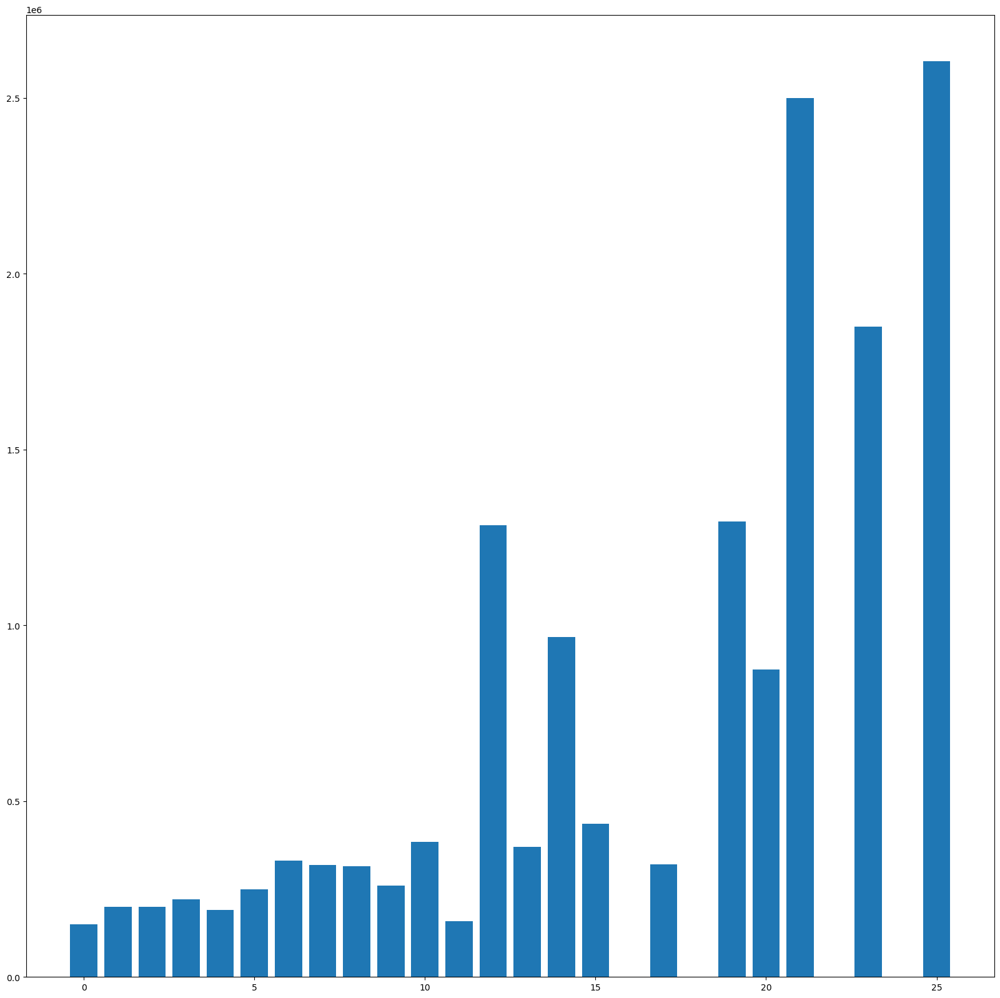

In [117]:
plt.bar(x = 'floor', height = 'median_price', data = floor)
plt.rcParams["figure.figsize"] = (50,20)

Excluímos los pisos más altos, diríamos los outlyers:

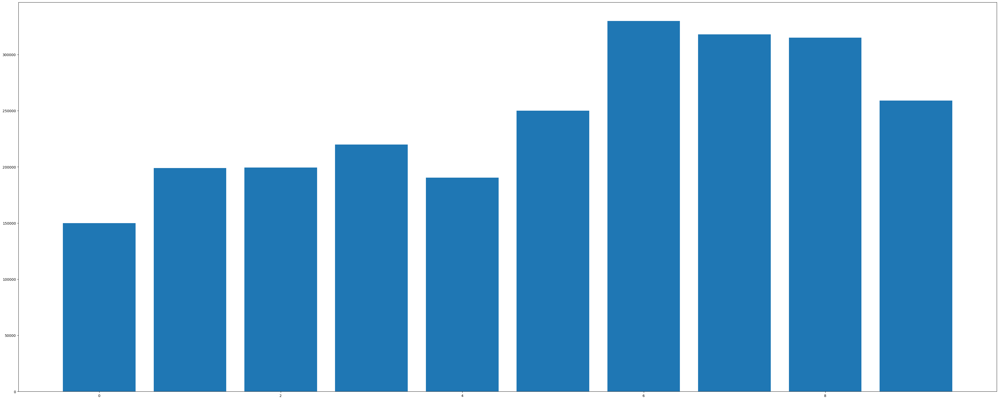

In [118]:
plt.bar(x = 'floor', height = 'median_price', data = floor[floor['floor'] < 10])
plt.rcParams["figure.figsize"] = (20,20)

In [119]:
def conditions_floow(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 4)):
        return "0 - 4"
    elif ((x >= 5) & (x < 10)):
        return "5 - 10"
    elif ((x >= 10)):
        return "+10"
    else:
        return "Unknown"

func = np.vectorize(conditions_floow)
xgb_dataset['floor_cat'] = func(xgb_dataset['floor'])
xgb_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price,floor_cat
0,67,4.477612,1.492537,0.0,1.0,1.0,5.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,150000,5 - 10
1,52,3.846154,1.923077,0.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,150000,0 - 4
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,395000,0 - 4
3,100,3.000000,1.000000,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,540000,0 - 4
4,141,2.127660,1.418440,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,650000,0 - 4


In [120]:
import xgboost as xgb

# Actualizamos las variables de nuevo
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'rooftop', 'elevator', 'pool', 'ac'
                    , 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat', 'floor_cat']

# Selecting only the variables we want
xgb_dataset = xgb_dataset[numeric_features + cat_features + target]
xgb_dataset.head()



,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,5 - 10,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,0 - 4,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,0 - 4,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,0 - 4,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,0 - 4,650000


In [121]:
xgb_dataset.isnull().sum() / len(xgb_dataset)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
floor_cat               0.0
price                   0.0
dtype: float64

Definimos como tipo de dato "category" las categorías en nuestros datos:

In [122]:
for i in range(0, len(cat_features)):
    xgb_dataset[cat_features[i]] = xgb_dataset[cat_features[i]].astype("category")

xgb_dataset.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,67,4.477612,1.492537,0.0,1.0,1.0,0.0,0.0,0.0,1.0,7.990993,0.121438,Ciutat Meridiana - Torre Baró - Vallbona,piso,este,Unknown,Unknown,5 - 10,150000
1,52,3.846154,1.923077,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.991000,0.277336,El Carmel,piso,Unknown,individual,Unknown,0 - 4,150000
2,91,2.197802,2.197802,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.579261,0.383878,El Poblenou,duplex,Unknown,electric,Unknown,0 - 4,395000
3,100,3.000000,1.000000,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.257852,0.875652,Sant Gervasi - Galvany,piso,sur,Unknown,Unknown,0 - 4,540000
4,141,2.127660,1.418440,0.0,0.0,1.0,0.0,1.0,0.0,1.0,4.283368,1.310073,Sarrià,piso,este,Unknown,Unknown,0 - 4,650000


In [123]:
print(xgb_dataset.dtypes)

sq_meters_built            int64
rooms_per_sqm            float64
bathrooms_per_sqm        float64
balcony                  float64
terrace                  float64
exterior                 float64
rooftop                  float64
elevator                 float64
pool                     float64
ac                       float64
dist_city_center         float64
dist_closest_station     float64
neighborhood            category
property_type           category
orientation             category
heating                 category
property_age_cat        category
floor_cat               category
price                      int64
dtype: object


Hacemos el modelo

In [124]:
# Target and variable
X = xgb_dataset.drop(['price'], axis = 1)
y = xgb_dataset[['price']]
# Split in training and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
# create a train/test split with xgboost
d_train_xgb = xgb.DMatrix(X_train, label=y_train, enable_categorical=True)
d_test_xgb = xgb.DMatrix(X_test, label=y_test, enable_categorical=True)

Definimos hiperparámetros

In [125]:
params = {
    "learning_rate": 0.3,
    "objective": "reg:squarederror",
    "eval_metric": "rmse",
    "max_depth": 20,
}

model_xgb = xgb.train(params
                        , d_train_xgb
                        , 10000
                        , evals = [(d_test_xgb, "Test")]
                        , verbose_eval=1000)

[0]	Test-rmse:554222.56456
[1000]	Test-rmse:272105.14738
[2000]	Test-rmse:272103.74818
[3000]	Test-rmse:272102.34961
[4000]	Test-rmse:272100.95210
[5000]	Test-rmse:272099.55512
[6000]	Test-rmse:272098.15779
[7000]	Test-rmse:272096.76269
[8000]	Test-rmse:272095.36698
[9000]	Test-rmse:272093.97271
[9999]	Test-rmse:272092.58026


In [126]:
pred_xgb_train = model_xgb.predict(d_train_xgb)
print("R2 Train: " + str(metrics.r2_score(y_train, pred_xgb_train)))
pred_xgb_test = model_xgb.predict(d_test_xgb)
print("R2 Test: " + str(metrics.r2_score(y_test, pred_xgb_test)))

R2 Train: 0.9999999805406298
R2 Test: 0.7728291996301376


R2 en el conjunto de datos de entrenamiento es muy alta (cerca de 1), lo que sugiere que el modelo se ajusta muy bien a los datos de entrenamiento. Sin embargo, la puntuación R2 en el conjunto de datos de prueba es significativamente más baja, lo que indica que el modelo no está funcionando tan bien con datos nuevos y que no conoce. Esto podría ser un signo de sobreajuste, donde el modelo está memorizando los datos de entrenamiento en lugar de aprender los patrones subyacentes y generalizar a nuevos datos.

In [127]:
model_results = ['xgb', 0, metrics.r2_score(y_test, pred_xgb_test)]
results = results.append(dict(zip(results.columns,model_results)), ignore_index=True)
results

,model,median_r2_cv_training,r2_validation
0,decision_tree_bagging,0.684371,0.663995
1,rf_1,0.646245,0.754117
2,catboost,0.000000,0.855535
3,stacking,0.000000,0.859255
4,lgb,0.000000,0.764169
5,xgb,0.000000,0.772829


Para concluir sobre el rendimiento de los modelos en función de su puntuación R2 media obtenida a través de la validación cruzada de los datos de entrenamiento y la puntuación R2 de los datos de validación podemos decir:

En función de la mediana de la puntuación R2 en los datos de entrenamiento, decision_tree_bagging tiene la puntuación más alta, seguido de RF_1. 

Sin embargo, cuando observamos el puntaje R2 en los datos de validación, podemos ver que CatBoost tiene el puntaje más alto, seguido por stacking. Esto sugiere que CatBoost pudo generalizar bien en los datos de validación no conocidos.

Los modelos LGB y XGB también se desempeñan razonablemente bien en los datos de validación, con XGB con una puntuación ligeramente más alta que LGB.

Es importante tener en cuenta que otras métricas, como el error cuadrático medio, el error absoluto medio y el tiempo de ejecución, también deben considerarse al elegir el mejor modelo para un problema en particular. En este caso los modelos decision_tree_bagging, rf_1, stacking llevaron cierto tiempo de ejecución.

Lo que se puede observar es que en todos los modelos el valor de R2 en el conjunto de entrenamiento es muy cercano a 1, lo que sugiere que los modelos están haciendo un ajuste muy preciso a los datos de entrenamiento. Sin embargo, un valor tan alto de R2 en el conjunto de entrenamiento podría indicar sobreajuste, es decir, que el modelo está memorizando los datos de entrenamiento en lugar de aprender patrones subyacentes que puedan generalizarse a nuevos datos.

Por otro lado, el valor de R2 en los conjuntos de prueba son mucho más bajo que el del conjunto de entrenamiento. Esto sugiere que los modelos quizás no están generalizando bien a nuevos datos, lo que podría ser un indicio de sobreajuste en el conjunto de entrenamiento. Hay una diferencia entre el valor de R2 en el conjunto de entrenamiento y el conjunto de prueba, lo que sugiere que el modelo está sobreajustando.

# Shap values analysis

Shap (SHapley Additive exPlanations) values analysis es una técnica de explicación de modelos de aprendizaje automático que permite entender cómo las variables o características individuales contribuyen al resultado de un modelo predictivo. Esta técnica proporciona una explicación para cada predicción realizada por el modelo y permite descomponer el resultado final en las contribuciones de cada variable.

Shap values se basa en la teoría de juegos y el concepto de valor de Shapley, que es una forma de asignar la contribución de cada jugador en un juego cooperativo a través de un conjunto de reglas justas. En el contexto de un modelo predictivo, las variables o características se consideran como "jugadores" que contribuyen al resultado final, y Shap values utiliza la teoría de valor de Shapley para determinar la contribución individual de cada variable.

Se realizará Shap values analysis con modelo CATboost y LightGBM

## CATBboost

In [128]:
explainer_cat = shap.TreeExplainer(model_cat)
explainer_cat

In [129]:
shap_values_cat = explainer_cat.shap_values(X_train)

In [130]:
print("Attributes")
print("")
print(X_train.iloc[0,:])
print("")
print("Price")
print("")
print(y_train.iloc[0,0])

Attributes

sq_meters_built                                     64
rooms_per_sqm                                   1.5625
bathrooms_per_sqm                               1.5625
balcony                                            0.0
terrace                                            0.0
exterior                                           1.0
rooftop                                            0.0
elevator                                           1.0
pool                                               0.0
ac                                                 1.0
dist_city_center                              1.872388
dist_closest_station                          0.456847
neighborhood            La Nova Esquerra de l'Eixample
property_type                                     piso
orientation                                    Unknown
heating                                             na
property_age_cat                                0 - 40
floor_cat                                        0 - 

In [131]:
print("Catboost Shap visualization for instance 0")
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0,:], X_train.iloc[0,:])

Catboost Shap visualization for instance 0


Lo que podemos interpetar de esta propiedad es que el precio se incrementa por el número de habitaciones por metro cuadrado, el barrio donde se encuentra, la edad de la propiedad (entre 0 a 40 años) y que dispone de ascensor, aire acondicionado.

Mientras lo que juega en contra serían los 64 m2 construidos, no dispone de calefacción y en menor medida la categría del piso, terraza y piscina.

In [132]:
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0:1000], X_train[0:1000])

Tenemos el rango que predomina el rojo y se incrementa a medida que aumentan los metros cuadrados construidos, lo cual es lógico en el sentido común. Lo mismo aplica para las habitaciones por metro cuadrado. En cuanto a la distancia al centro, vemos que mientras menos sea el valor de distancia, el precio incrementa.

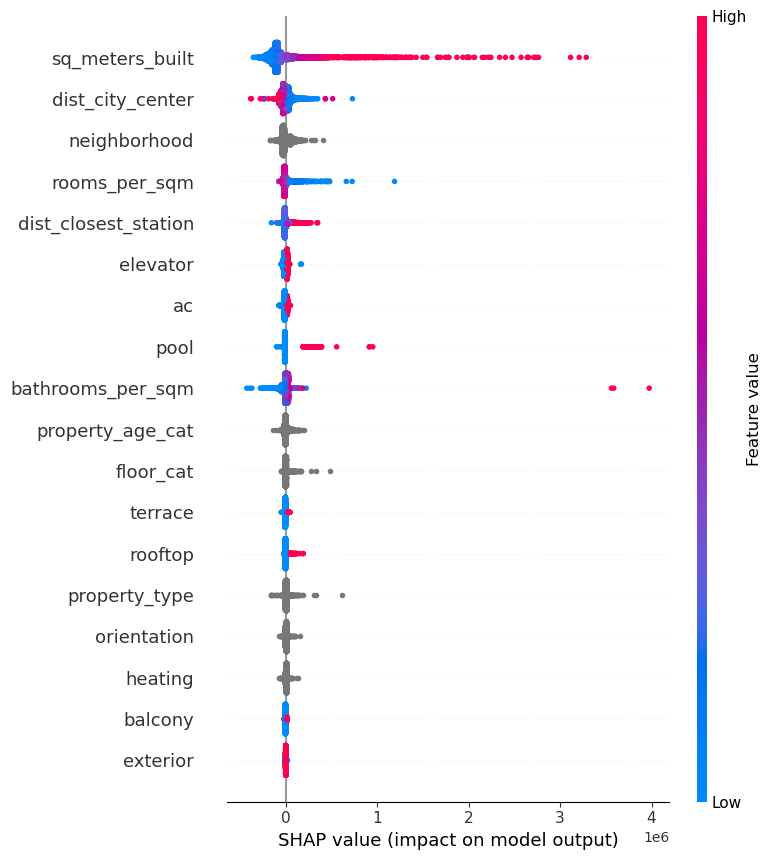

In [133]:
shap.summary_plot(shap_values_cat, X_train)

Lo que podemos observar de este gráfico es como lo descrito en punto anterior, el precio aumenta si aumentan los metros cuadrados construidos. Una interpretación de esto también es que si recordamos el histograma de sq_meters_biult tiene picos de datos en su extrema izquierda, siguen una distribución sesgada a la izquierda, los datos se concentran a la izquierda de la distribución, como nos muestra también la agrupación de puntos azules en este gráfico y luego la recta de puntos rojos como aquellas viviendas muy caras, con mucha cantidad de metros. La distancia al centro se ve que mientras más cercano más caras, aunque vemos unos puntos rojos que seguro pertenecen a los chalets de Pedralbes y Les Corts. 

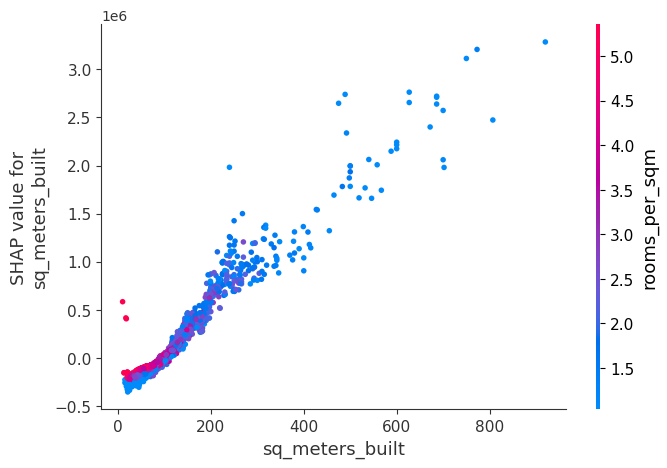

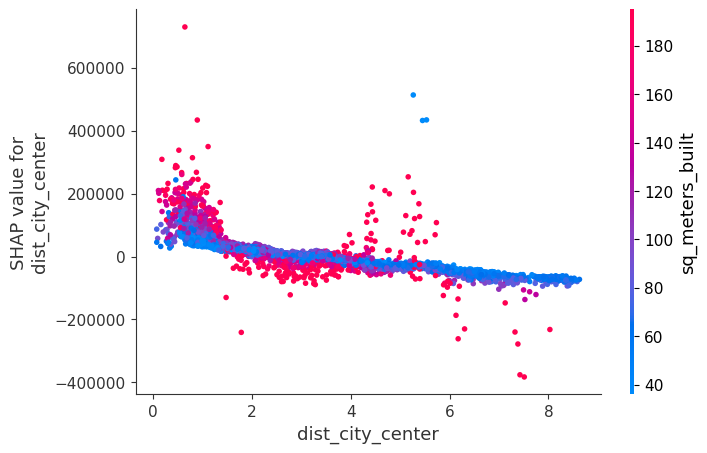

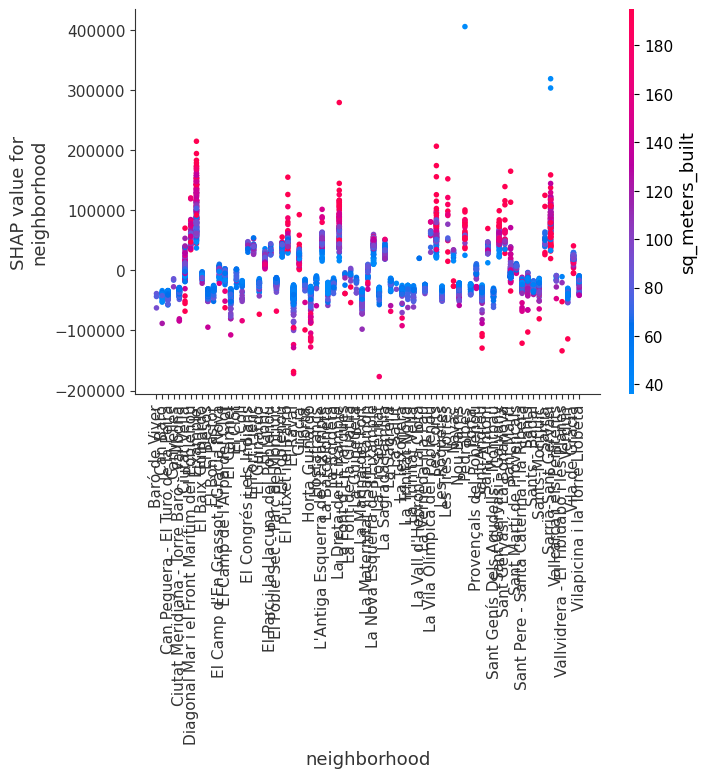

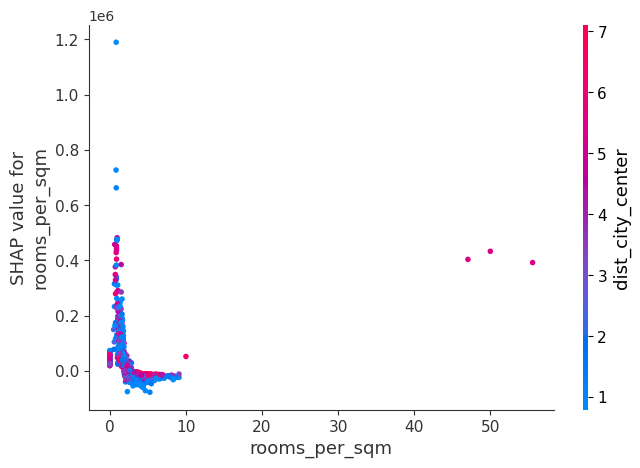

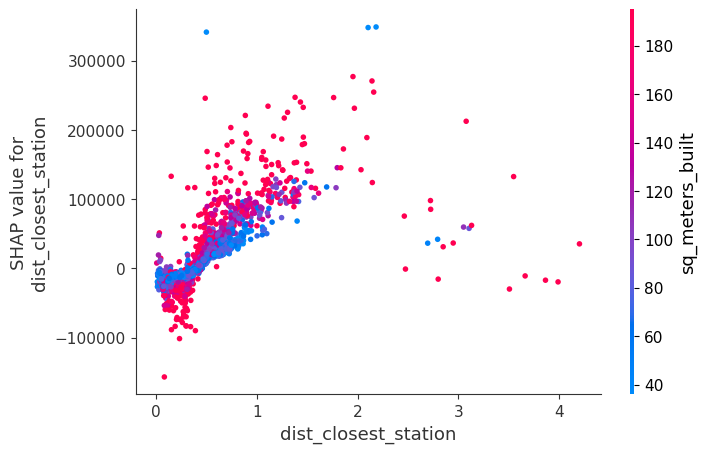

...

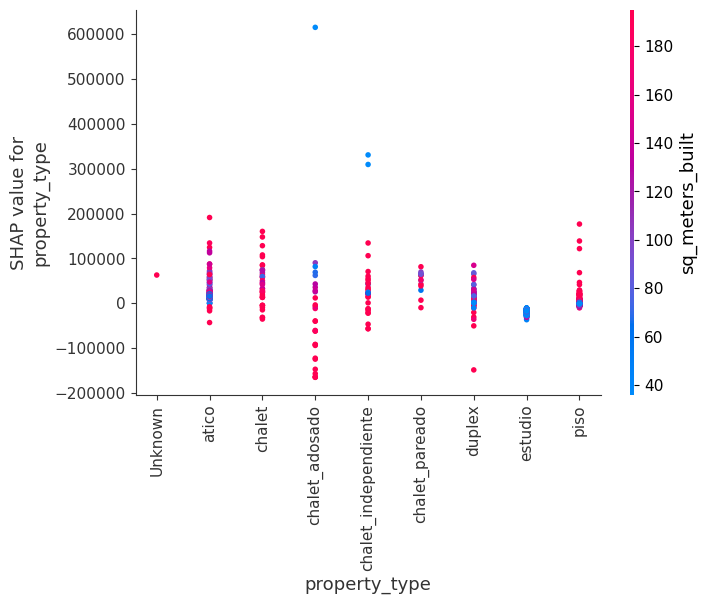

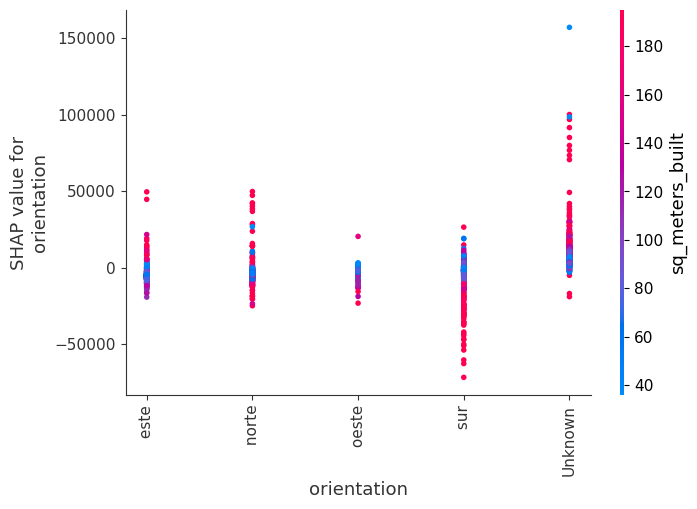

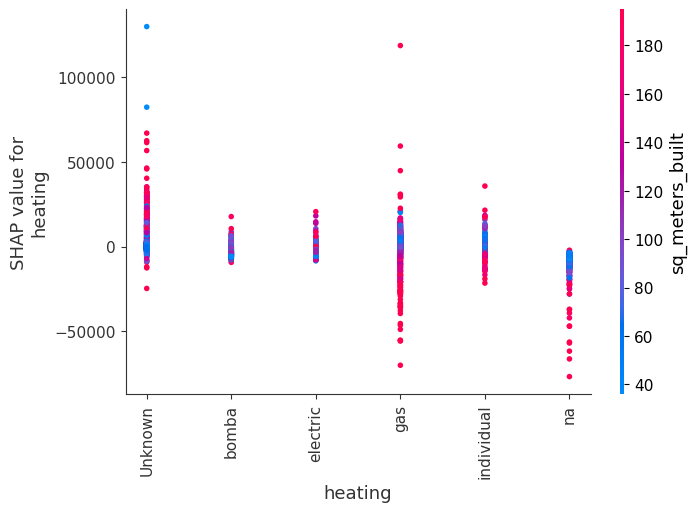

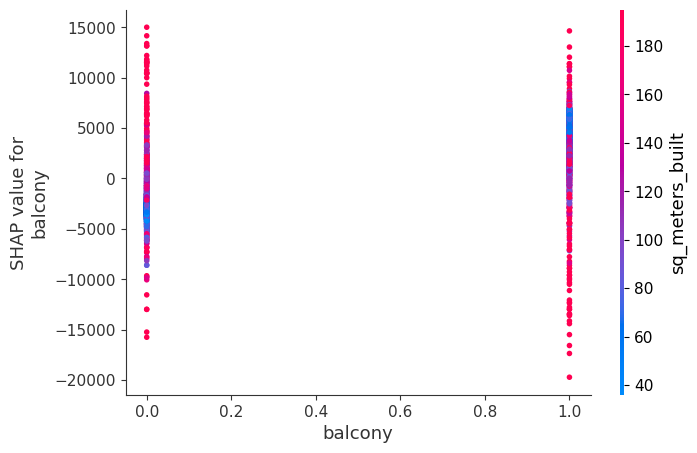

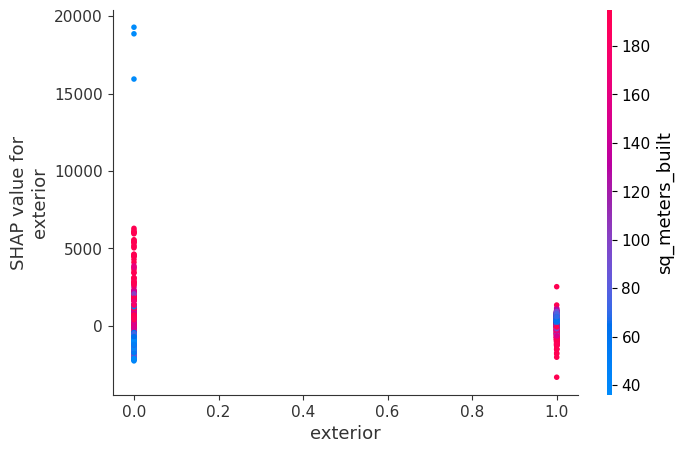

In [134]:
top_inds = np.argsort(-np.sum(np.abs(shap_values_cat), 0))

for i in range(0,len(top_inds)):
    shap.dependence_plot(top_inds[i], shap_values_cat, X_train)

En el primer gráfico de habitaciones por metro cuadrado, el modelo tiene una dispersión a partir de los 300 metros construidos. Pero se concentran en torno a 1 y 2 habitaciones, tanto las viviendas caras como las baratas.
Hay como una relación lineal entre estas variables, mientras más grande, más habitaciones.

Las viviendas que están mas cercanas al centro, parecen que son las más altas, las más alejadas, aparentemente son las casas más grandes. Hay que ver bien si el modelo interpeta estas viviendas muy caras.
Las casas pequeñas parecen seguir una tendencia levemente descendente, las casas peqeñas da más o menos igual, no parecen tener tanto impacto en el precio. 

La distancia a la estación más cercana, cuanto más lejos de una estación de metro, mejor. Eso es lo que nos está diciendo el modelo, lo cual no tiene mucho sentido, ya que en la realidad, mientras una vivienda esté mejor conectada al transporte público, tiene mayor rentabilidad.

Con respecto al AC aumenta a medida que la casa tiene más metros cuadrados, si no tiene AC el precio disminuye. Las viviendas que no tienen AC, los valores son negativos para todas.

## LightGBM

In [135]:
explainer_lightgbm = shap.TreeExplainer(model_lgb)
explainer_lightgbm

In [136]:
shap_values_lightgbm = explainer_lightgbm.shap_values(X_train)

In [137]:
print("Attributes")
print("")
print(X_train.iloc[0,:])
print("")
print("Price")
print("")
print(y_train.iloc[0,0])

Attributes

sq_meters_built                                     64
rooms_per_sqm                                   1.5625
bathrooms_per_sqm                               1.5625
balcony                                            0.0
terrace                                            0.0
exterior                                           1.0
rooftop                                            0.0
elevator                                           1.0
pool                                               0.0
ac                                                 1.0
dist_city_center                              1.872388
dist_closest_station                          0.456847
neighborhood            La Nova Esquerra de l'Eixample
property_type                                     piso
orientation                                    Unknown
heating                                             na
property_age_cat                                0 - 40
floor_cat                                        0 - 

In [138]:
print("LightGBM Shap visualization for instance 0")
shap.force_plot(explainer_lightgbm.expected_value, shap_values_lightgbm[0,:], X_train.iloc[0,:])

LightGBM Shap visualization for instance 0


Lo que podemos interpetar de esta propiedad es que el precio se incrementa por el número de habitaciones por metro cuadrado, el barrio donde se encuentra, la edad de la propiedad (entre 0 a 40 años) y que dispone de ascensor, aire acondicionado. Muy parecido a Catboost.

Mientras lo que juega en contra serían los 64 m2 construidos, la distancia al centro de la ciudad y si tiene balcón.

In [139]:
shap.force_plot(explainer_lightgbm.expected_value, shap_values_lightgbm[0:1000], X_train[0:1000])

Tenemos el rango que predomina el rojo y se incrementa a medida que aumentan los metros cuadrados construidos, lo cual es lógico en el sentido común. Lo mismo aplica para las habitaciones por metro cuadrado. En cuanto a la distancia al centro, vemos que mientras menos sea el valor de distancia, el precio incrementa.

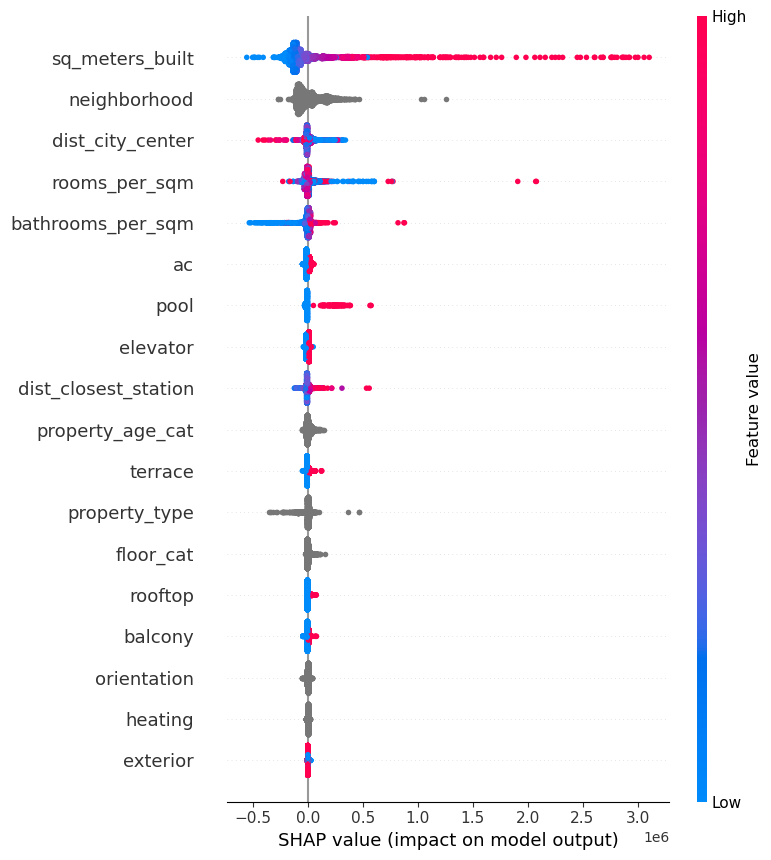

In [140]:
shap.summary_plot(shap_values_lightgbm, X_train)

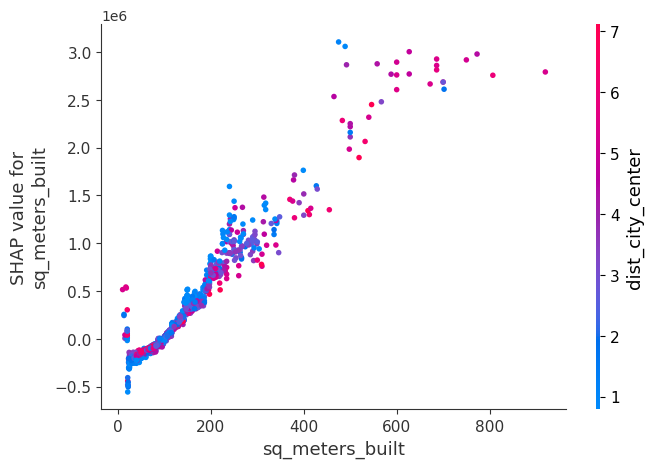

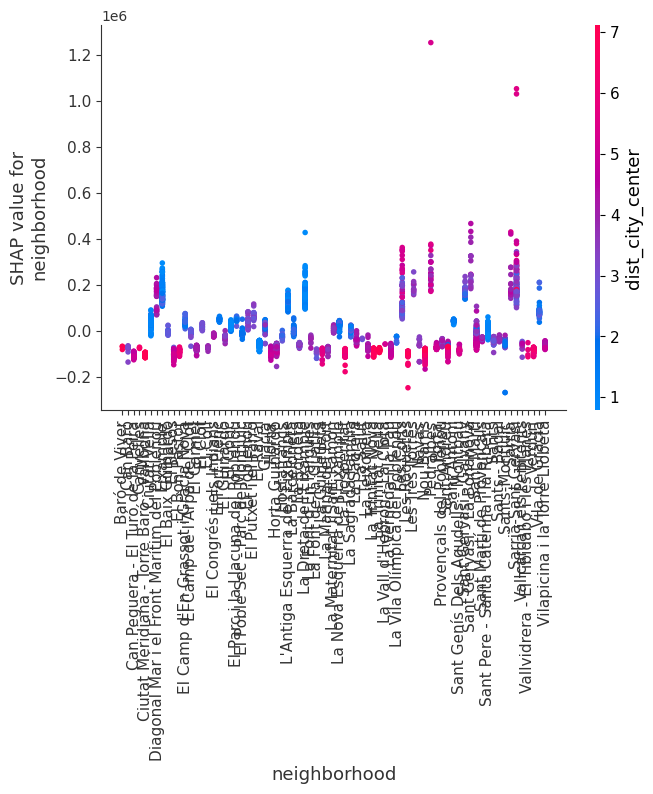

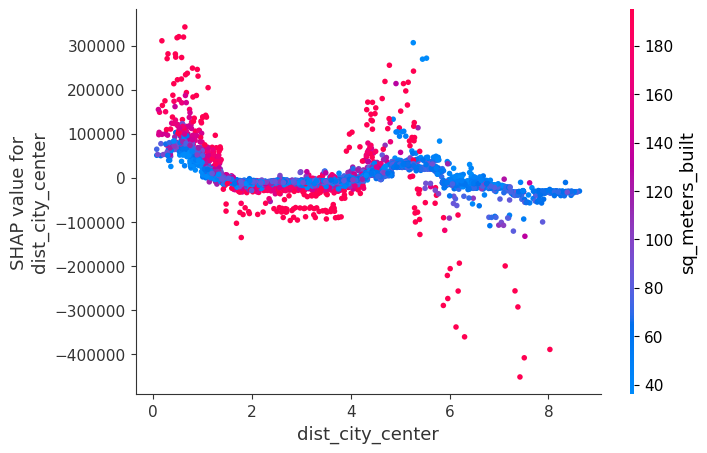

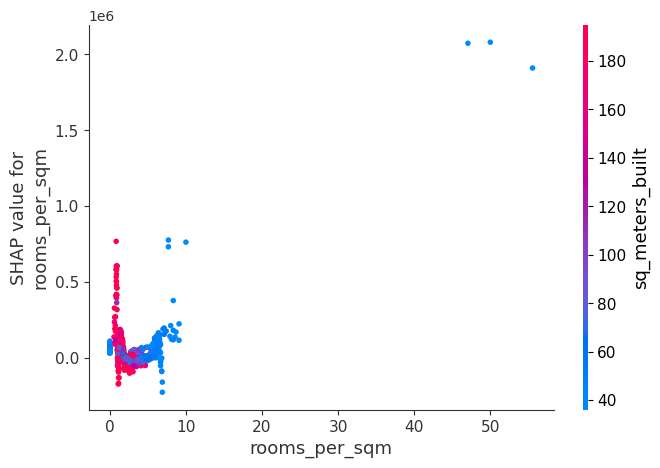

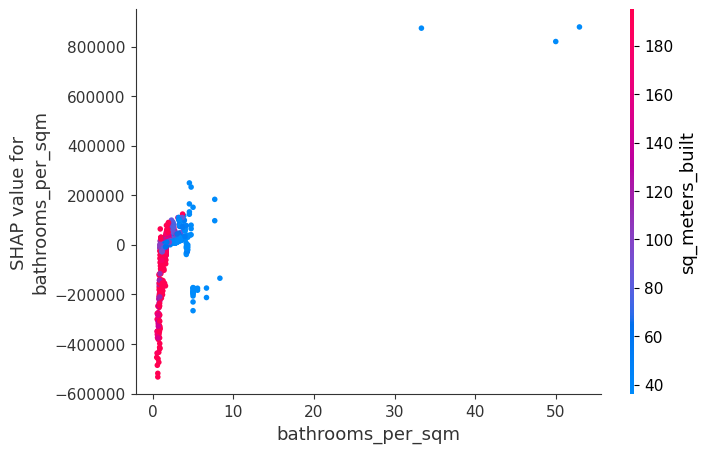

...

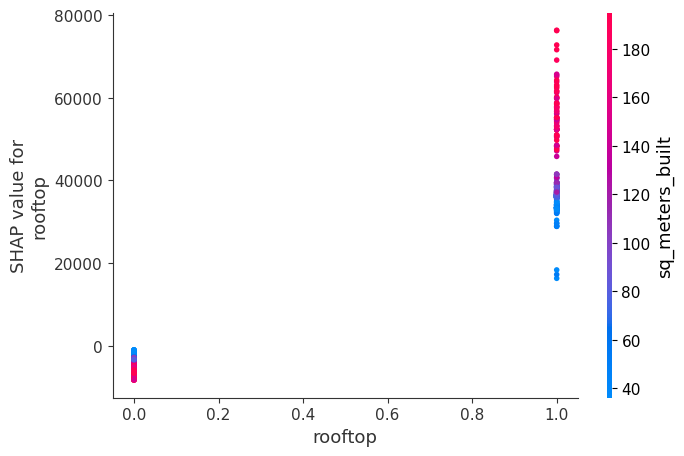

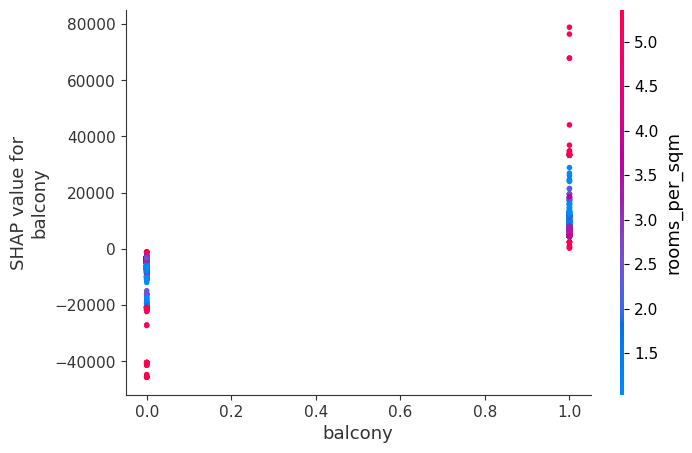

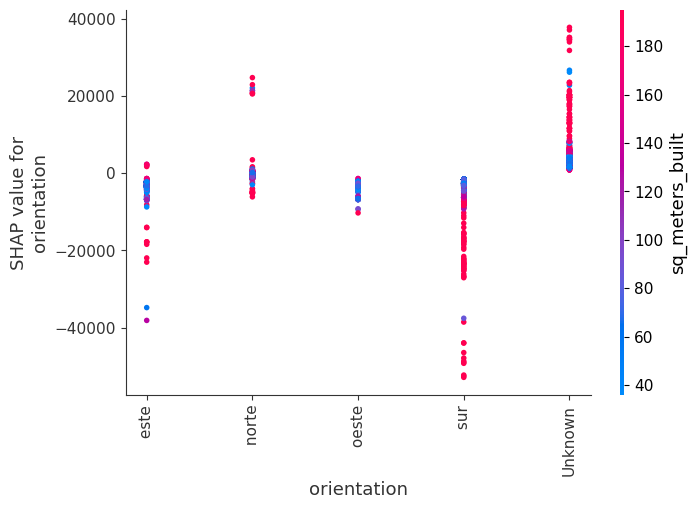

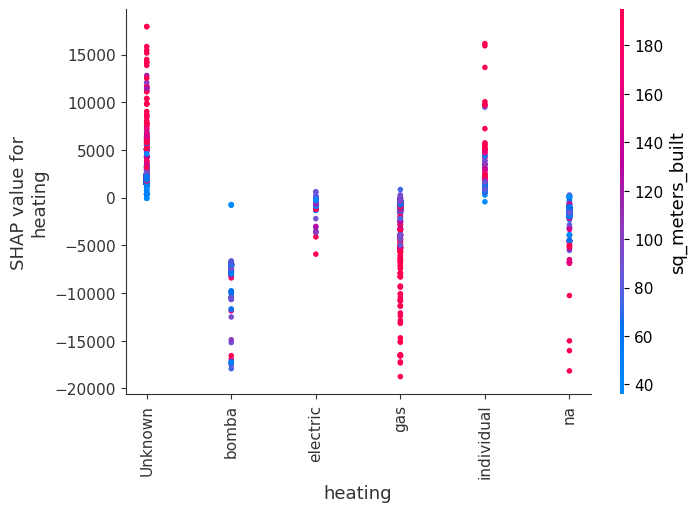

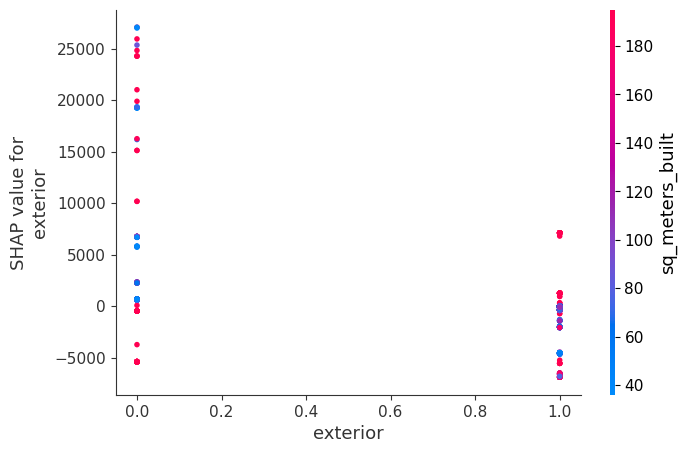

In [141]:
top_inds = np.argsort(-np.sum(np.abs(shap_values_lightgbm), 0))

for i in range(0,len(top_inds)):
    shap.dependence_plot(top_inds[i], shap_values_lightgbm, X_train)

# PREDICCIÓN CON RENT DATASET

Volveremos a cargar todos los datos y a reutilizar código para la predicción con Rent dataset.

In [142]:
raw_data = pd.read_csv('processed_renting_Barcelona.csv', delimiter = ',')
raw_data.head()

,id,price,currency,latitude,longitude,sq_meters,sq_meters_built,rooms,bathrooms,balcony,...,neighborhood,dist_city_center,furniture,garage,property_type,garden,closest_station,dist_closest_station,created_at,last_seen
0,536625,850,€/mes,41.401708,2.154077,52.0,55,2,1,NaN,...,Gràcia,2.026455,3.0,NaN,piso,NaN,Fontana,0.094111,9/1/2021 15:58,10/4/2021 6:01
1,545910,725,€/mes,41.407221,2.135569,32.0,37,2,1,1.0,...,Sant Gervasi - La Bonanova,3.582409,NaN,NaN,piso,NaN,Vallcarca,0.902561,9/2/2021 15:24,9/8/2021 12:29
2,570697,950,€/mes,41.411508,2.164608,NaN,72,3,1,NaN,...,El Baix Guinardó,2.663025,3.0,NaN,piso,NaN,Alfons X,0.188177,8/28/2021 23:52,8/28/2021 23:52
3,591588,750,€/mes,41.402256,2.140764,NaN,45,1,1,1.0,...,Sant Gervasi - La Bonanova,2.910067,3.0,NaN,piso,NaN,Lesseps,0.892917,8/29/2021 11:25,9/8/2021 12:29
4,610243,990,€/mes,41.405327,2.146929,NaN,45,1,1,NaN,...,Sarrià-Sant Gervasi,2.727149,3.0,NaN,piso,NaN,Lesseps,0.293784,8/30/2021 13:48,8/30/2021 14:04


In [143]:
rent_dataset = raw_data[['price','sq_meters_built', 'rooms', 'bathrooms', 'balcony', 'terrace', 'exterior', 'orientation', 'floor', 'rooftop', 'elevator', 'pool', 'ac', 'heating', 'year_built', 'neighborhood', 'dist_city_center', 'garage', 'property_type', 'garden', 'dist_closest_station']]
rent_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,pool,ac,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station
0,850,55,2,1,NaN,NaN,1.0,norte,2.0,NaN,...,NaN,1.0,NaN,NaN,Gràcia,2.026455,NaN,piso,NaN,0.094111
1,725,37,2,1,1.0,NaN,1.0,sur,3.0,NaN,...,NaN,1.0,NaN,1962.0,Sant Gervasi - La Bonanova,3.582409,NaN,piso,NaN,0.902561
2,950,72,3,1,NaN,NaN,1.0,NaN,4.0,NaN,...,NaN,1.0,NaN,NaN,El Baix Guinardó,2.663025,NaN,piso,NaN,0.188177
3,750,45,1,1,1.0,NaN,1.0,norte,4.0,NaN,...,NaN,NaN,NaN,1936.0,Sant Gervasi - La Bonanova,2.910067,NaN,piso,NaN,0.892917
4,990,45,1,1,NaN,NaN,1.0,sur,3.0,NaN,...,NaN,NaN,gas,NaN,Sarrià-Sant Gervasi,2.727149,NaN,piso,NaN,0.293784


Podemos asumir que para algunas de las variables, los valores nulos son en realidad 0.
Transformamos los valores nulos a 1 y 0. Y Orientation como Unknown al ser muchos valores.

In [144]:
rent_dataset['balcony'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['terrace'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['exterior'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['rooftop'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['elevator'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['pool'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['ac'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['garage'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['garden'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['floor'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['orientation'].fillna("Unknown", inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor

Para otras, como por ejemplo la property_age, podemos transformarla a una variable categórica incluyendo los valores nulos como una categoría de unknown:

In [145]:
rent_dataset['property_age'] = 2023 - rent_dataset['year_built']
rent_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,ac,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age
0,850,55,2,1,0.0,0.0,1.0,norte,2.0,0.0,...,1.0,NaN,NaN,Gràcia,2.026455,0.0,piso,0.0,0.094111,NaN
1,725,37,2,1,1.0,0.0,1.0,sur,3.0,0.0,...,1.0,NaN,1962.0,Sant Gervasi - La Bonanova,3.582409,0.0,piso,0.0,0.902561,61.0
2,950,72,3,1,0.0,0.0,1.0,Unknown,4.0,0.0,...,1.0,NaN,NaN,El Baix Guinardó,2.663025,0.0,piso,0.0,0.188177,NaN
3,750,45,1,1,1.0,0.0,1.0,norte,4.0,0.0,...,0.0,NaN,1936.0,Sant Gervasi - La Bonanova,2.910067,0.0,piso,0.0,0.892917,87.0
4,990,45,1,1,0.0,0.0,1.0,sur,3.0,0.0,...,0.0,gas,NaN,Sarrià-Sant Gervasi,2.727149,0.0,piso,0.0,0.293784,NaN


array([[<AxesSubplot: title={'center': 'property_age'}>]], dtype=object)

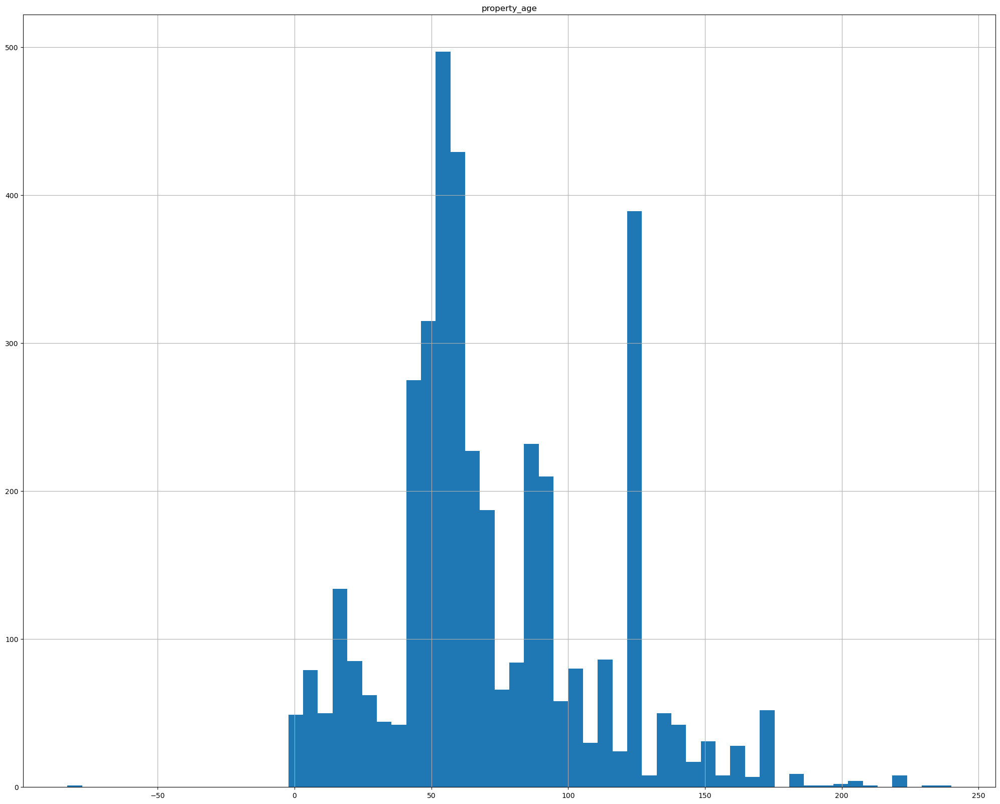

In [146]:
# Scatter matrix, similar a la función pairs. Cuidado que solo sive para variables numéricas
rent_dataset[['property_age']].hist(bins=60, figsize=(25, 20))

Vemos los pequeños "clusters de viviendas, los cuales podemos agrupar en categorías según la edad de la vivienda:

In [147]:
def conditions(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 40)):
        return "0 - 40"
    elif ((x >= 40) & (x < 70)):
        return "40 - 70"
    elif ((x >= 70) & (x < 120)):
        return "70 - 120"
    elif ((x >= 120) & (x < 150)):
        return "120 - 150"
    elif ((x >= 150)):
        return "+150"
    else:
        return "Unknown"

func = np.vectorize(conditions)
rent_dataset['property_age_cat'] = func(rent_dataset['property_age'])
rent_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age,property_age_cat
0,850,55,2,1,0.0,0.0,1.0,norte,2.0,0.0,...,NaN,NaN,Gràcia,2.026455,0.0,piso,0.0,0.094111,NaN,Unknown
1,725,37,2,1,1.0,0.0,1.0,sur,3.0,0.0,...,NaN,1962.0,Sant Gervasi - La Bonanova,3.582409,0.0,piso,0.0,0.902561,61.0,40 - 70
2,950,72,3,1,0.0,0.0,1.0,Unknown,4.0,0.0,...,NaN,NaN,El Baix Guinardó,2.663025,0.0,piso,0.0,0.188177,NaN,Unknown
3,750,45,1,1,1.0,0.0,1.0,norte,4.0,0.0,...,NaN,1936.0,Sant Gervasi - La Bonanova,2.910067,0.0,piso,0.0,0.892917,87.0,70 - 120
4,990,45,1,1,0.0,0.0,1.0,sur,3.0,0.0,...,gas,NaN,Sarrià-Sant Gervasi,2.727149,0.0,piso,0.0,0.293784,NaN,Unknown


Del dataset que tenemos, generamos un subset con valores numéricos únicamente:

In [148]:
cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat']
rent_dataset_numeric = rent_dataset.drop(cat_features, axis = 1)
rent_dataset_numeric

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,year_built,dist_city_center,garage,garden,dist_closest_station,property_age
0,850,55,2,1,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,NaN,2.026455,0.0,0.0,0.094111,NaN
1,725,37,2,1,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,1962.0,3.582409,0.0,0.0,0.902561,61.0
2,950,72,3,1,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,NaN,2.663025,0.0,0.0,0.188177,NaN
3,750,45,1,1,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,1936.0,2.910067,0.0,0.0,0.892917,87.0
4,990,45,1,1,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,NaN,2.727149,0.0,0.0,0.293784,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8497,907,49,0,1,0.0,1.0,1.0,9.0,0.0,1.0,0.0,0.0,1966.0,1.317748,0.0,0.0,0.285426,57.0
8498,950,125,1,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1997.0,4.063099,0.0,0.0,0.534462,26.0
8499,950,48,2,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1890.0,0.288753,0.0,0.0,0.261938,133.0
8500,926,51,2,1,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,NaN,3.909033,1.0,0.0,0.545561,NaN


Comprobamos que no hay nulls

In [149]:
rent_dataset_numeric_no_nulls = rent_dataset_numeric.drop(['year_built', 'property_age', 'floor'], axis = 1)
rent_dataset_numeric_no_nulls.isnull().sum() / len(rent_dataset_numeric_no_nulls)

price                   0.0
sq_meters_built         0.0
rooms                   0.0
bathrooms               0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
garage                  0.0
garden                  0.0
dist_closest_station    0.0
dtype: float64

Tratamiento de sq_meters_built en relación al número de habitaciones y de baños


In [150]:
rent_dataset_numeric_no_nulls['rooms_per_sqm'] = rent_dataset_numeric_no_nulls['rooms'] * 100 / rent_dataset_numeric_no_nulls['sq_meters_built']
rent_dataset_numeric_no_nulls['bathrooms_per_sqm'] = rent_dataset_numeric_no_nulls['bathrooms'] * 100 / rent_dataset_numeric_no_nulls['sq_meters_built']
rent_dataset_numeric_no_nulls = rent_dataset_numeric_no_nulls.drop(['rooms', 'bathrooms'], axis=1)
rent_dataset_numeric_no_nulls.head()

,price,sq_meters_built,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,garage,garden,dist_closest_station,rooms_per_sqm,bathrooms_per_sqm
0,850,55,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.0,0.0,0.094111,3.636364,1.818182
1,725,37,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.0,0.0,0.902561,5.405405,2.702703
2,950,72,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.0,0.0,0.188177,4.166667,1.388889
3,750,45,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.0,0.0,0.892917,2.222222,2.222222
4,990,45,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.0,0.0,0.293784,2.222222,2.222222


In [151]:
# Creating a new dataset
catboost_dataset_prediction = rent_dataset
catboost_dataset_prediction['rooms_per_sqm'] = catboost_dataset_prediction['rooms'] * 100 / catboost_dataset_prediction['sq_meters_built']
catboost_dataset_prediction['bathrooms_per_sqm'] = catboost_dataset_prediction['bathrooms'] * 100 / catboost_dataset_prediction['sq_meters_built']

# Defining the lists with all the variables
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'floor', 'rooftop', 'elevator'
                    , 'pool', 'ac', 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat']

# Selecting only the variables we want
catboost_dataset_prediction = rent_dataset[numeric_features + cat_features + target]
catboost_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,NaN,Unknown,850
1,37,5.405405,2.702703,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,NaN,40 - 70,725
2,72,4.166667,1.388889,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,NaN,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,NaN,70 - 120,750
4,45,2.222222,2.222222,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,990


In [152]:
# Here we substitute all null values in the categorical variables for 0
for i in range(0,len(cat_features)):
    catboost_dataset_prediction[cat_features[i]].fillna("Unknown", inplace = True) 
catboost_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,850
1,37,5.405405,2.702703,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,725
2,72,4.166667,1.388889,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,750
4,45,2.222222,2.222222,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,990


Comprobamos nulos

In [153]:
catboost_dataset_prediction.isnull().sum() / len(catboost_dataset_prediction)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
floor                   0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
price                   0.0
dtype: float64

Estudiamos la categoría floor

In [154]:
floor = catboost_dataset_prediction[['floor', 'price']].groupby('floor', as_index=False).agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    stantard_deviation=('price', "std")).sort_values('floor', ascending = True).reset_index()

floor

,index,floor,category_count,mean_price,median_price,min_price,max_price,stantard_deviation
0,0,0.0,1966,1180.254832,835.5,400,27500,1476.044623
1,1,1.0,1621,1058.713140,850.0,375,15000,872.195510
2,2,2.0,1444,1034.605956,850.0,450,8000,657.958040
3,3,3.0,1247,1076.694467,850.0,365,11000,728.365237
4,4,4.0,967,1109.232678,850.0,480,14000,919.922265
5,5,5.0,583,1124.686106,900.0,419,7250,620.034299
6,6,6.0,298,1227.724832,942.5,550,7200,820.993341
7,7,7.0,192,1345.104167,950.0,500,8000,1027.784049
8,8,8.0,87,1079.298851,900.0,460,3500,562.091797
9,9,9.0,41,1371.560976,925.0,700,3400,746.857652


Para este ejemplo decidimos hacer una transformación categórica con pisos de hasta 4 plantas, hasta 10 plantas y superiores

In [155]:
def conditions_floow(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 4)):
        return "0 - 4"
    elif ((x >= 5) & (x < 10)):
        return "5 - 10"
    elif ((x >= 10)):
        return "+10"
    else:
        return "Unknown"

func = np.vectorize(conditions_floow)
catboost_dataset_prediction['floor_cat'] = func(catboost_dataset_prediction['floor'])
catboost_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price,floor_cat
0,55,3.636364,1.818182,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,850,0 - 4
1,37,5.405405,2.702703,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,725,0 - 4
2,72,4.166667,1.388889,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,950,Unknown
3,45,2.222222,2.222222,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,750,Unknown
4,45,2.222222,2.222222,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,990,0 - 4


In [156]:
# Actualizamos las variables de nuevo
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'rooftop', 'elevator', 'pool', 'ac'
                    , 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat', 'floor_cat']

# Selecting only the variables we want
catboost_dataset_prediction = catboost_dataset_prediction[numeric_features + cat_features + target]
catboost_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990


In [157]:
catboost_dataset_prediction.isnull().sum() / len(catboost_dataset_prediction)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
floor_cat               0.0
price                   0.0
dtype: float64

Definimos como tipo de dato "category" las categorías en nuestros datos:

In [158]:
for i in range(0,len(cat_features)):
   catboost_dataset_prediction[cat_features[i]] = catboost_dataset_prediction[cat_features[i]].astype("category")
catboost_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990


In [159]:
# tipos de datos en el dataframe
data_types = catboost_dataset_prediction.dtypes

# display the data types of each column
print(data_types)

sq_meters_built            int64
rooms_per_sqm            float64
bathrooms_per_sqm        float64
balcony                  float64
terrace                  float64
exterior                 float64
rooftop                  float64
elevator                 float64
pool                     float64
ac                       float64
dist_city_center         float64
dist_closest_station     float64
neighborhood            category
property_type           category
orientation             category
heating                 category
property_age_cat        category
floor_cat               category
price                      int64
dtype: object


## CATBOOST PREDICTION with rent dataset

Preparamos datos para el modelo catboost

In [160]:
# load the new dataset
d_pred_cat = cat.Pool(data=catboost_dataset_prediction.drop(['price'], axis=1), label=catboost_dataset_prediction['price'], cat_features=cat_features)

# generate predictions on the new dataset
y_pred_pred = model_cat.predict(d_pred_cat)

# calculate evaluation metrics
r2_pred = metrics.r2_score(catboost_dataset_prediction['price'], y_pred_pred)
mse_pred = metrics.mean_squared_error(catboost_dataset_prediction['price'], y_pred_pred)
mae_pred = metrics.mean_absolute_error(catboost_dataset_prediction['price'], y_pred_pred)

# print the evaluation metrics
print("R2 Prediction: " + str(r2_pred))
print("MSE Prediction: " + str(mse_pred))
print("MAE Prediction: " + str(mae_pred))

R2 Prediction: -194981.2821894589
MSE Prediction: 198956110197.7239
MAE Prediction: 317354.6972412682


La puntuación R2 de la predicción es -194981,2821894589, lo que indica que el modelo tiene un rendimiento muy deficiente. La puntuación R2 varía de -infinito a 1, donde 1 indica un ajuste perfecto y 0 indica un ajuste aleatorio. Un valor negativo indica que el modelo está funcionando peor que un ajuste aleatorio.

El error cuadrático medio (MSE) de la predicción es 198956110197,7239, que es una medida de la diferencia cuadrática media entre los valores previstos y reales. Cuanto mayor sea el MSE, peor será el rendimiento del modelo.

El error absoluto medio (MAE) de la predicción es 317354,6972412682, que es una medida de la diferencia absoluta media entre los valores previstos y reales. El MAE es una métrica más interpretable que el MSE, ya que representa la magnitud promedio de los errores en los valores predichos en las mismas unidades que los datos originales.

In [161]:
# print the predicted values
print(y_pred_pred)

[220351.26758289 210884.04728311 264377.47398827 ... 113362.29795341
 227242.29696903 271224.68906714]


In [162]:
# create a DataFrame from y_pred_pred
df = pd.DataFrame({'predicted_values': y_pred_pred})

# print the DataFrame
print(df)

      predicted_values
0        220351.267583
1        210884.047283
2        264377.473988
3        244661.253469
4        188684.739792
...                ...
8497     154644.790025
8498     314239.905528
8499     113362.297953
8500     227242.296969
8501     271224.689067

[8502 rows x 1 columns]


In [163]:
# tipos de datos en el dataframe
data_types = df.dtypes

# display the data types of each column
print(data_types)

predicted_values    float64
dtype: object


In [164]:
# Create price ranges
bins = [0, 200000, 400000, 600000, 800000, 1000000, 1200000]
labels = ['<200k', '200k-400k', '400k-600k', '600k-800k', '800k-1M', '1M+']
df['price_range'] = pd.cut(df['predicted_values'], bins=bins, labels=labels)

# Count occurrences of each price range
count_table = df['price_range'].value_counts()

print(count_table)

200k-400k    3950
<200k        3066
400k-600k     782
600k-800k     272
800k-1M       158
1M+            76
Name: price_range, dtype: int64


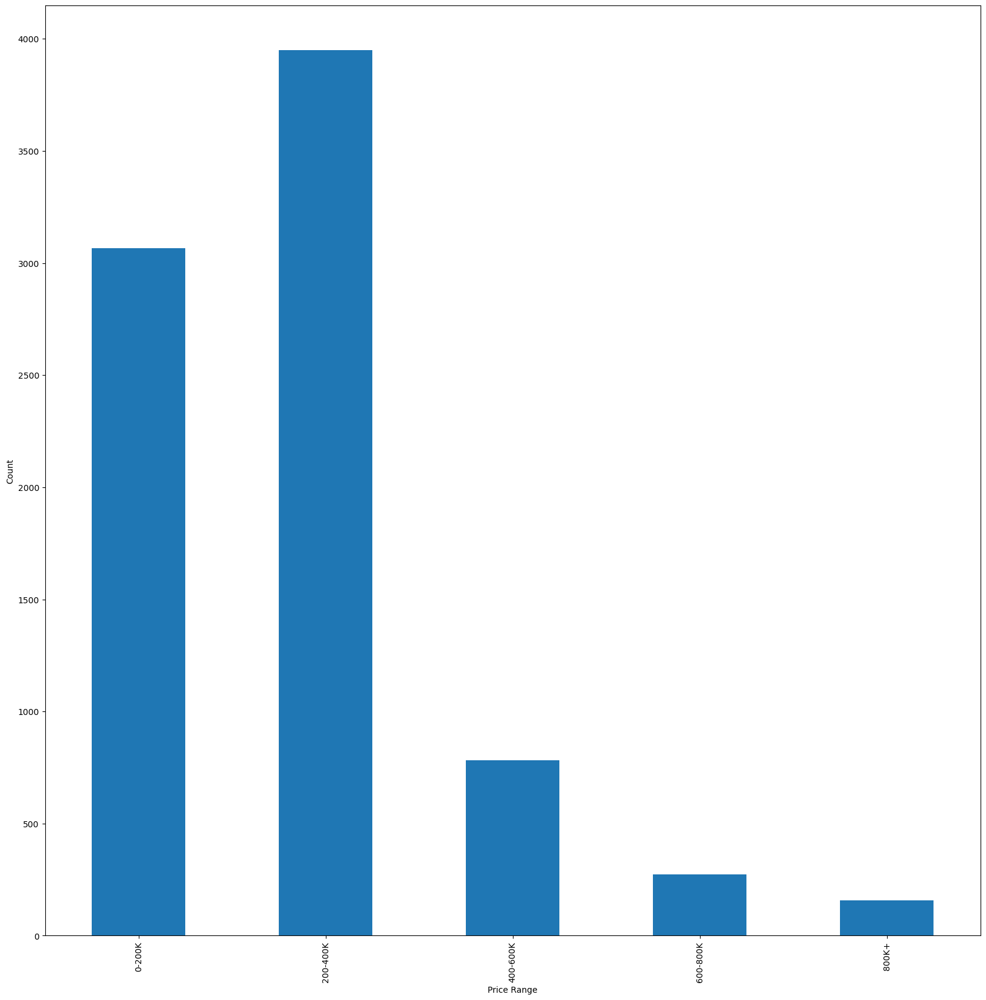

In [165]:
# create price range categories
bins = [0, 200000, 400000, 600000, 800000, 1000000]
labels = ['0-200K', '200-400K', '400-600K', '600-800K', '800K+']
df['price_range'] = pd.cut(df['predicted_values'], bins=bins, labels=labels)

# plot price range categories
fig, ax = plt.subplots()
df['price_range'].value_counts().sort_index().plot(kind='bar', ax=ax)
ax.set_xlabel('Price Range')
ax.set_ylabel('Count')
plt.show()

In [166]:
catboost_dataset_prediction

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8497,49,0.000000,2.040816,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.317748,0.285426,Sant Antoni,estudio,norte,Unknown,40 - 70,5 - 10,907
8498,125,0.800000,0.800000,0.0,0.0,0.0,0.0,1.0,0.0,1.0,4.063099,0.534462,La Font d'En Fargues,piso,Unknown,na,0 - 40,0 - 4,950
8499,48,4.166667,2.083333,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.288753,0.261938,El Raval,piso,Unknown,electric,120 - 150,0 - 4,950
8500,51,3.921569,1.960784,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.909033,0.545561,La Maternitat i Sant Ramon,piso,Unknown,Unknown,Unknown,0 - 4,926


In [167]:
catboost_dataset_prediction['predicted_price'] = y_pred_pred

In [168]:
catboost_dataset_prediction

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price,predicted_price
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850,220351.267583
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725,210884.047283
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950,264377.473988
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750,244661.253469
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990,188684.739792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8497,49,0.000000,2.040816,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.317748,0.285426,Sant Antoni,estudio,norte,Unknown,40 - 70,5 - 10,907,154644.790025
8498,125,0.800000,0.800000,0.0,0.0,0.0,0.0,1.0,0.0,1.0,4.063099,0.534462,La Font d'En Fargues,piso,Unknown,na,0 - 40,0 - 4,950,314239.905528
8499,48,4.166667,2.083333,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.288753,0.261938,El Raval,piso,Unknown,electric,120 - 150,0 - 4,950,113362.297953
8500,51,3.921569,1.960784,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.909033,0.545561,La Maternitat i Sant Ramon,piso,Unknown,Unknown,Unknown,0 - 4,926,227242.296969


In [169]:
# calcular la métrica de Break-even
break_even = catboost_dataset_prediction['predicted_price'] / catboost_dataset_prediction['price']

# agregar la métrica de Break-even como una nueva columna en el DataFrame
catboost_dataset_prediction['break_even'] = break_even

# agregar la métrica de Break-even anual como una nueva columna en el DataFrame
break_even_years = catboost_dataset_prediction['break_even'] / 12

# agregar la métrica de Break-even como una nueva columna en el DataFrame
catboost_dataset_prediction['break_even_years'] = break_even_years

In [170]:
catboost_dataset_prediction

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,...,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price,predicted_price,break_even,break_even_years
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850,220351.267583,259.236785,21.603065
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725,210884.047283,290.874548,24.239546
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950,264377.473988,278.292078,23.191006
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750,244661.253469,326.215005,27.184584
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990,188684.739792,190.590646,15.882554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8497,49,0.000000,2.040816,0.0,1.0,1.0,0.0,1.0,0.0,0.0,...,Sant Antoni,estudio,norte,Unknown,40 - 70,5 - 10,907,154644.790025,170.501422,14.208452
8498,125,0.800000,0.800000,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,La Font d'En Fargues,piso,Unknown,na,0 - 40,0 - 4,950,314239.905528,330.778848,27.564904
8499,48,4.166667,2.083333,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,El Raval,piso,Unknown,electric,120 - 150,0 - 4,950,113362.297953,119.328735,9.944061
8500,51,3.921569,1.960784,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,La Maternitat i Sant Ramon,piso,Unknown,Unknown,Unknown,0 - 4,926,227242.296969,245.402049,20.450171


In [171]:
# Check the data types and summary statistics of the numerical columns
print(catboost_dataset_prediction.dtypes)
print(catboost_dataset_prediction.describe())

sq_meters_built            int64
rooms_per_sqm            float64
bathrooms_per_sqm        float64
balcony                  float64
terrace                  float64
exterior                 float64
rooftop                  float64
elevator                 float64
pool                     float64
ac                       float64
dist_city_center         float64
dist_closest_station     float64
neighborhood            category
property_type           category
orientation             category
heating                 category
property_age_cat        category
floor_cat               category
price                      int64
predicted_price          float64
break_even               float64
break_even_years         float64
dtype: object
       sq_meters_built  rooms_per_sqm  bathrooms_per_sqm      balcony  \
count      8502.000000    8502.000000        8502.000000  8502.000000   
mean         72.478711       2.960772           1.930918     0.409904   
std          49.650215       1.375317    

El valor medio del precio previsto de las propiedades es 318472,2, que es significativamente superior al valor mínimo de 50926,22 e inferior al valor máximo de 5221718. Esto indica que hay una amplia gama de precios de propiedades en el conjunto de datos. El valor de equilibrio medio es 275,5, lo que indica que se necesitan 22,96 años para recuperar el costo de la propiedad, suponiendo que la propiedad se alquila continuamente. La desviación estándar del valor de equilibrio es 91,26, lo que indica que existe una variabilidad importante en el tiempo que se tarda en recuperar el costo de la propiedad.

El valor mínimo de equilibrio es 47,95, lo que indica que hay algunas propiedades que pueden ser rentables en un período de tiempo relativamente corto. El valor máximo de equilibrio es 2088.77, lo que indica que hay algunas propiedades que pueden tardar mucho en recuperar el costo y pueden no ser rentables en el corto plazo.

El valor medio de los años de equilibrio de 22,96 indica que se necesitan casi 23 años para recuperar el costo de la propiedad.

Los datos predichos sugieren que existe una amplia gama de precios de propiedades y niveles de rentabilidad en el conjunto de datos, y que puede llevar una cantidad significativa de tiempo recuperar el costo de la propiedad, según la propiedad y la ubicación específica.

## LGB PREDICTION with rent dataset

In [172]:
raw_data = pd.read_csv('processed_renting_Barcelona.csv', delimiter = ',')
raw_data.head()

,id,price,currency,latitude,longitude,sq_meters,sq_meters_built,rooms,bathrooms,balcony,...,neighborhood,dist_city_center,furniture,garage,property_type,garden,closest_station,dist_closest_station,created_at,last_seen
0,536625,850,€/mes,41.401708,2.154077,52.0,55,2,1,NaN,...,Gràcia,2.026455,3.0,NaN,piso,NaN,Fontana,0.094111,9/1/2021 15:58,10/4/2021 6:01
1,545910,725,€/mes,41.407221,2.135569,32.0,37,2,1,1.0,...,Sant Gervasi - La Bonanova,3.582409,NaN,NaN,piso,NaN,Vallcarca,0.902561,9/2/2021 15:24,9/8/2021 12:29
2,570697,950,€/mes,41.411508,2.164608,NaN,72,3,1,NaN,...,El Baix Guinardó,2.663025,3.0,NaN,piso,NaN,Alfons X,0.188177,8/28/2021 23:52,8/28/2021 23:52
3,591588,750,€/mes,41.402256,2.140764,NaN,45,1,1,1.0,...,Sant Gervasi - La Bonanova,2.910067,3.0,NaN,piso,NaN,Lesseps,0.892917,8/29/2021 11:25,9/8/2021 12:29
4,610243,990,€/mes,41.405327,2.146929,NaN,45,1,1,NaN,...,Sarrià-Sant Gervasi,2.727149,3.0,NaN,piso,NaN,Lesseps,0.293784,8/30/2021 13:48,8/30/2021 14:04


In [173]:
rent_dataset = raw_data[['price','sq_meters_built', 'rooms', 'bathrooms', 'balcony', 'terrace', 'exterior', 'orientation', 'floor', 'rooftop', 'elevator', 'pool', 'ac', 'heating', 'year_built', 'neighborhood', 'dist_city_center', 'garage', 'property_type', 'garden', 'dist_closest_station']]
rent_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,pool,ac,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station
0,850,55,2,1,NaN,NaN,1.0,norte,2.0,NaN,...,NaN,1.0,NaN,NaN,Gràcia,2.026455,NaN,piso,NaN,0.094111
1,725,37,2,1,1.0,NaN,1.0,sur,3.0,NaN,...,NaN,1.0,NaN,1962.0,Sant Gervasi - La Bonanova,3.582409,NaN,piso,NaN,0.902561
2,950,72,3,1,NaN,NaN,1.0,NaN,4.0,NaN,...,NaN,1.0,NaN,NaN,El Baix Guinardó,2.663025,NaN,piso,NaN,0.188177
3,750,45,1,1,1.0,NaN,1.0,norte,4.0,NaN,...,NaN,NaN,NaN,1936.0,Sant Gervasi - La Bonanova,2.910067,NaN,piso,NaN,0.892917
4,990,45,1,1,NaN,NaN,1.0,sur,3.0,NaN,...,NaN,NaN,gas,NaN,Sarrià-Sant Gervasi,2.727149,NaN,piso,NaN,0.293784


Podemos asumir que para algunas de las variables, los valores nulos son en realidad 0.
Transformamos los valores nulos a 1 y 0. Y Orientation como Unknown al ser muchos valores.

In [174]:
rent_dataset['balcony'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['terrace'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['exterior'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['rooftop'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['elevator'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['pool'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['ac'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['garage'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['garden'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['floor'].fillna(0, inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor
rent_dataset['orientation'].fillna("Unknown", inplace = True) # Sustituye los Null values de una columna por 0. Podemos cambiar el 0 por cualquier otro valor

Para otras, como por ejemplo la property_age, podemos transformarla a una variable categórica incluyendo los valores nulos como una categoría de unknown:

In [175]:
rent_dataset['property_age'] = 2023 - rent_dataset['year_built']
rent_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,ac,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age
0,850,55,2,1,0.0,0.0,1.0,norte,2.0,0.0,...,1.0,NaN,NaN,Gràcia,2.026455,0.0,piso,0.0,0.094111,NaN
1,725,37,2,1,1.0,0.0,1.0,sur,3.0,0.0,...,1.0,NaN,1962.0,Sant Gervasi - La Bonanova,3.582409,0.0,piso,0.0,0.902561,61.0
2,950,72,3,1,0.0,0.0,1.0,Unknown,4.0,0.0,...,1.0,NaN,NaN,El Baix Guinardó,2.663025,0.0,piso,0.0,0.188177,NaN
3,750,45,1,1,1.0,0.0,1.0,norte,4.0,0.0,...,0.0,NaN,1936.0,Sant Gervasi - La Bonanova,2.910067,0.0,piso,0.0,0.892917,87.0
4,990,45,1,1,0.0,0.0,1.0,sur,3.0,0.0,...,0.0,gas,NaN,Sarrià-Sant Gervasi,2.727149,0.0,piso,0.0,0.293784,NaN


array([[<AxesSubplot: title={'center': 'property_age'}>]], dtype=object)

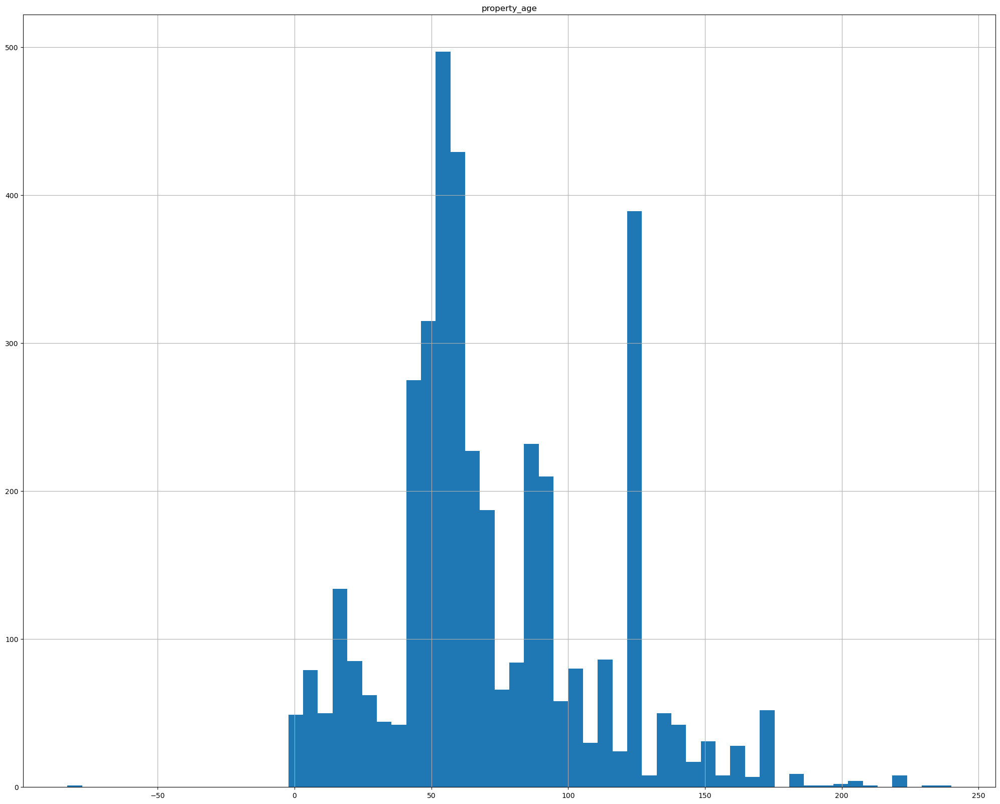

In [176]:
# Scatter matrix, similar a la función pairs. Cuidado que solo sive para variables numéricas
rent_dataset[['property_age']].hist(bins=60, figsize=(25, 20))

Vemos los pequeños "clusters de viviendas, los cuales podemos agrupar en categorías según la edad de la vivienda:

In [177]:
def conditions(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 40)):
        return "0 - 40"
    elif ((x >= 40) & (x < 70)):
        return "40 - 70"
    elif ((x >= 70) & (x < 120)):
        return "70 - 120"
    elif ((x >= 120) & (x < 150)):
        return "120 - 150"
    elif ((x >= 150)):
        return "+150"
    else:
        return "Unknown"

func = np.vectorize(conditions)
rent_dataset['property_age_cat'] = func(rent_dataset['property_age'])
rent_dataset.head()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,orientation,floor,rooftop,...,heating,year_built,neighborhood,dist_city_center,garage,property_type,garden,dist_closest_station,property_age,property_age_cat
0,850,55,2,1,0.0,0.0,1.0,norte,2.0,0.0,...,NaN,NaN,Gràcia,2.026455,0.0,piso,0.0,0.094111,NaN,Unknown
1,725,37,2,1,1.0,0.0,1.0,sur,3.0,0.0,...,NaN,1962.0,Sant Gervasi - La Bonanova,3.582409,0.0,piso,0.0,0.902561,61.0,40 - 70
2,950,72,3,1,0.0,0.0,1.0,Unknown,4.0,0.0,...,NaN,NaN,El Baix Guinardó,2.663025,0.0,piso,0.0,0.188177,NaN,Unknown
3,750,45,1,1,1.0,0.0,1.0,norte,4.0,0.0,...,NaN,1936.0,Sant Gervasi - La Bonanova,2.910067,0.0,piso,0.0,0.892917,87.0,70 - 120
4,990,45,1,1,0.0,0.0,1.0,sur,3.0,0.0,...,gas,NaN,Sarrià-Sant Gervasi,2.727149,0.0,piso,0.0,0.293784,NaN,Unknown


Del dataset que tenemos, generamos un subset con valores numéricos únicamente:

In [178]:
cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat']
rent_dataset_numeric = rent_dataset.drop(cat_features, axis = 1)
rent_dataset_numeric

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,year_built,dist_city_center,garage,garden,dist_closest_station,property_age
0,850,55,2,1,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,NaN,2.026455,0.0,0.0,0.094111,NaN
1,725,37,2,1,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,1962.0,3.582409,0.0,0.0,0.902561,61.0
2,950,72,3,1,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,NaN,2.663025,0.0,0.0,0.188177,NaN
3,750,45,1,1,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,1936.0,2.910067,0.0,0.0,0.892917,87.0
4,990,45,1,1,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,NaN,2.727149,0.0,0.0,0.293784,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8497,907,49,0,1,0.0,1.0,1.0,9.0,0.0,1.0,0.0,0.0,1966.0,1.317748,0.0,0.0,0.285426,57.0
8498,950,125,1,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1997.0,4.063099,0.0,0.0,0.534462,26.0
8499,950,48,2,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1890.0,0.288753,0.0,0.0,0.261938,133.0
8500,926,51,2,1,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,NaN,3.909033,1.0,0.0,0.545561,NaN


Comprobamos que no hay nulls

In [179]:
rent_dataset_numeric_no_nulls = rent_dataset_numeric.drop(['year_built', 'property_age', 'floor'], axis = 1)
rent_dataset_numeric_no_nulls.isnull().sum() / len(rent_dataset_numeric_no_nulls)

price                   0.0
sq_meters_built         0.0
rooms                   0.0
bathrooms               0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
garage                  0.0
garden                  0.0
dist_closest_station    0.0
dtype: float64

Tratamiento de sq_meters_built en relación al número de habitaciones y de baños

In [180]:
rent_dataset_numeric_no_nulls['rooms_per_sqm'] = rent_dataset_numeric_no_nulls['rooms'] * 100 / rent_dataset_numeric_no_nulls['sq_meters_built']
rent_dataset_numeric_no_nulls['bathrooms_per_sqm'] = rent_dataset_numeric_no_nulls['bathrooms'] * 100 / rent_dataset_numeric_no_nulls['sq_meters_built']
rent_dataset_numeric_no_nulls = rent_dataset_numeric_no_nulls.drop(['rooms', 'bathrooms'], axis=1)
rent_dataset_numeric_no_nulls.head()

,price,sq_meters_built,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,garage,garden,dist_closest_station,rooms_per_sqm,bathrooms_per_sqm
0,850,55,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.0,0.0,0.094111,3.636364,1.818182
1,725,37,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.0,0.0,0.902561,5.405405,2.702703
2,950,72,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.0,0.0,0.188177,4.166667,1.388889
3,750,45,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.0,0.0,0.892917,2.222222,2.222222
4,990,45,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.0,0.0,0.293784,2.222222,2.222222


In [181]:
# Creating a new dataset
lgb_dataset_prediction = rent_dataset
lgb_dataset_prediction['rooms_per_sqm'] = lgb_dataset_prediction['rooms'] * 100 / lgb_dataset_prediction['sq_meters_built']
lgb_dataset_prediction['bathrooms_per_sqm'] = lgb_dataset_prediction['bathrooms'] * 100 / lgb_dataset_prediction['sq_meters_built']

# Defining the lists with all the variables
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'floor', 'rooftop', 'elevator'
                    , 'pool', 'ac', 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat']

# Selecting only the variables we want
lgb_dataset_prediction = rent_dataset[numeric_features + cat_features + target]
lgb_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,NaN,Unknown,850
1,37,5.405405,2.702703,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,NaN,40 - 70,725
2,72,4.166667,1.388889,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,NaN,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,NaN,70 - 120,750
4,45,2.222222,2.222222,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,990


In [182]:
# Here we substitute all null values in the categorical variables for 0
for i in range(0,len(cat_features)):
    lgb_dataset_prediction[cat_features[i]].fillna("Unknown", inplace = True) 
lgb_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,850
1,37,5.405405,2.702703,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,725
2,72,4.166667,1.388889,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,750
4,45,2.222222,2.222222,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,990


Comprobamos nulos

In [183]:
lgb_dataset_prediction.isnull().sum() / len(lgb_dataset_prediction)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
floor                   0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
price                   0.0
dtype: float64

Estudiamos la categoría floor

In [184]:
floor = lgb_dataset_prediction[['floor', 'price']].groupby('floor', as_index=False).agg(
    # Number of instances per category
    category_count=('price', "count"),
    # Mean price
    mean_price=('price', "mean"),
    # Median price
    median_price=('price', "median"),
    # Min price
    min_price=('price', min),
    # Max price
    max_price=('price', max),
    # Standard deviation
    stantard_deviation=('price', "std")).sort_values('floor', ascending = True).reset_index()

floor

,index,floor,category_count,mean_price,median_price,min_price,max_price,stantard_deviation
0,0,0.0,1966,1180.254832,835.5,400,27500,1476.044623
1,1,1.0,1621,1058.713140,850.0,375,15000,872.195510
2,2,2.0,1444,1034.605956,850.0,450,8000,657.958040
3,3,3.0,1247,1076.694467,850.0,365,11000,728.365237
4,4,4.0,967,1109.232678,850.0,480,14000,919.922265
5,5,5.0,583,1124.686106,900.0,419,7250,620.034299
6,6,6.0,298,1227.724832,942.5,550,7200,820.993341
7,7,7.0,192,1345.104167,950.0,500,8000,1027.784049
8,8,8.0,87,1079.298851,900.0,460,3500,562.091797
9,9,9.0,41,1371.560976,925.0,700,3400,746.857652


Para este ejemplo decidimos hacer una transformación categórica con pisos de hasta 4 plantas, hasta 10 plantas y superiores

In [185]:
def conditions_floow(x):
    if x < 0:
        return "Unknown"
    elif ((x >= 0) & (x < 4)):
        return "0 - 4"
    elif ((x >= 5) & (x < 10)):
        return "5 - 10"
    elif ((x >= 10)):
        return "+10"
    else:
        return "Unknown"

func = np.vectorize(conditions_floow)
lgb_dataset_prediction['floor_cat'] = func(lgb_dataset_prediction['floor'])
lgb_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,price,floor_cat
0,55,3.636364,1.818182,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,850,0 - 4
1,37,5.405405,2.702703,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,725,0 - 4
2,72,4.166667,1.388889,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,950,Unknown
3,45,2.222222,2.222222,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,750,Unknown
4,45,2.222222,2.222222,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,990,0 - 4


In [186]:
# Actualizamos las variables de nuevo
target = ['price']
numeric_features = ['sq_meters_built', 'rooms_per_sqm', 'bathrooms_per_sqm', 'balcony'
                    , 'terrace', 'exterior', 'rooftop', 'elevator', 'pool', 'ac'
                    , 'dist_city_center', 'dist_closest_station']

cat_features = ['neighborhood', 'property_type', 'orientation', 'heating', 'property_age_cat', 'floor_cat']

# Selecting only the variables we want
lgb_dataset_prediction = lgb_dataset_prediction[numeric_features + cat_features + target]
lgb_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990


In [187]:
lgb_dataset_prediction.isnull().sum() / len(lgb_dataset_prediction)

sq_meters_built         0.0
rooms_per_sqm           0.0
bathrooms_per_sqm       0.0
balcony                 0.0
terrace                 0.0
exterior                0.0
rooftop                 0.0
elevator                0.0
pool                    0.0
ac                      0.0
dist_city_center        0.0
dist_closest_station    0.0
neighborhood            0.0
property_type           0.0
orientation             0.0
heating                 0.0
property_age_cat        0.0
floor_cat               0.0
price                   0.0
dtype: float64

Definimos como tipo de dato "category" las categorías en nuestros datos:

In [188]:
for i in range(0,len(cat_features)):
   lgb_dataset_prediction[cat_features[i]] = lgb_dataset_prediction[cat_features[i]].astype("category")
lgb_dataset_prediction.head()

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990


In [189]:
# tipos de datos en el dataframe
data_types = lgb_dataset_prediction.dtypes

# display the data types of each column
print(data_types)

sq_meters_built            int64
rooms_per_sqm            float64
bathrooms_per_sqm        float64
balcony                  float64
terrace                  float64
exterior                 float64
rooftop                  float64
elevator                 float64
pool                     float64
ac                       float64
dist_city_center         float64
dist_closest_station     float64
neighborhood            category
property_type           category
orientation             category
heating                 category
property_age_cat        category
floor_cat               category
price                      int64
dtype: object


In [190]:
# load the new dataset
# Target and variable
x = lgb_dataset_prediction.drop(['price'], axis = 1)
y = lgb_dataset_prediction[['price']]

In [191]:

# generate predictions on the new dataset
y_pred_pred = model_lgb.predict(x, predict_raw_score=False)

# calculate evaluation metrics
r2_pred = metrics.r2_score(lgb_dataset_prediction['price'], y_pred_pred)
mse_pred = metrics.mean_squared_error(lgb_dataset_prediction['price'], y_pred_pred)
mae_pred = metrics.mean_absolute_error(lgb_dataset_prediction['price'], y_pred_pred)

# print the evaluation metrics
print("R2 Prediction: " + str(r2_pred))
print("MSE Prediction: " + str(mse_pred))
print("MAE Prediction: " + str(mae_pred))

R2 Prediction: -210849.1479438334
MSE Prediction: 215147370307.0012
MAE Prediction: 330983.33048305736


In [192]:
# print the predicted values
print(y_pred_pred)

[225978.62612475 458701.63408396 254891.63304451 ... 167191.81440134
 241169.01430594 240411.46819949]


In [193]:
# create a DataFrame from y_pred_pred
df = pd.DataFrame({'predicted_values': y_pred_pred})

# print the DataFrame
print(df)

      predicted_values
0        225978.626125
1        458701.634084
2        254891.633045
3        350085.327102
4        333183.318421
...                ...
8497     179948.203513
8498     634285.601607
8499     167191.814401
8500     241169.014306
8501     240411.468199

[8502 rows x 1 columns]


In [194]:
# Create price ranges
bins = [0, 200000, 400000, 600000, 800000, 1000000, 1200000]
labels = ['<200k', '200k-400k', '400k-600k', '600k-800k', '800k-1M', '1M+']
df['price_range'] = pd.cut(df['predicted_values'], bins=bins, labels=labels)

# Count occurrences of each price range
count_table = df['price_range'].value_counts()

print(count_table)

200k-400k    4018
<200k        2752
400k-600k     926
600k-800k     292
800k-1M       186
1M+            85
Name: price_range, dtype: int64


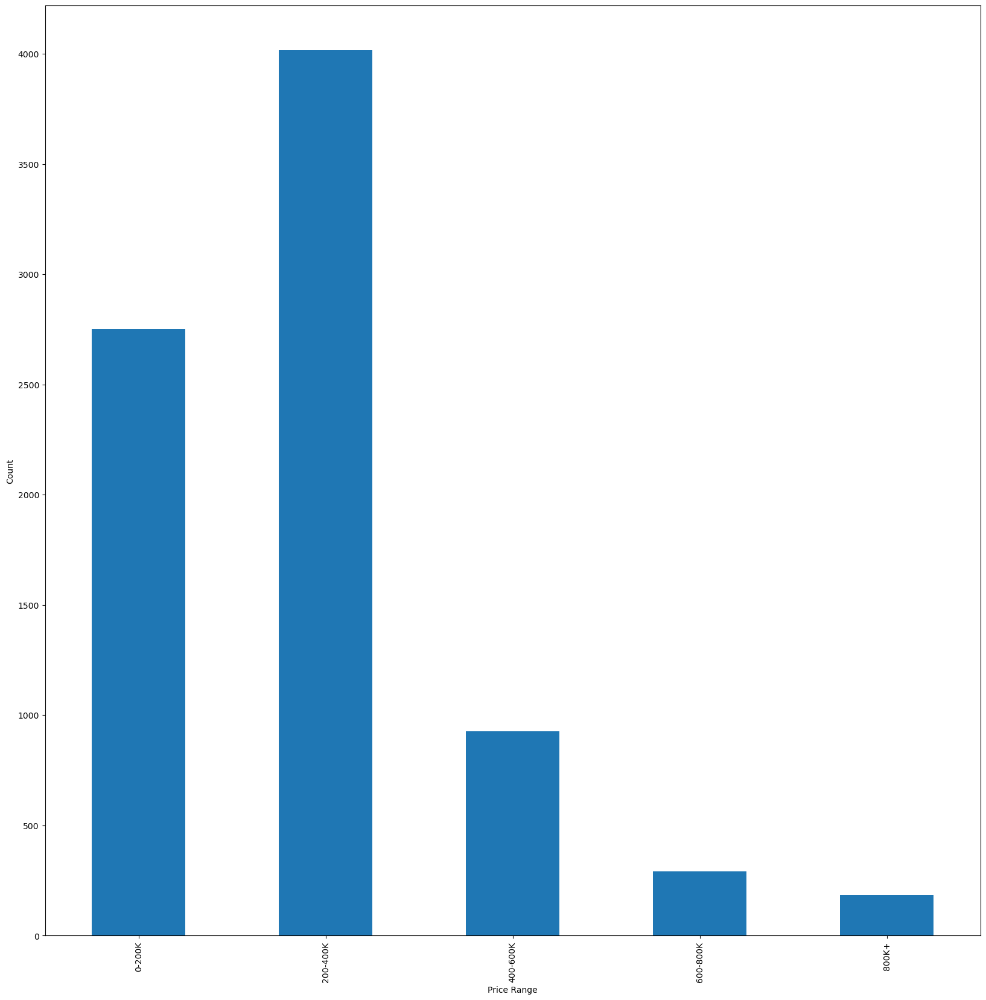

In [195]:
# create price range categories
bins = [0, 200000, 400000, 600000, 800000, 1000000]
labels = ['0-200K', '200-400K', '400-600K', '600-800K', '800K+']
df['price_range'] = pd.cut(df['predicted_values'], bins=bins, labels=labels)

# plot price range categories
fig, ax = plt.subplots()
df['price_range'].value_counts().sort_index().plot(kind='bar', ax=ax)
ax.set_xlabel('Price Range')
ax.set_ylabel('Count')
plt.show()

Parece que cada modelo se ha desempeñado de manera diferente en cada rango de datos, con algunos rangos que tienen números más altos de predicciones correctas (por ejemplo, el rango de 200k-400k) y otros que tienen números más bajos de predicciones correctas (por ejemplo, el rango de 1M+). El número de predicciones correctas también parece variar entre los modelos, y cada modelo funciona mejor en ciertos rangos de datos que en otros.
Sería útil explorar por qué ciertos modelos son más adecuados para ciertos rangos de ingresos e investigar formas de mejorar el rendimiento de cada modelo en todos los rangos de ingresos.

In [196]:
lgb_dataset_prediction['predicted_price'] = y_pred_pred

In [197]:
lgb_dataset_prediction

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,dist_city_center,dist_closest_station,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price,predicted_price
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.026455,0.094111,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850,225978.626125
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.582409,0.902561,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725,458701.634084
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2.663025,0.188177,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950,254891.633045
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.910067,0.892917,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750,350085.327102
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.727149,0.293784,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990,333183.318421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8497,49,0.000000,2.040816,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.317748,0.285426,Sant Antoni,estudio,norte,Unknown,40 - 70,5 - 10,907,179948.203513
8498,125,0.800000,0.800000,0.0,0.0,0.0,0.0,1.0,0.0,1.0,4.063099,0.534462,La Font d'En Fargues,piso,Unknown,na,0 - 40,0 - 4,950,634285.601607
8499,48,4.166667,2.083333,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.288753,0.261938,El Raval,piso,Unknown,electric,120 - 150,0 - 4,950,167191.814401
8500,51,3.921569,1.960784,1.0,0.0,1.0,0.0,1.0,0.0,1.0,3.909033,0.545561,La Maternitat i Sant Ramon,piso,Unknown,Unknown,Unknown,0 - 4,926,241169.014306


In [198]:
# calcular la métrica de Break-even
break_even = lgb_dataset_prediction['predicted_price'] / lgb_dataset_prediction['price']

# agregar la métrica de Break-even como una nueva columna en el DataFrame
lgb_dataset_prediction['break_even'] = break_even

# agregar la métrica de Break-even anual como una nueva columna en el DataFrame
break_even_years = lgb_dataset_prediction['break_even'] / 12

# agregar la métrica de Break-even como una nueva columna en el DataFrame
lgb_dataset_prediction['break_even_years'] = break_even_years

In [199]:
lgb_dataset_prediction

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,...,neighborhood,property_type,orientation,heating,property_age_cat,floor_cat,price,predicted_price,break_even,break_even_years
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,Gràcia,piso,norte,Unknown,Unknown,0 - 4,850,225978.626125,265.857207,22.154767
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,Sant Gervasi - La Bonanova,piso,sur,Unknown,40 - 70,0 - 4,725,458701.634084,632.691909,52.724326
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,El Baix Guinardó,piso,Unknown,Unknown,Unknown,Unknown,950,254891.633045,268.306982,22.358915
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,Sant Gervasi - La Bonanova,piso,norte,Unknown,70 - 120,Unknown,750,350085.327102,466.780436,38.898370
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,Sarrià-Sant Gervasi,piso,sur,gas,Unknown,0 - 4,990,333183.318421,336.548806,28.045734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8497,49,0.000000,2.040816,0.0,1.0,1.0,0.0,1.0,0.0,0.0,...,Sant Antoni,estudio,norte,Unknown,40 - 70,5 - 10,907,179948.203513,198.399342,16.533279
8498,125,0.800000,0.800000,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,La Font d'En Fargues,piso,Unknown,na,0 - 40,0 - 4,950,634285.601607,667.669054,55.639088
8499,48,4.166667,2.083333,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,El Raval,piso,Unknown,electric,120 - 150,0 - 4,950,167191.814401,175.991384,14.665949
8500,51,3.921569,1.960784,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,La Maternitat i Sant Ramon,piso,Unknown,Unknown,Unknown,0 - 4,926,241169.014306,260.441700,21.703475


In [200]:
# Check the data types and summary statistics of the numerical columns
print(lgb_dataset_prediction.dtypes)
print(lgb_dataset_prediction.describe())

sq_meters_built            int64
rooms_per_sqm            float64
bathrooms_per_sqm        float64
balcony                  float64
terrace                  float64
exterior                 float64
rooftop                  float64
elevator                 float64
pool                     float64
ac                       float64
dist_city_center         float64
dist_closest_station     float64
neighborhood            category
property_type           category
orientation             category
heating                 category
property_age_cat        category
floor_cat               category
price                      int64
predicted_price          float64
break_even               float64
break_even_years         float64
dtype: object
       sq_meters_built  rooms_per_sqm  bathrooms_per_sqm      balcony  \
count      8502.000000    8502.000000        8502.000000  8502.000000   
mean         72.478711       2.960772           1.930918     0.409904   
std          49.650215       1.375317    

La variable "predicted_price" tiene una media de 331738,8 y una desviación estándar de 326190,6. El valor mínimo es de -171095.5 y el valor máximo es de 4591506. Los precios predichos varían ampliamente, desde valores negativos, que no es bueno para lo que estamos tratando de predecir hasta valores muy altos. El modelo nos muestra ciertos errores.

La variable "break_even_years" tiene una media de 24.1 meses y una desviación estándar de 10.0. El valor mínimo es de -17.7 y el valor máximo es de 222.5. Esto indica que los años necesarios para alcanzar el punto de equilibrio varían ampliamente entre las observaciones, desde años negativos hasta años muy altos. Valores no muy coherentes para nuestro caso de uso.

In [201]:
# Check for missing values
print(lgb_dataset_prediction.isnull().sum())


sq_meters_built         0
rooms_per_sqm           0
bathrooms_per_sqm       0
balcony                 0
terrace                 0
exterior                0
rooftop                 0
elevator                0
pool                    0
ac                      0
dist_city_center        0
dist_closest_station    0
neighborhood            0
property_type           0
orientation             0
heating                 0
property_age_cat        0
floor_cat               0
price                   0
predicted_price         0
break_even              0
break_even_years        0
dtype: int64


In [202]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


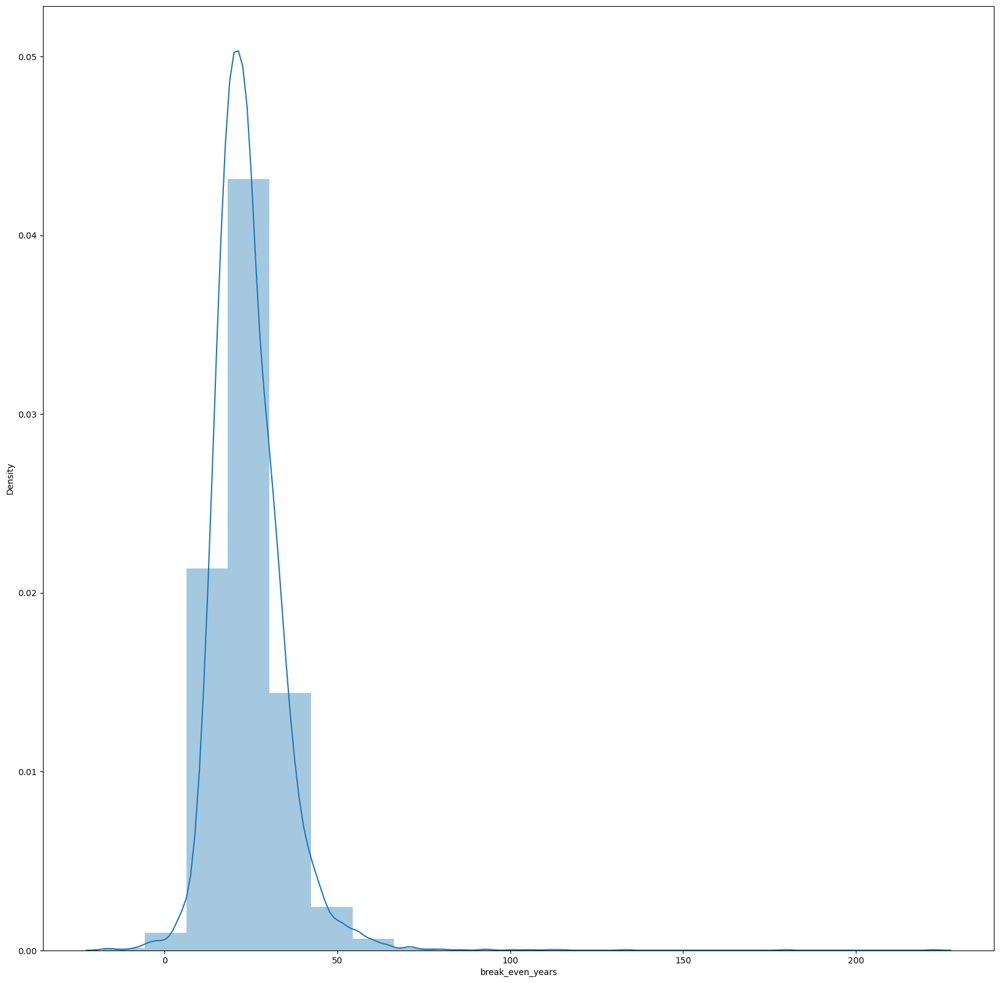

In [203]:
# Explore the distribution of the break_even metric
sns.distplot(lgb_dataset_prediction['break_even_years'], bins=20)
plt.show()


La mayoría de las viviendas se centran entre los 0 y 50 años de recuperación de inversión.

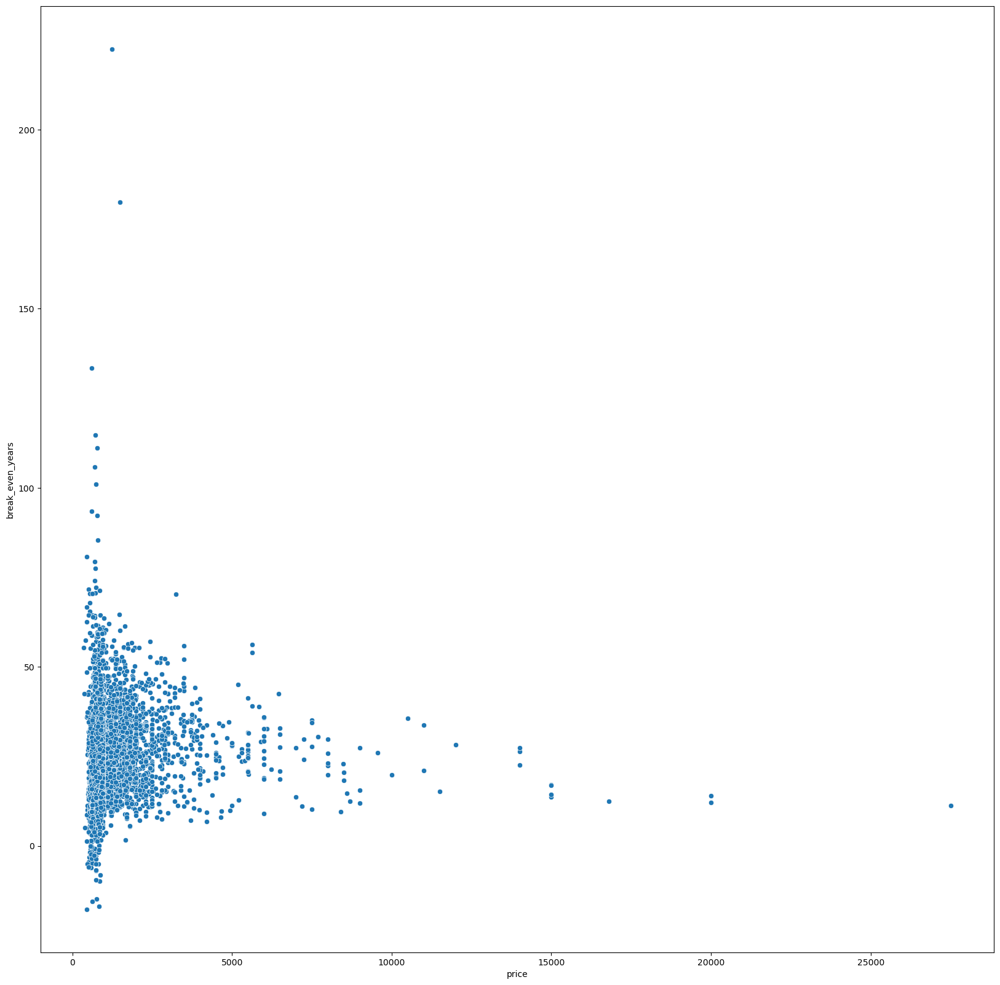

In [204]:
# Explore the relationship between price and break_even
sns.scatterplot(data=lgb_dataset_prediction, x='price', y='break_even_years')
plt.show()



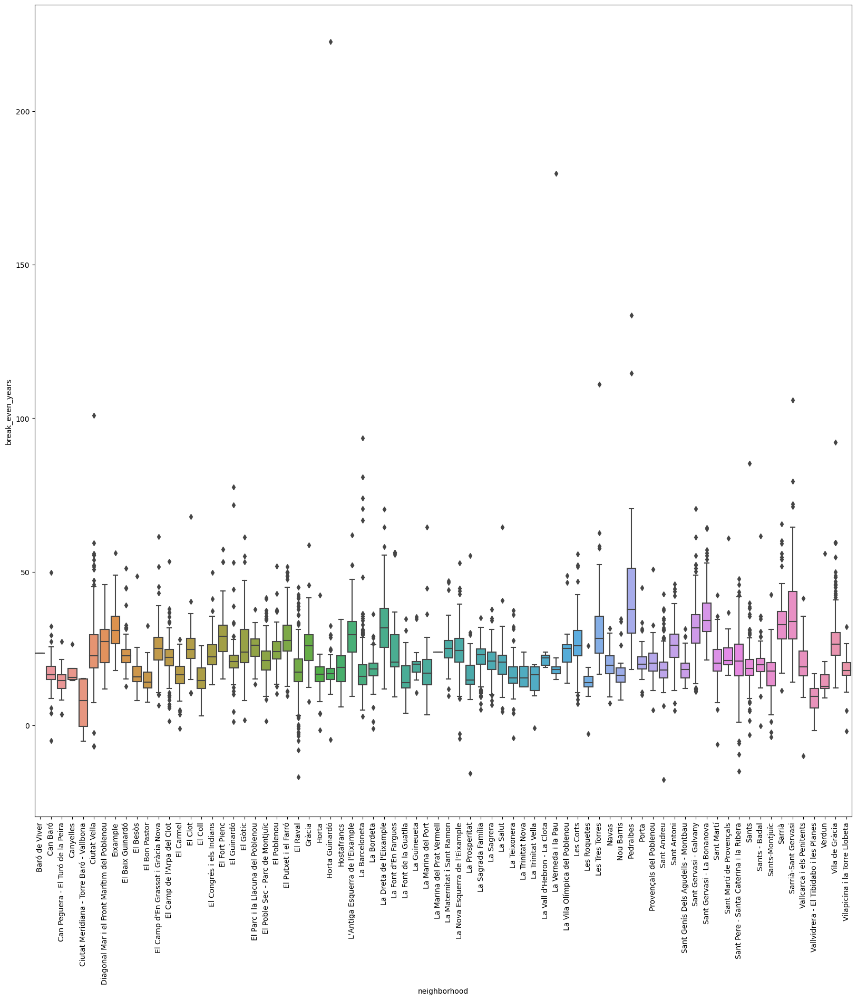

In [205]:
# Explore the relationship between neighborhood and break_even
sns.boxplot(data=lgb_dataset_prediction, x='neighborhood', y='break_even_years')
plt.xticks(rotation=90)
plt.show()



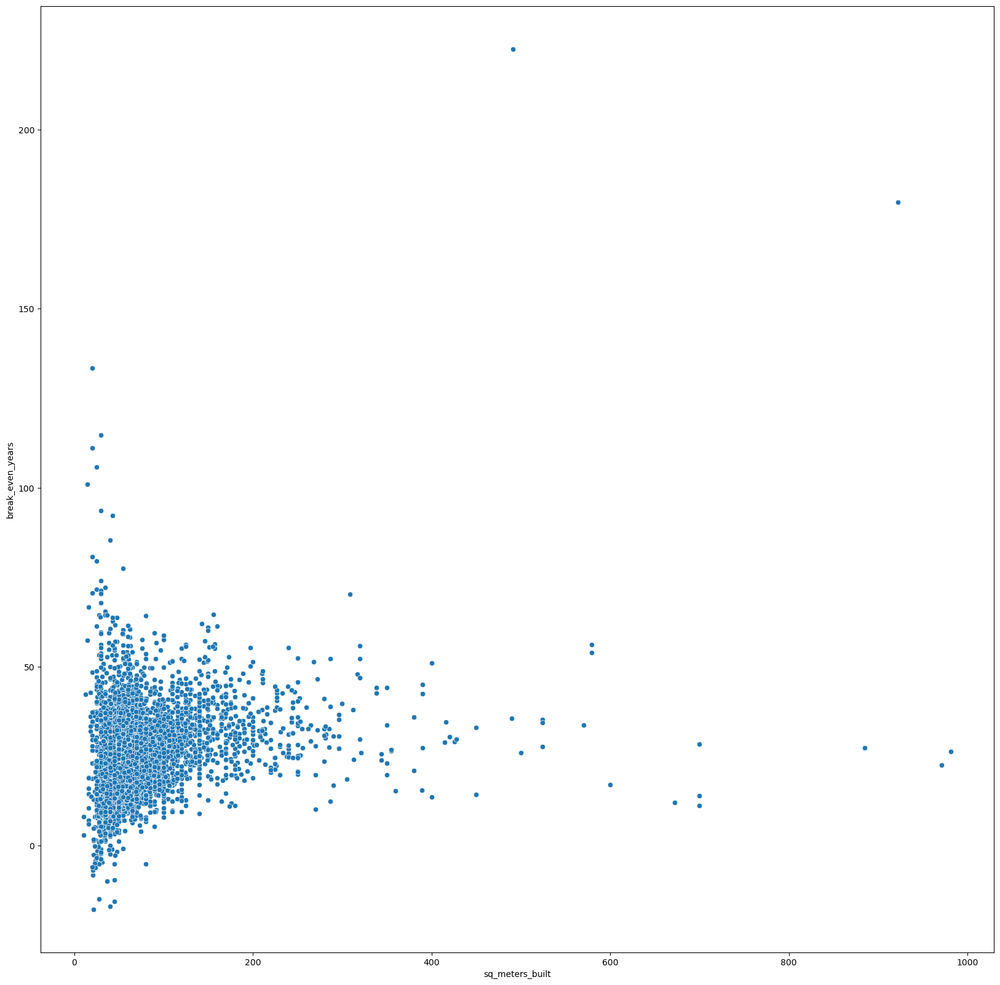

In [206]:
# Explore the relationship between rooms per sqm and break_even
sns.scatterplot(data=lgb_dataset_prediction, x='sq_meters_built', y='break_even_years')
plt.show()

Existe una conglomeración de valores entre 0 y 200 sq_meters_buitl y entre los 0 y 50 años.

In [207]:
bins = [0, 10, 20, 30, 40, 50, float('inf')]

# use pd.cut to group the values into bins
lgb_dataset_prediction['value_range'] = pd.cut(lgb_dataset_prediction['break_even_years'], bins=bins)

# print the dataframe grouped by value range
print(lgb_dataset_prediction.groupby('value_range').size())

value_range
(0.0, 10.0]      218
(10.0, 20.0]    2776
(20.0, 30.0]    3582
(30.0, 40.0]    1435
(40.0, 50.0]     319
(50.0, inf]      136
dtype: int64


In [208]:
lgb_dataset_prediction

,sq_meters_built,rooms_per_sqm,bathrooms_per_sqm,balcony,terrace,exterior,rooftop,elevator,pool,ac,...,property_type,orientation,heating,property_age_cat,floor_cat,price,predicted_price,break_even,break_even_years,value_range
0,55,3.636364,1.818182,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,piso,norte,Unknown,Unknown,0 - 4,850,225978.626125,265.857207,22.154767,"(20.0, 30.0]"
1,37,5.405405,2.702703,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,piso,sur,Unknown,40 - 70,0 - 4,725,458701.634084,632.691909,52.724326,"(50.0, inf]"
2,72,4.166667,1.388889,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,piso,Unknown,Unknown,Unknown,Unknown,950,254891.633045,268.306982,22.358915,"(20.0, 30.0]"
3,45,2.222222,2.222222,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,piso,norte,Unknown,70 - 120,Unknown,750,350085.327102,466.780436,38.898370,"(30.0, 40.0]"
4,45,2.222222,2.222222,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,piso,sur,gas,Unknown,0 - 4,990,333183.318421,336.548806,28.045734,"(20.0, 30.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8497,49,0.000000,2.040816,0.0,1.0,1.0,0.0,1.0,0.0,0.0,...,estudio,norte,Unknown,40 - 70,5 - 10,907,179948.203513,198.399342,16.533279,"(10.0, 20.0]"
8498,125,0.800000,0.800000,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,piso,Unknown,na,0 - 40,0 - 4,950,634285.601607,667.669054,55.639088,"(50.0, inf]"
8499,48,4.166667,2.083333,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,piso,Unknown,electric,120 - 150,0 - 4,950,167191.814401,175.991384,14.665949,"(10.0, 20.0]"
8500,51,3.921569,1.960784,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,piso,Unknown,Unknown,Unknown,0 - 4,926,241169.014306,260.441700,21.703475,"(20.0, 30.0]"


In [209]:
# define the bins
bins = [0, 10, 20, 30, 40, 50, float('inf')]

# use pd.cut to group the values into bins
lgb_dataset_prediction['value_range'] = pd.cut(lgb_dataset_prediction['break_even_years'], bins=bins)

# print the dataframe grouped by value range
print(lgb_dataset_prediction.groupby('value_range')['neighborhood'].unique())

value_range
(0.0, 10.0]     ['Sants', 'Sants - Badal', 'Sant Pere - Santa ...
(10.0, 20.0]    ['Hostafrancs', 'La Nova Esquerra de l'Eixampl...
(20.0, 30.0]    ['Gràcia', 'El Baix Guinardó', 'Sarrià-Sant Ge...
(30.0, 40.0]    ['Sant Gervasi - La Bonanova', 'El Poblenou', ...
(40.0, 50.0]    ['Vila de Gràcia', 'Sant Gervasi - Galvany', '...
(50.0, inf]     ['Sant Gervasi - La Bonanova', 'Sarrià-Sant Ge...
Name: neighborhood, dtype: object


In [210]:
# print the neighborhood list for each value range
for value_range, group_data in lgb_dataset_prediction.groupby('value_range'):
    print(f"Value range: {value_range}")
    print(f"Neighborhoods: {list(group_data['neighborhood'].unique())}")
    print(f"Number of listings: {len(group_data)}")
    print()

Value range: (0.0, 10.0]
Neighborhoods: ['Sants', 'Sants - Badal', 'Sant Pere - Santa Caterina i la Ribera', 'Ciutat Vella', 'El Coll', 'El Raval', 'El Gòtic', 'La Barceloneta', 'Can Baró', 'La Teixonera', 'Vilapicina i la Torre Llobeta', 'La Prosperitat', 'El Guinardó', "El Camp de l'Arpa del Clot", 'La Font de la Guatlla', 'Hostafrancs', 'La Bordeta', 'La Sagrada Família', 'La Maternitat i Sant Ramon', 'El Carmel', 'Can Peguera - El Turó de la Peira', 'Sant Andreu', "L'Antiga Esquerra de l'Eixample", 'Gràcia', "La Nova Esquerra de l'Eixample", 'Sants-Montjuïc', 'Sant Antoni', 'El Poble Sec - Parc de Montjuïc', 'La Salut', 'Sant Martí', "La Font d'En Fargues", 'Les Corts', 'Vallcarca i els Penitents', 'El Putxet i el Farró', 'Navas', 'Provençals del Poblenou', 'Nou Barris', 'Vallvidrera - El Tibidabo i les Planes', 'La Sagrera', 'El Bon Pastor', 'El Besòs', 'Verdun', 'La Marina del Port', 'Horta', 'Les Roquetes', "El Camp d'En Grassot i Gràcia Nova", 'Porta', 'Ciutat Meridiana - Torre

Aparatemente y según los datos arrojados por el modelo, los barrios más rentables y que se pueden pagar en plazos razonables son:
rango 0 - 10 son: Sants y Sants - Badal, con 8 viviendas cada uno.
rango 10 - 20,0 son: Provençals del Poblenou y La Nova Esquerra de l'Eixample, ambos con 11 predicciones cada uno.
rango 20 - 30 son Sarrià-Sant Gervasi, con 54 viviendas, y Gràcia, con 29 viviendas.


Comparando ambas predicciones de Catboost u LGBboots, podemos notar que los valores promedio de predicted_price, break_even y break_even_years son mayores en LGB, lo que indica que EL modelo de predicción tienen un mejor desempeño en general. Además, los valores mínimo y máximo de predicted_price son más realistas en comparación con los valores extremos de Catboost.

Sin embargo, hay una diferencia notable en los valores negativos de predicted_price y break_even_years en LGB, lo que puede ser indicativo de que esré sobrestimando o subestimando el precio de las propiedades.

Como conclusión puedo decir que ha sido un trabajo muy largo, donde intenté comparar resultados de todos los modelos para saber cuál es el que obtiene mejores resultados, quizás tendría que haber dedicado más tiempo a mejorarlos con respecto a ajustar y jugar un poco más con sus parámetros para obtener valores de entrenamiento y validación mucho mejores y no caer tanto en el sobreajduste en cada uno de ellos. 
Fue muy interesante aprender sobre el shap analysys, porque da muy buen nivel de detalle de cada variable y sobretodo de una manera visual muy entendible que ayuda a sacar conclusiones a través de sus gráficos. 
Finalmente fue muy bueno el ejercicio para determinar cual de las viviendas son más rentables. Aunque se obtuvieron valores negativos, creo que debería limitar aún más el dataset con aquella viviendas que entran en un rango acorde a nuestro caso de uso y para obtener mejores resultados.